In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"farahfatnassi","key":"66224aa0abf0eab70baa28ea3ef65ce5"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d majorproject24/swedish-leaf-dataset


Dataset URL: https://www.kaggle.com/datasets/majorproject24/swedish-leaf-dataset
License(s): CC0-1.0
100% 4.52G/4.52G [02:59<00:00, 21.7MB/s]
100% 4.52G/4.52G [02:59<00:00, 27.1MB/s]


In [ ]:
!unzip swedish-leaf-dataset.zip -d ./dataset


Archive:  swedish-leaf-dataset.zip
  inflating: ./dataset/Swedish/Test/Leaf 0/1056.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1057.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1058.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1059.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1060.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1061.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1062.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1063.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1064.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1065.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1066.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1067.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1068.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1069.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1070.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1071.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1072.jpg  
  inflating: ./dataset/Swedish/Test/Leaf 0/1073

In [ ]:

import os

# Path where the dataset was extracted
dataset_path = './dataset'  # Update this path if you used a different one

# List files and directories in the dataset path
for root, dirs, files in os.walk(dataset_path):
    print(f"Directory: {root}")
    for file in files[:5]:  # Display up to 5 files for clarity
        print(f"File: {file}")
    break  # Only show the top-level directory contents


Directory: ./dataset


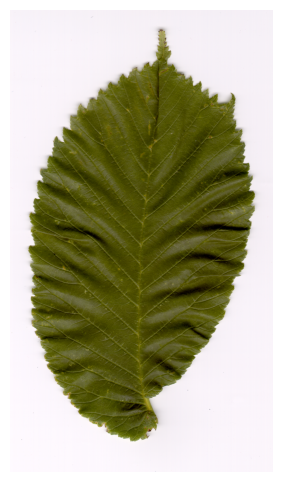

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Choose a sample image from the extracted dataset
sample_image_path = '/content/dataset/Swedish/Train/Leaf 0/1000.jpg'  # Replace 'example_image.jpg' with an actual image file

# Open and display the image
if os.path.exists(sample_image_path):
    image = Image.open(sample_image_path)
    plt.imshow(image)
    plt.axis('off')  # Hide the axes for better visualization
    plt.show()
else:
    print("Sample image not found. Check the directory path and file name.")


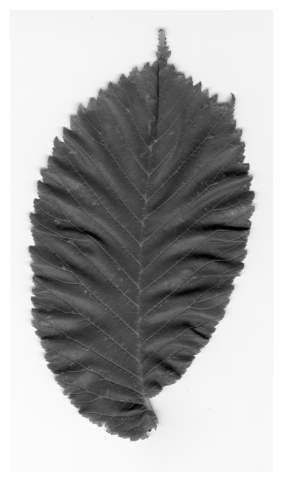

In [ ]:
# Example: Applying a grayscale transformation to the image
import cv2
import numpy as np

# Convert the PIL image to a NumPy array
image_array = np.array(image)

# Convert to grayscale using OpenCV
gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

# Display the grayscale image
plt.imshow(gray_image, cmap='gray')
plt.axis('off')  # Hide axes for a cleaner view
plt.show()

# Convert to binary image using thresholding
_, binary_image = cv2.threshold(gray_image, 225, 255, cv2.THRESH_BINARY_INV)

#Step 1: Convert the binary image to the correct format (uint8)
binary_image = (binary_image * 255).astype(np.uint8)




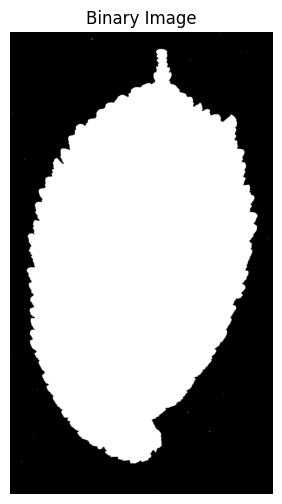

In [ ]:
# Plot the binary image
plt.imshow(binary_image, cmap='gray')
plt.title("Binary Image")
plt.axis('off')

plt.show()

In [ ]:
!pip install --upgrade scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 13.2 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1


In [ ]:
import scipy
print(scipy.__version__)

1.13.1


In [ ]:
from numpy.core.multiarray import concatenate
import cv2
import numpy as np
from tensorflow import keras
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import CubicSpline
#from scipy.integrate import cumtrapz
from scipy.integrate import cumulative_trapezoid

def reparametrage_affine2(X, Y, N):
    # Parameterize the curve using cubic splines
    n = len(X)
    t = np.linspace(0, 1, n)

    px = CubicSpline(t, X)
    py = CubicSpline(t, Y)

    # Resample the curve with specified number of points
    X1, Y1, L = abscisse_affine2(t, px, py, N)

    return X1, Y1, L

def abscisse_affine2(t, px, py, N):
    # Compute the derivatives of the splines
    dp_x = px.derivative()
    dp2_x = dp_x.derivative()

    dp_y = py.derivative()
    dp2_y = dp_y.derivative()

    # Compute the first and second derivatives
    X1 = dp_x(t)
    X2 = dp2_x(t)
    Y1 = dp_y(t)
    Y2 = dp2_y(t)

    # Compute the integrand for arc length
    F = np.abs(X1 * Y2 - Y1 * X2)**(1/3)
    I = cumulative_trapezoid(F, t, initial=0)

    # Compute the normalized arc length
    if np.max(I) == 0 or not np.isfinite(np.max(I)):
        s = np.zeros_like(t)
        L = 1
    else:
        s = I / np.max(I)
        L = s[-1]

    # Resample the curve based on normalized arc length
    unique_s, index = np.unique(s, return_index=True)
    out = np.interp(np.linspace(0, 1, N), unique_s, t[index])

    # Evaluate the splines at the resampled points
    X1_val = px(out)
    Y1_val = py(out)

    return X1_val/L, Y1_val/L, L



In [ ]:
from skimage import measure            # to find shape contour
import scipy.ndimage as ndi            # to determine shape centrality

# matplotlib setup
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = (6, 6)      # setting default size of plots

(10837, 2)


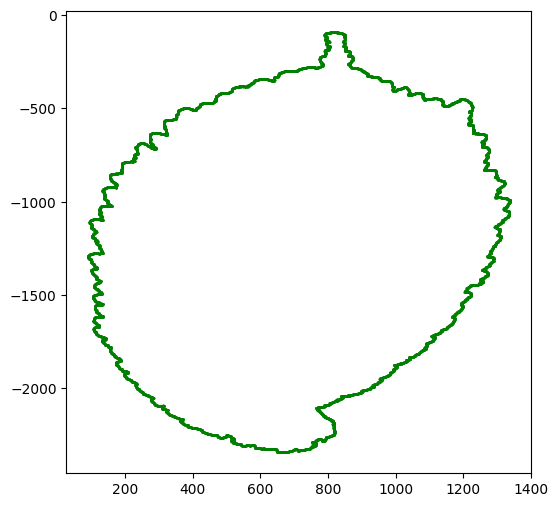

In [ ]:
# scikit-learn imaging contour finding, returns a list of found edges
contours = measure.find_contours(binary_image, .8)

# from which we choose the longest one
contour = max(contours, key=len)
print(contour.shape)


# Scatter plot with red dots, replacing the line plot
plt.scatter(contour[:, 1], -contour[:, 0], color='green', s=0.5) # (I will explain this [::,x] later)

plt.show()

(120,)
(120,)


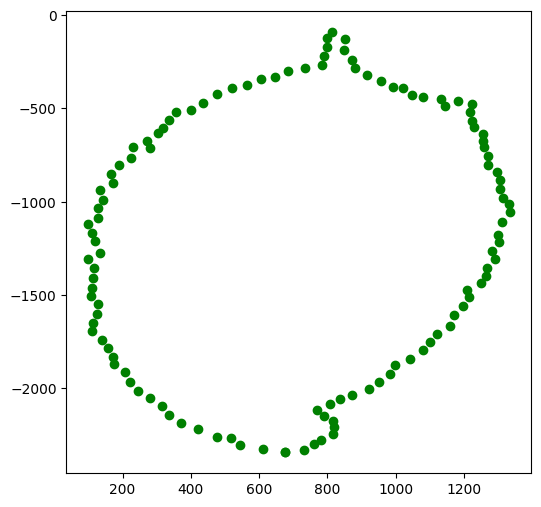

In [ ]:
# Resample and parameterize the contour
x_rep, y_rep, L = reparametrage_affine2(contour[::,1],-contour[::,0],120)
#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
#fig.suptitle('Image & contour')

image=binary_image
# Plot de l'image

print(x_rep.shape)
print(y_rep.shape)


#plt.plot(contour[::,1],-contour[::,0], label='contours original')
plt.scatter(x_rep,y_rep, label='contours reparamétré', color='green')



#ax2.set_xlim(0, image.shape[1])
#ax2.set_ylim(0, image.shape[0])
# Afficher les plots
plt.show()

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
from skimage import measure

# Define the function to apply the process
def process_image(image_path, label):
    # Open and display the image
    image = Image.open(image_path)

    # Convert the PIL image to a NumPy array
    image_array = np.array(image)

    # Convert to grayscale using OpenCV
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

    # Display the grayscale image
    #plt.imshow(gray_image, cmap='gray')
    #plt.axis('off')  # Hide axes for a cleaner view
    #plt.show()

    # Convert to binary image using thresholding
    _, binary_image = cv2.threshold(gray_image, 225, 255, cv2.THRESH_BINARY_INV)

    # Convert the binary image to the correct format (uint8)
    binary_image = (binary_image * 255).astype(np.uint8)

    # scikit-learn imaging contour finding, returns a list of found edges
    contours = measure.find_contours(binary_image, .8)

    # From which we choose the longest one
    if contours:
        contour = max(contours, key=len)
        print(f"Contour shape: {contour.shape}")

        # Display the contour on top of the binary image
        #plt.plot(contour[::,1], contour[::,0], linewidth=0.5)
        #plt.imshow(binary_image, cmap='Set3')
        #plt.show()

        # Resample and parameterize the contour (replace with your reparametrage_affine2 function)
        x_rep, y_rep, L = reparametrage_affine2(contour[::,1], -contour[::,0], 120)
        plt.plot(contour[::,1], -contour[::,0], linewidth=0.5)
        #plt.plot(x_rep,y_rep, label='contours reparamétré',  color='green')
        plt.scatter(x_rep,y_rep, label='contours reparamétré', color='red')
        plt.show()
        contours_final = np.concatenate((x_rep, y_rep))
        print(f"Final contour shape: {contours_final.shape}")
        return label, contours_final
    else:
        print(f"No contours found in image: {image_path}")
        return label, []



Processing image: /content/dataset/Swedish/Test/Leaf 11/2156.jpg
Contour shape: (5549, 2)


<ipython-input-13-d1f206fa02cb>:40: DeprecationWarning: 'scipy.integrate.cumtrapz' is deprecated in favour of 'scipy.integrate.cumulative_trapezoid' and will be removed in SciPy 1.14.0
  I = cumtrapz(F, t, initial=0)


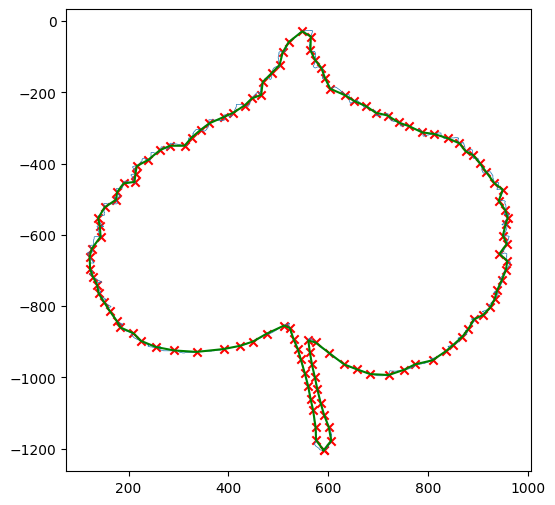

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2161.jpg
Contour shape: (4481, 2)


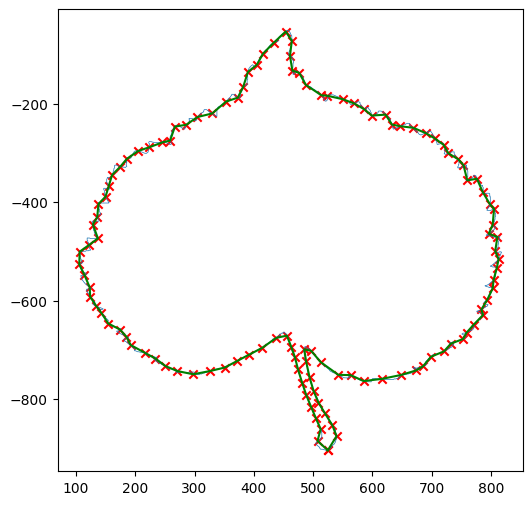

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2172.jpg
Contour shape: (8585, 2)


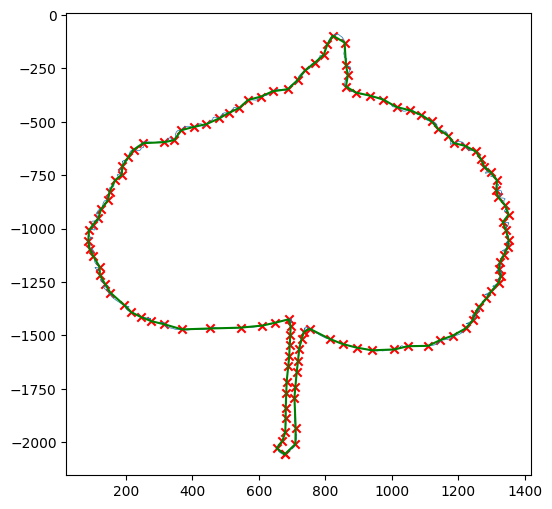

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2160.jpg
Contour shape: (6319, 2)


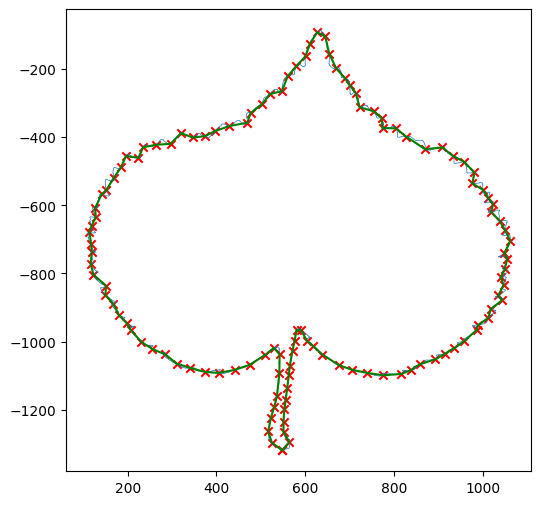

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2164.jpg
Contour shape: (5747, 2)


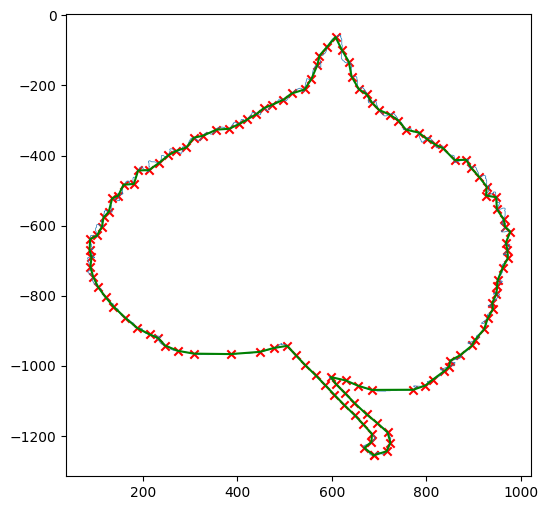

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2169.jpg
Contour shape: (6123, 2)


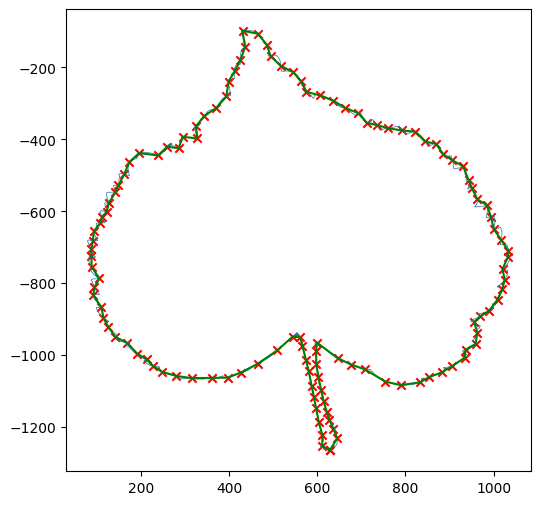

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2174.jpg
Contour shape: (8191, 2)


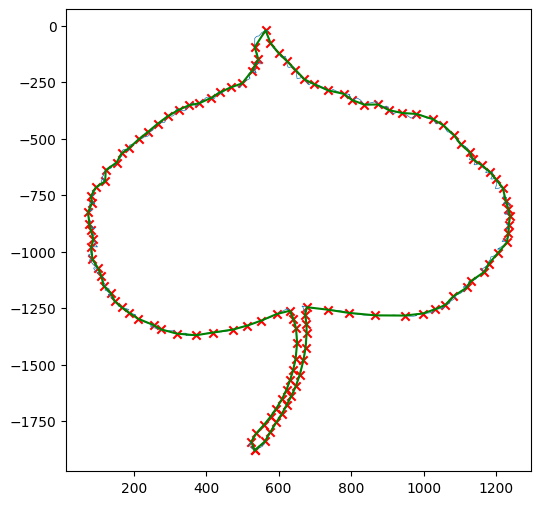

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2159.jpg
Contour shape: (5651, 2)


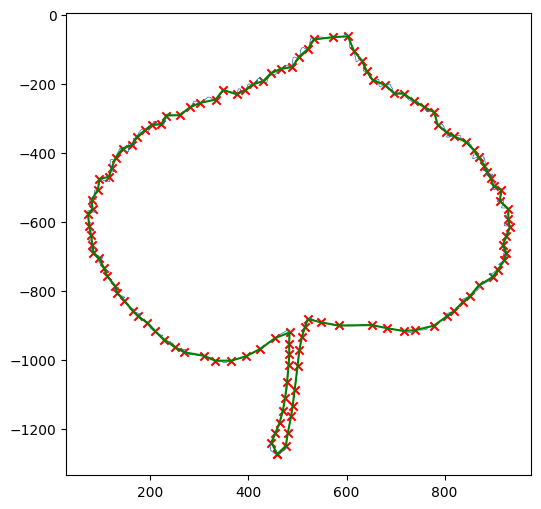

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2165.jpg
Contour shape: (7093, 2)


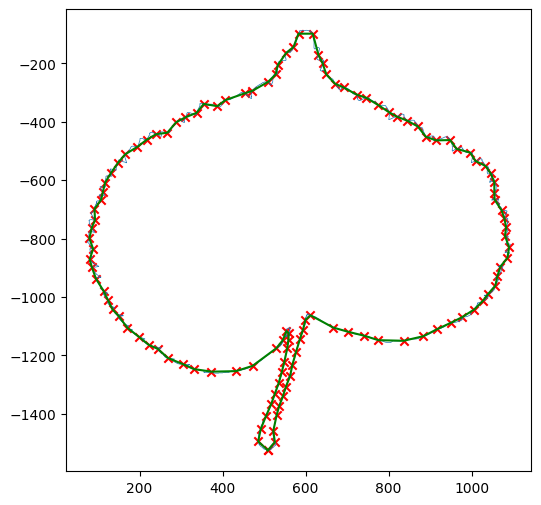

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2167.jpg
Contour shape: (6067, 2)


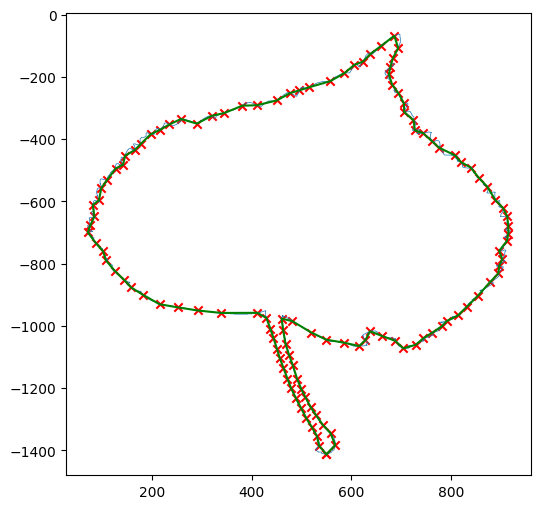

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2162.jpg
Contour shape: (3957, 2)


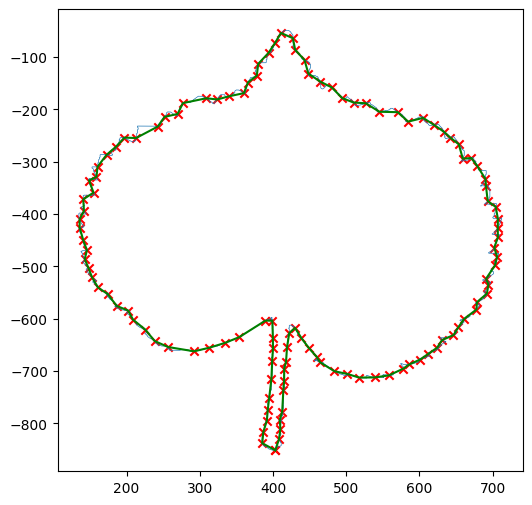

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2163.jpg
Contour shape: (7389, 2)


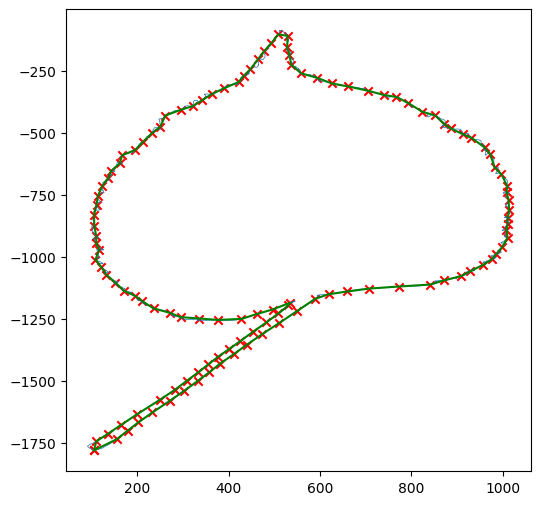

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2166.jpg
Contour shape: (6895, 2)


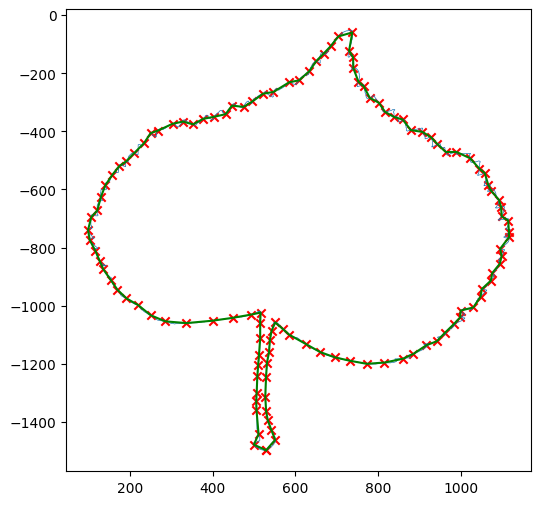

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2158.jpg
Contour shape: (5817, 2)


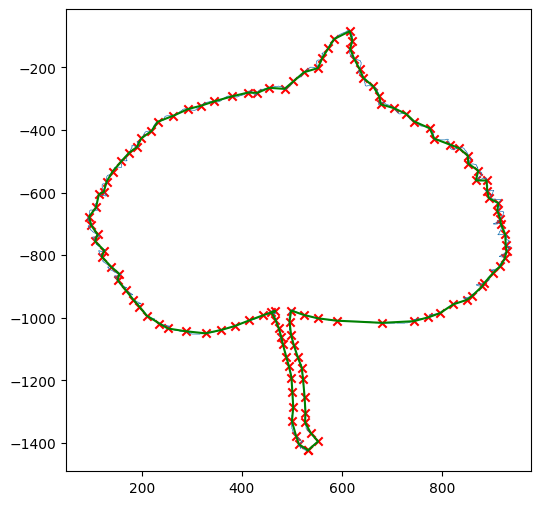

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2157.jpg
Contour shape: (5855, 2)


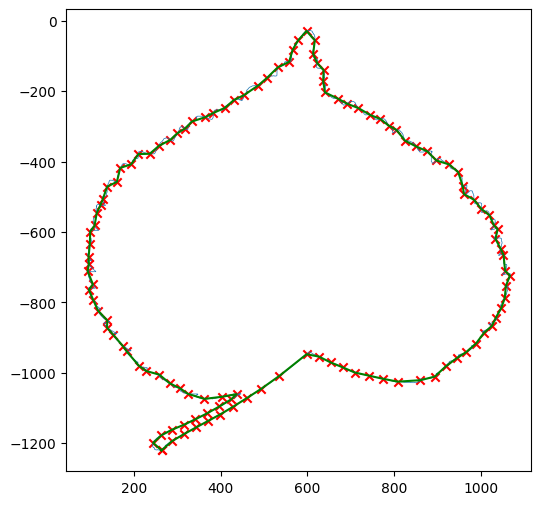

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2168.jpg
Contour shape: (4545, 2)


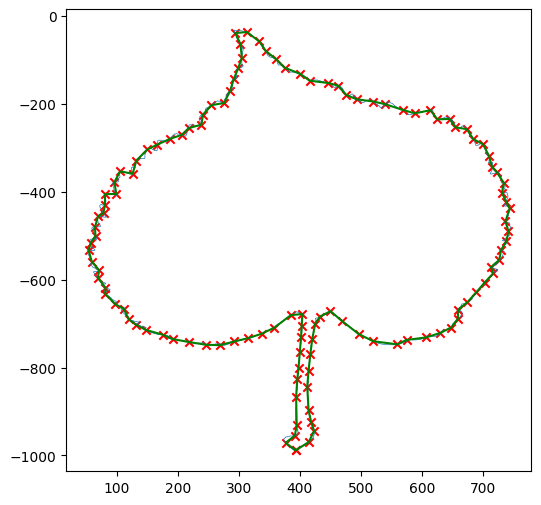

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2173.jpg
Contour shape: (8367, 2)


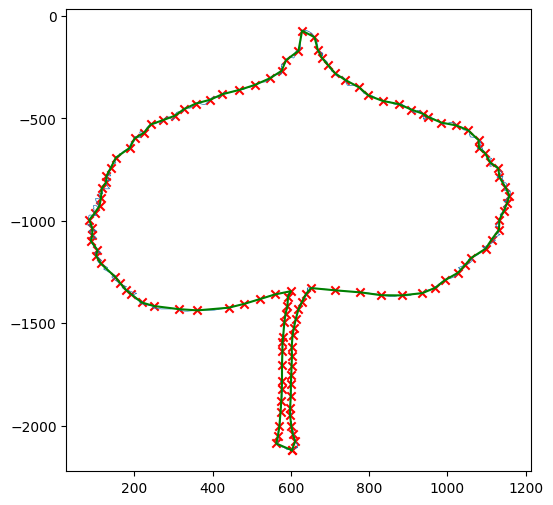

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2171.jpg
Contour shape: (5365, 2)


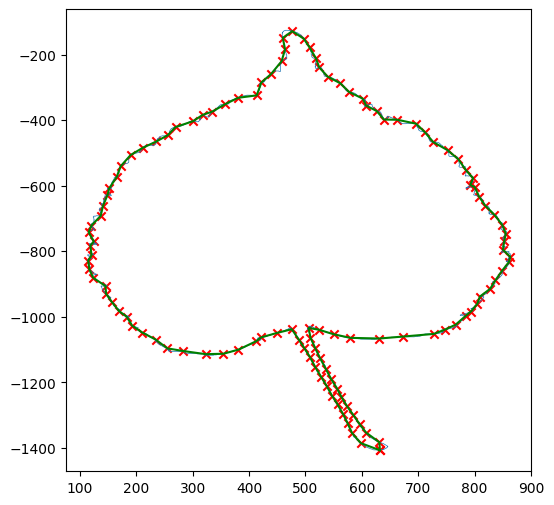

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 11/2170.jpg
Contour shape: (8465, 2)


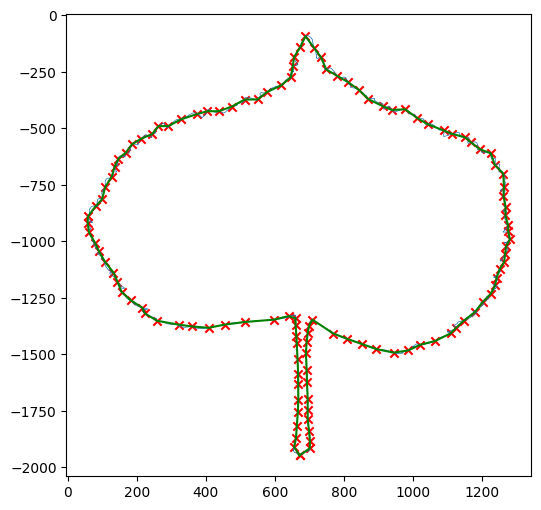

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1564.jpg
Contour shape: (8007, 2)


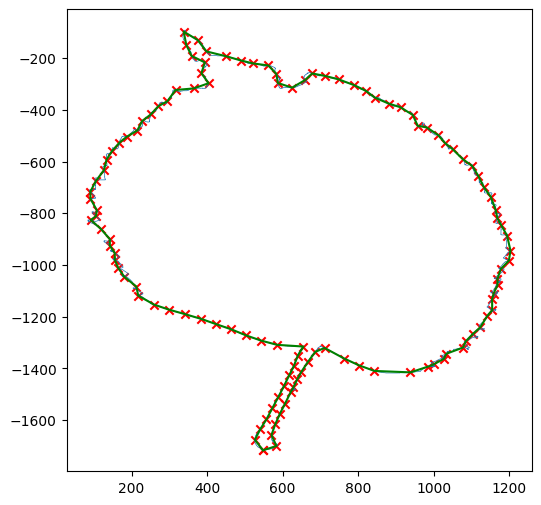

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1574.jpg
Contour shape: (6963, 2)


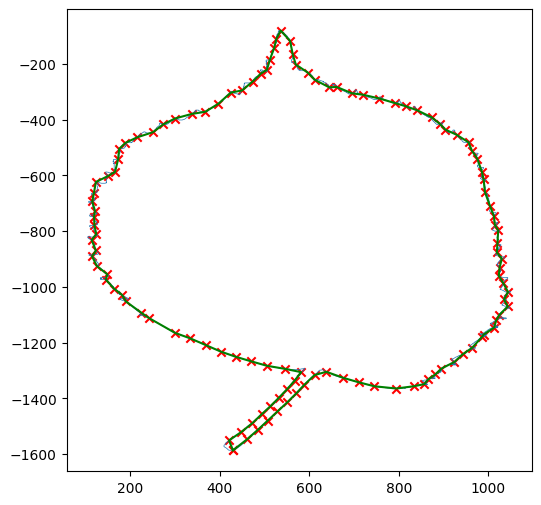

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1562.jpg
Contour shape: (6807, 2)


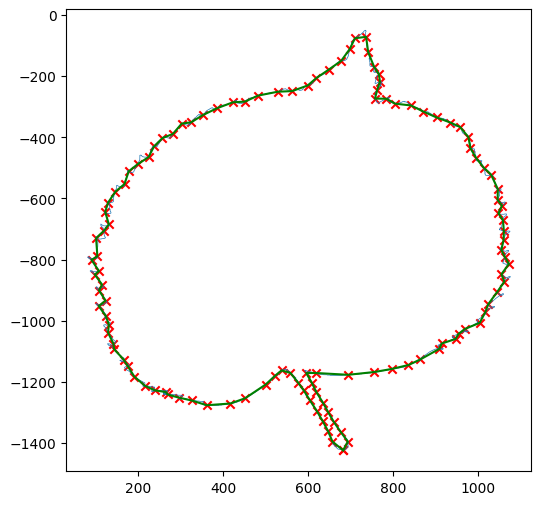

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1572.jpg
Contour shape: (4701, 2)


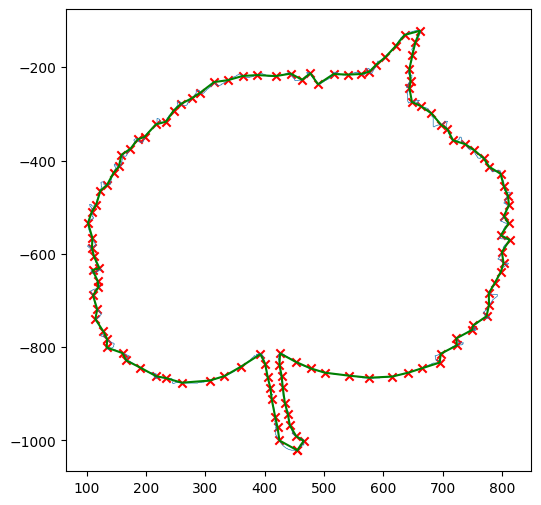

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1570.jpg
Contour shape: (7339, 2)


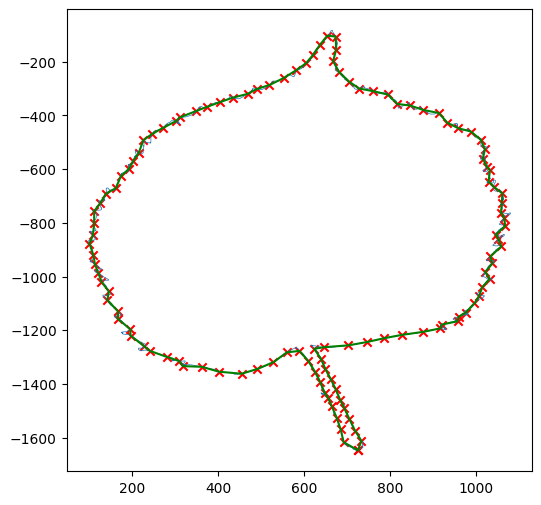

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1571.jpg
Contour shape: (4465, 2)


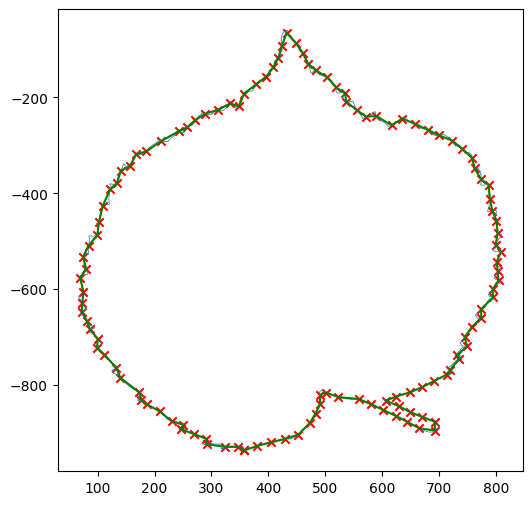

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1566.jpg
Contour shape: (6321, 2)


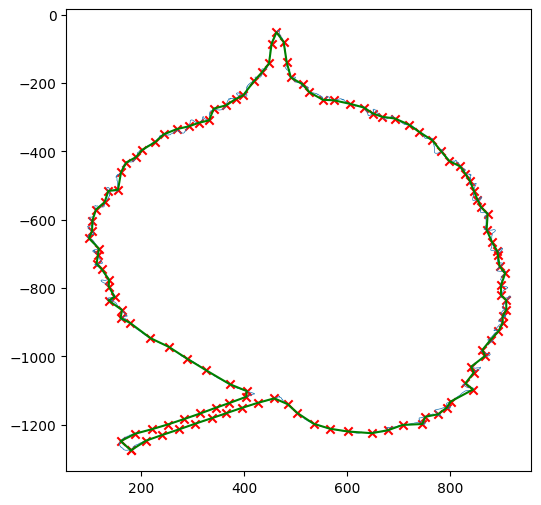

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1556.jpg
Contour shape: (6191, 2)


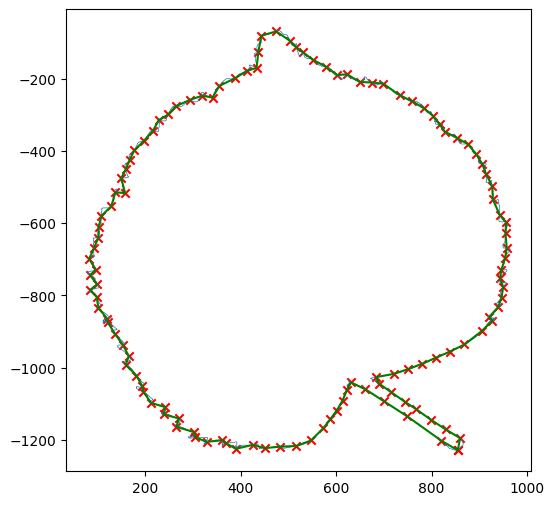

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1559.jpg
Contour shape: (7485, 2)


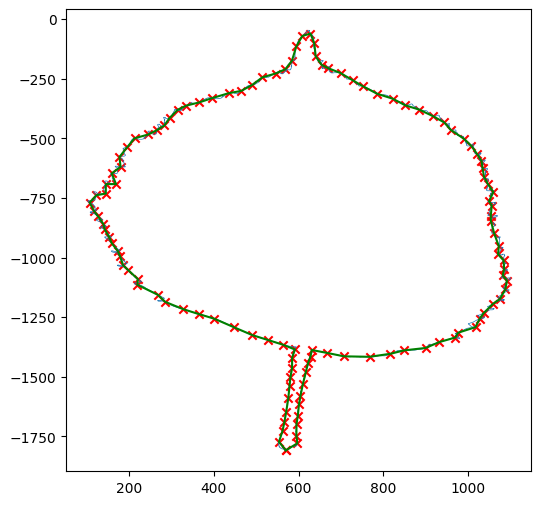

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1568.jpg
Contour shape: (7203, 2)


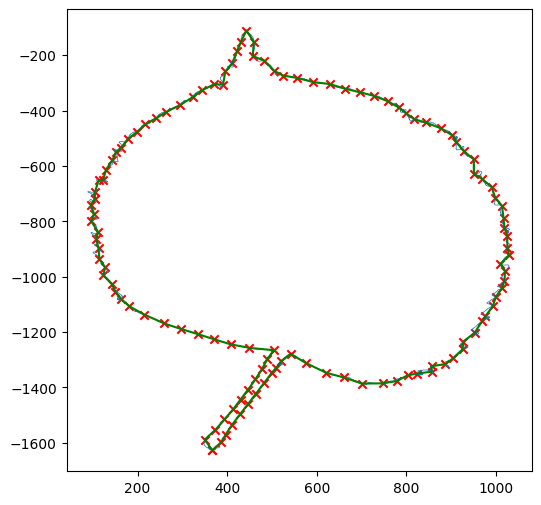

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1561.jpg
Contour shape: (6023, 2)


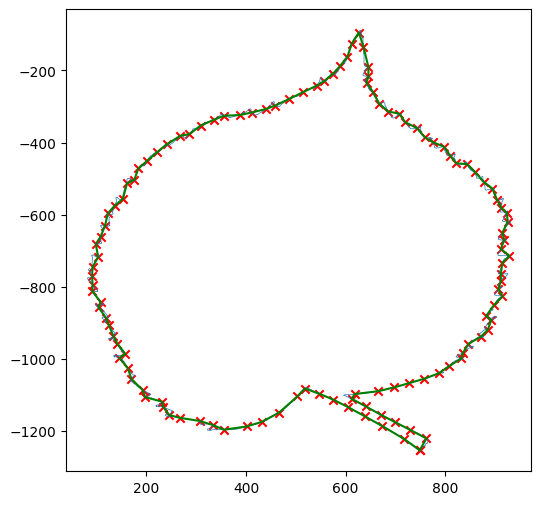

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1557.jpg
Contour shape: (5445, 2)


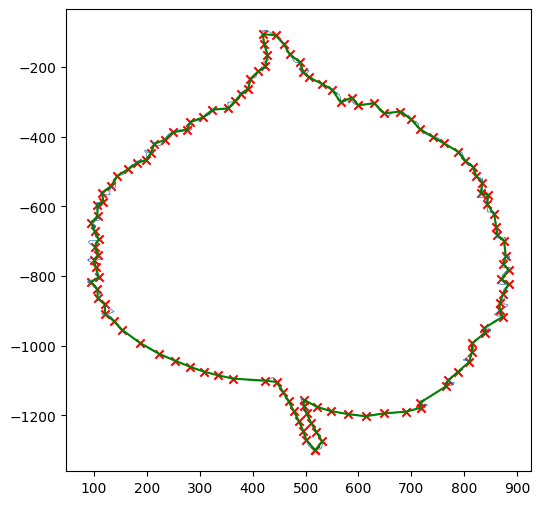

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1569.jpg
Contour shape: (6831, 2)


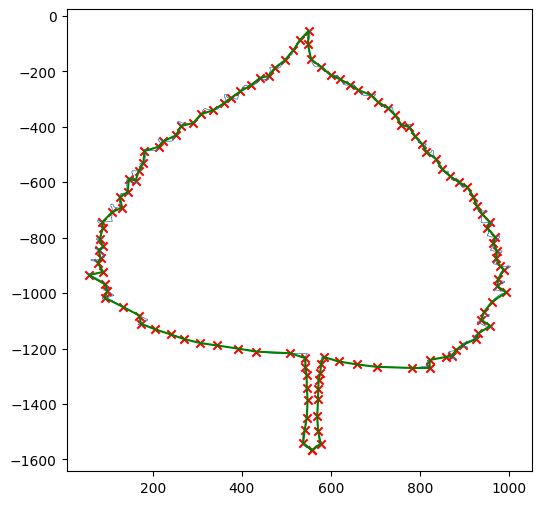

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1558.jpg
Contour shape: (6161, 2)


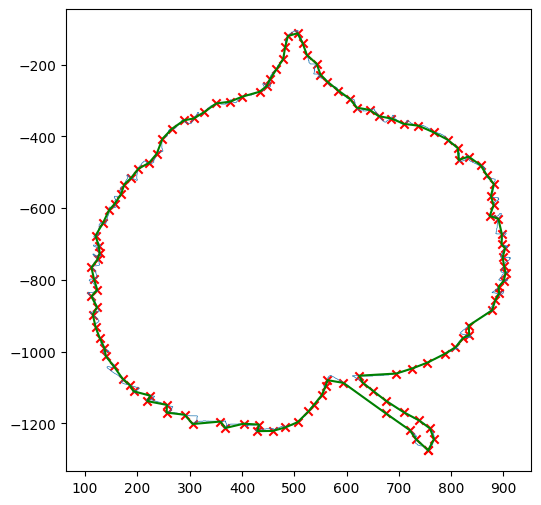

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1565.jpg
Contour shape: (8327, 2)


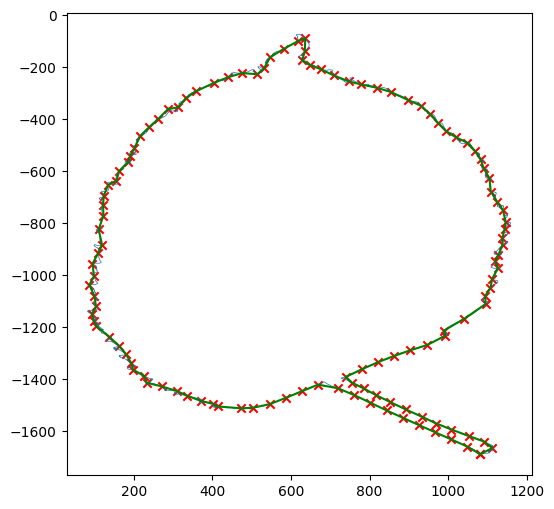

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1560.jpg
Contour shape: (4541, 2)


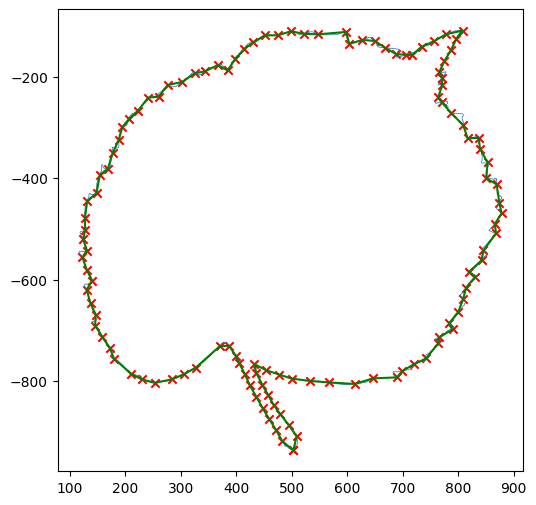

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1567.jpg
Contour shape: (6105, 2)


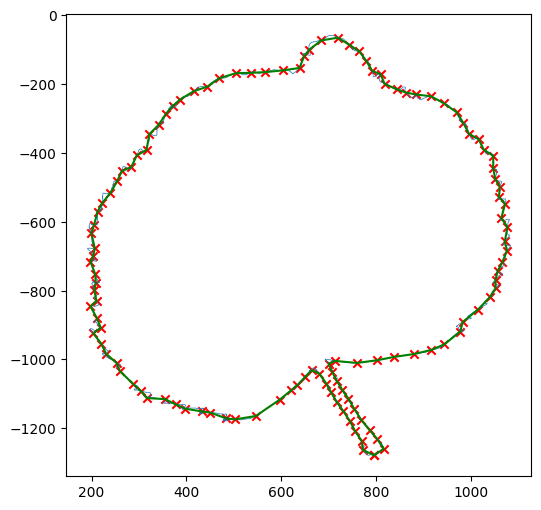

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1573.jpg
Contour shape: (5685, 2)


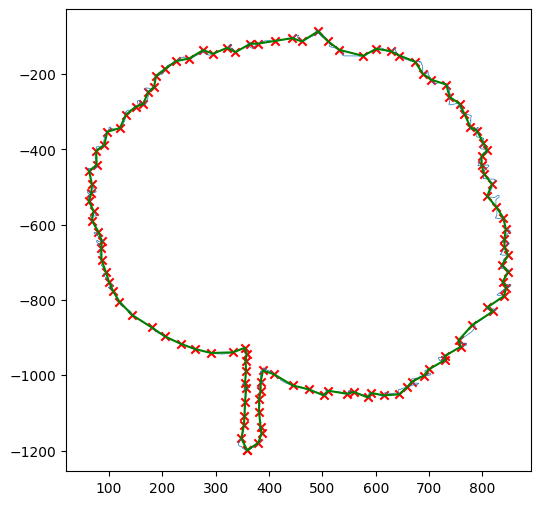

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 5/1563.jpg
Contour shape: (8841, 2)


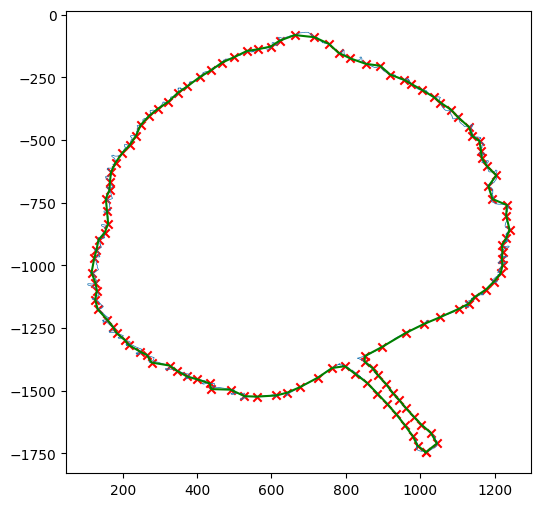

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2461.jpg
Contour shape: (3991, 2)


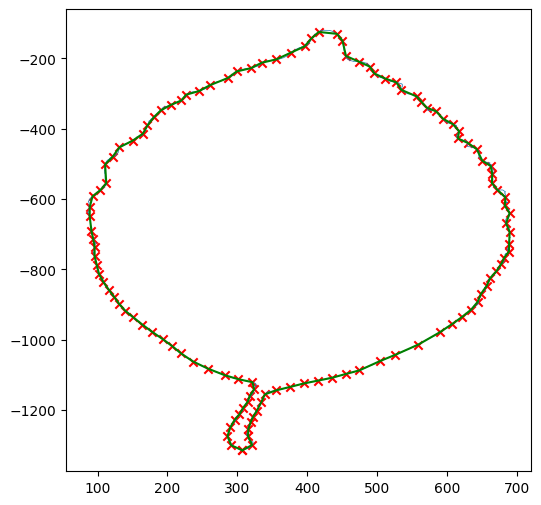

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2474.jpg
Contour shape: (3701, 2)


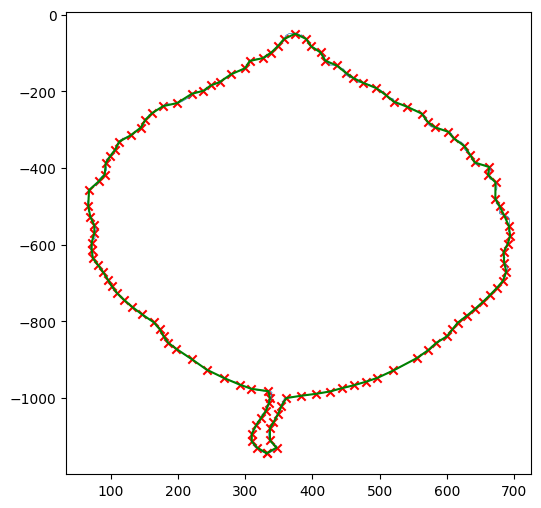

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2470.jpg
Contour shape: (3829, 2)


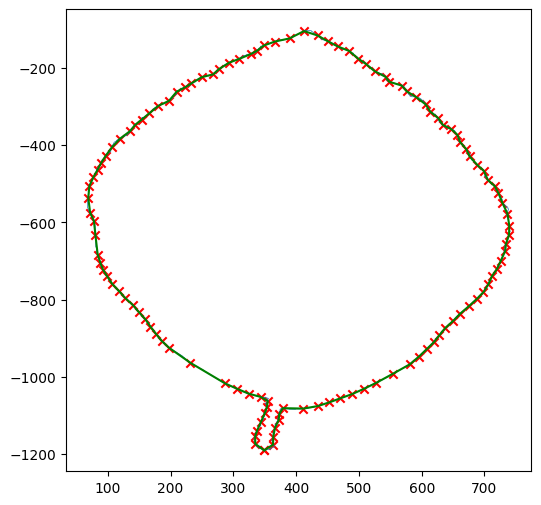

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2456.jpg
Contour shape: (4853, 2)


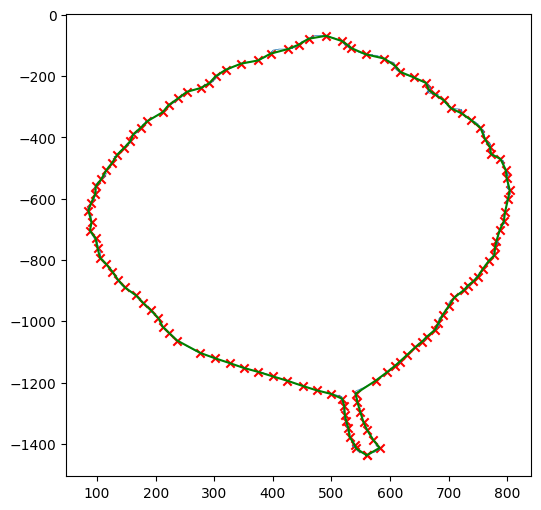

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2466.jpg
Contour shape: (4911, 2)


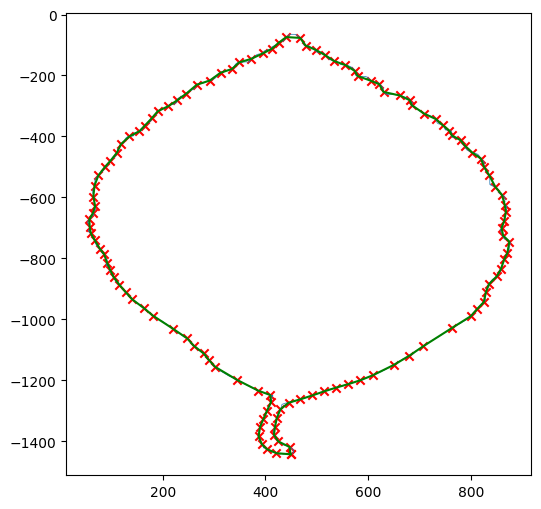

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2471.jpg
Contour shape: (4049, 2)


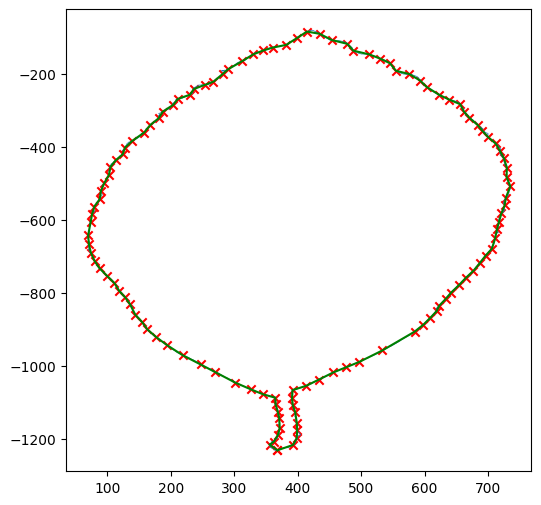

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2459.jpg
Contour shape: (4225, 2)


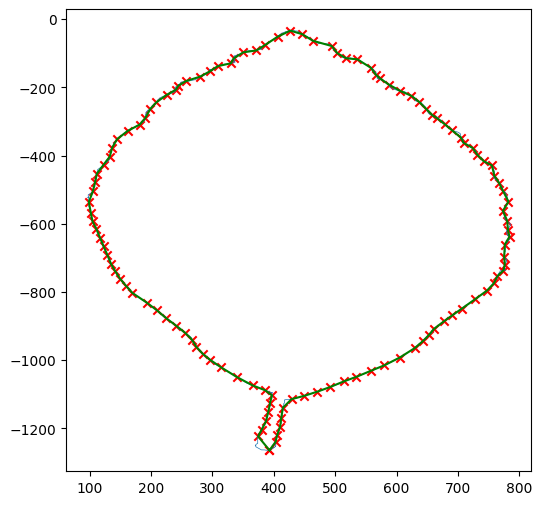

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2464.jpg
Contour shape: (5479, 2)


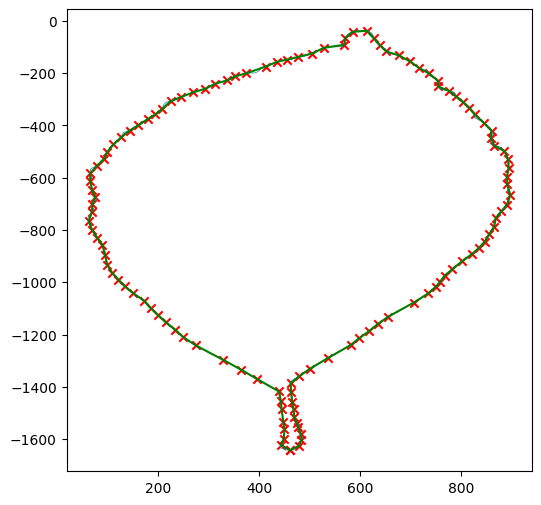

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2463.jpg
Contour shape: (4761, 2)


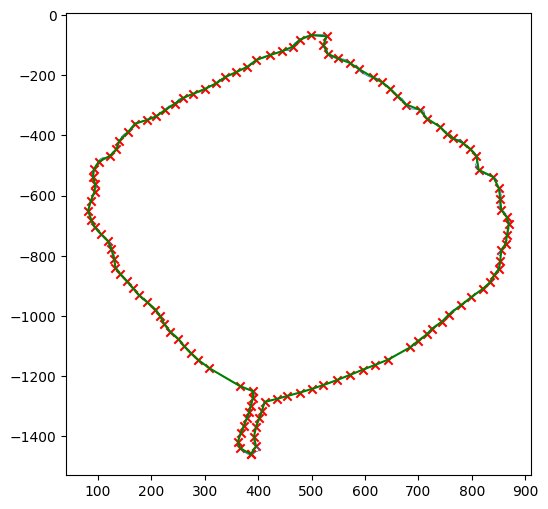

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2467.jpg
Contour shape: (5667, 2)


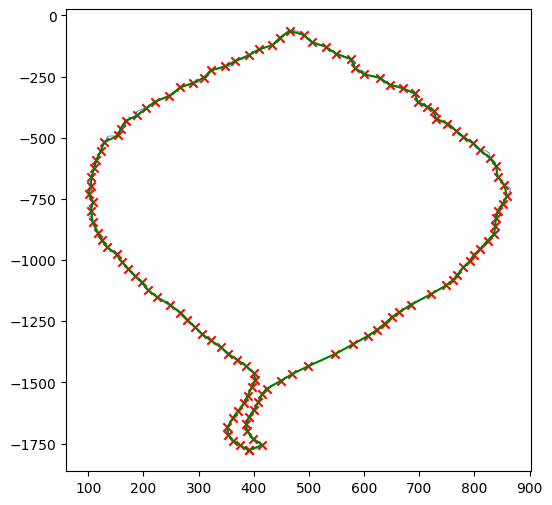

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2457.jpg
Contour shape: (3951, 2)


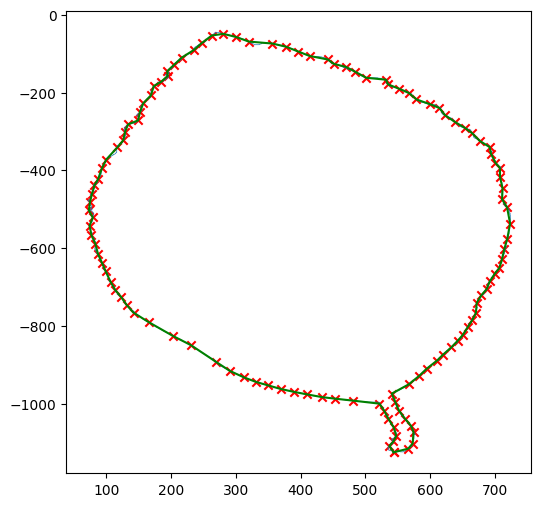

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2462.jpg
Contour shape: (5777, 2)


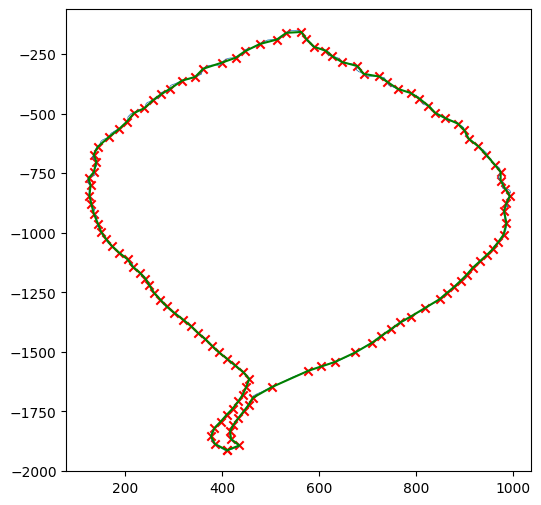

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2469.jpg
Contour shape: (4299, 2)


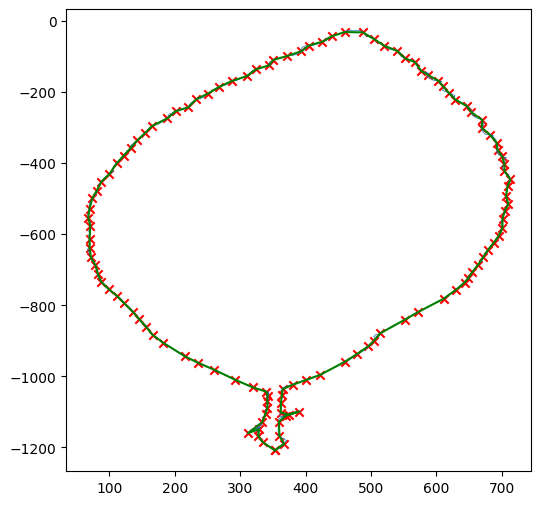

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2458.jpg
Contour shape: (4619, 2)


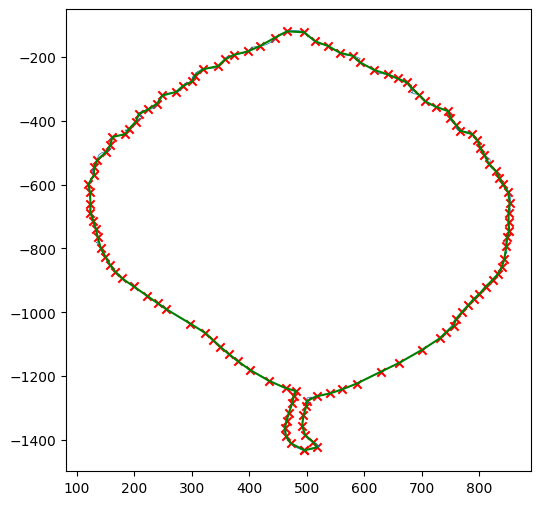

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2460.jpg
Contour shape: (4033, 2)


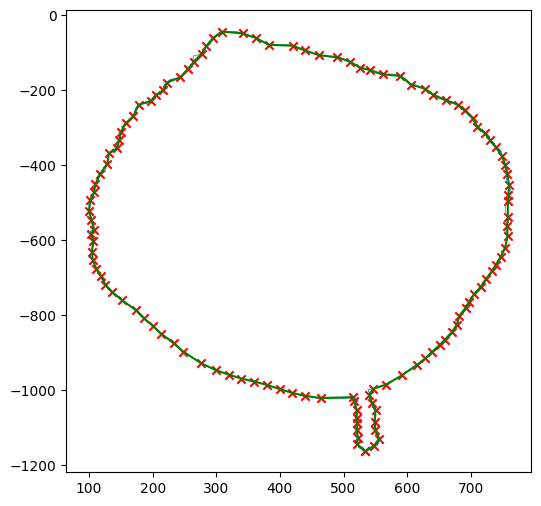

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2468.jpg
Contour shape: (5093, 2)


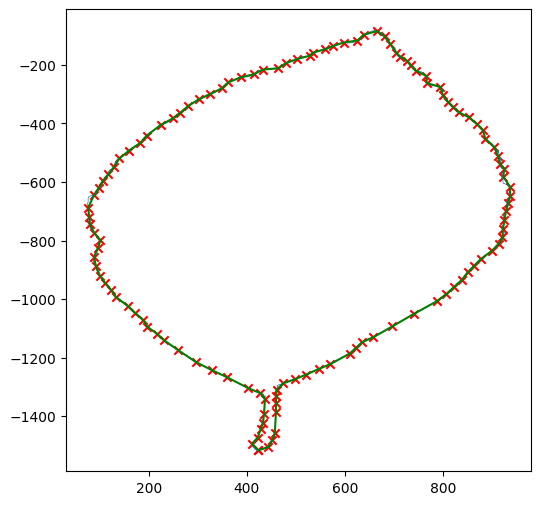

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2473.jpg
Contour shape: (4497, 2)


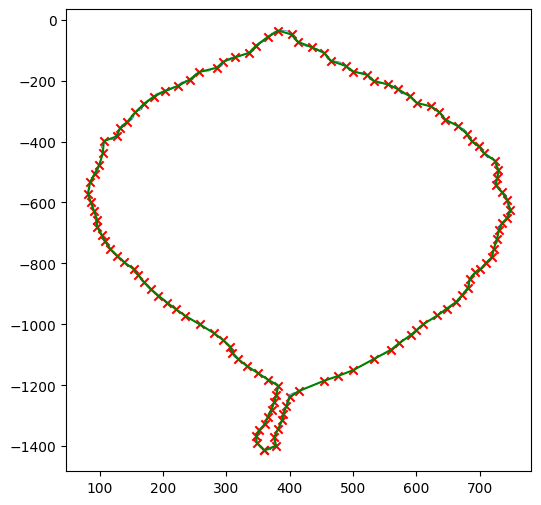

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2465.jpg
Contour shape: (4191, 2)


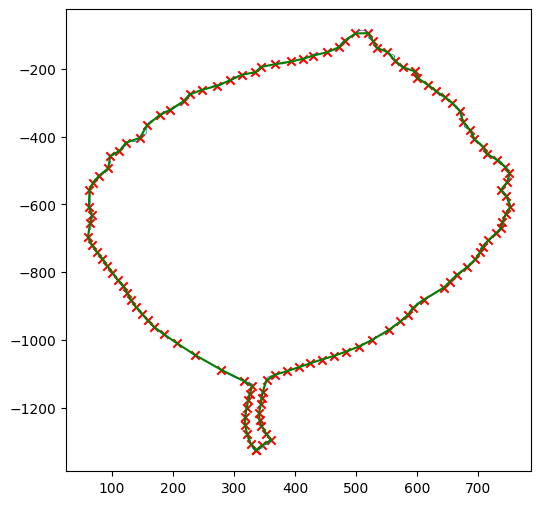

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 14/2472.jpg
Contour shape: (4393, 2)


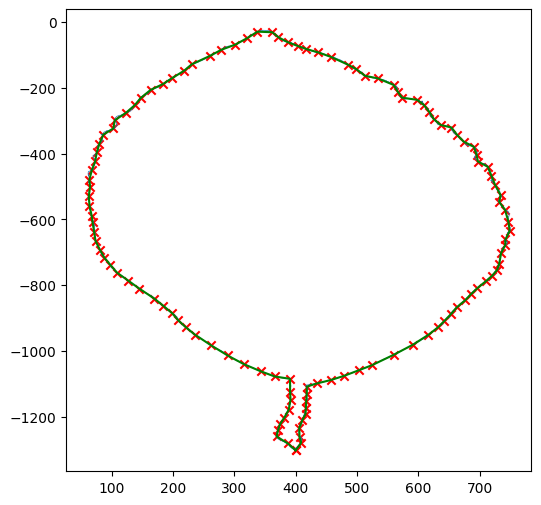

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1856.jpg
Contour shape: (7527, 2)


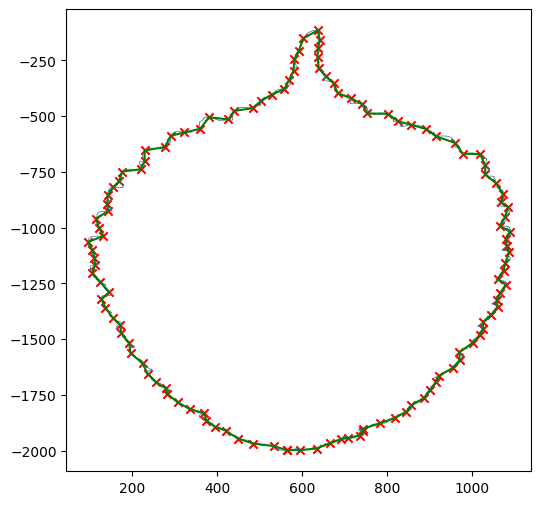

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1867.jpg
Contour shape: (8585, 2)


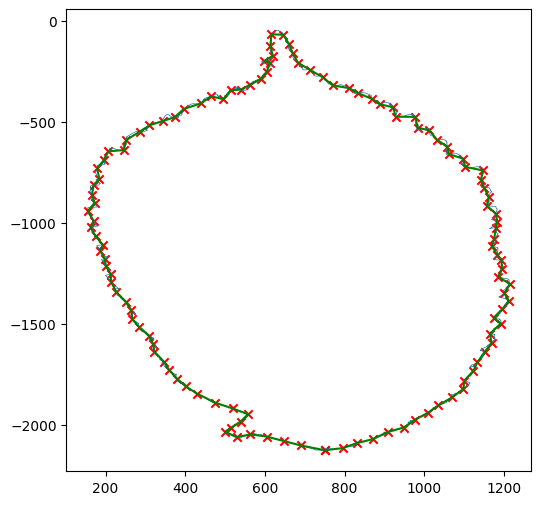

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1862.jpg
Contour shape: (7531, 2)


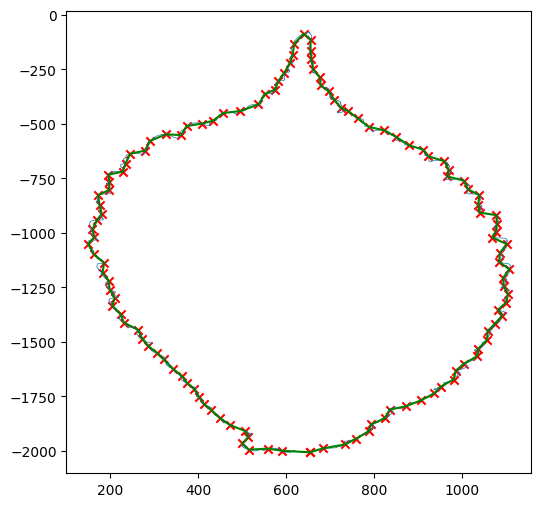

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1865.jpg
Contour shape: (7099, 2)


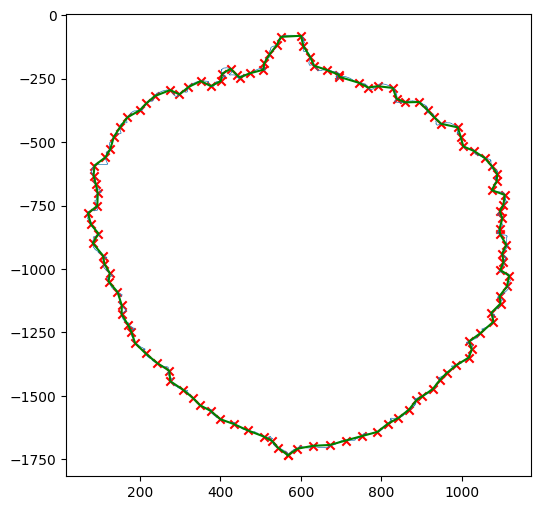

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1868.jpg
Contour shape: (9061, 2)


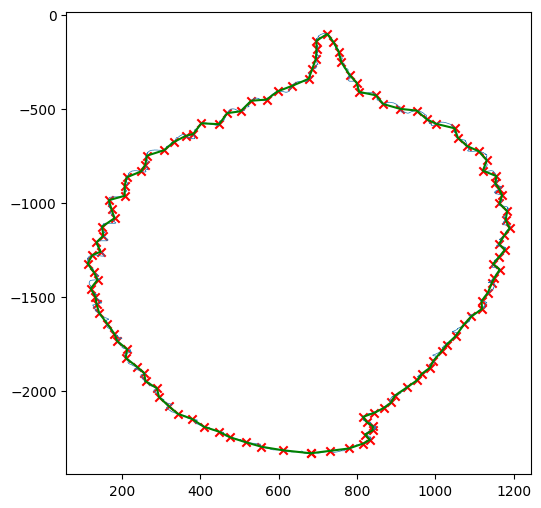

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1872.jpg
Contour shape: (7731, 2)


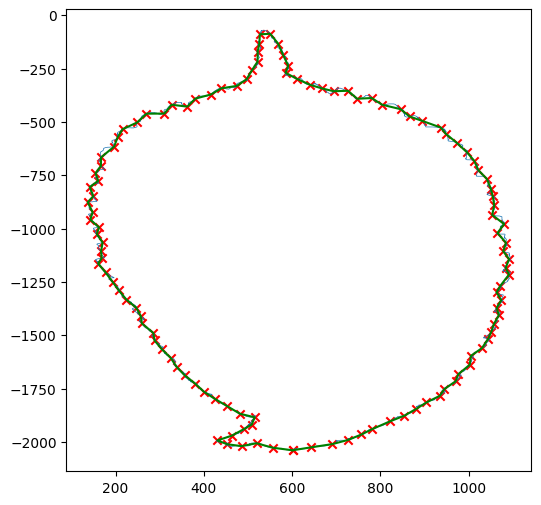

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1866.jpg
Contour shape: (8137, 2)


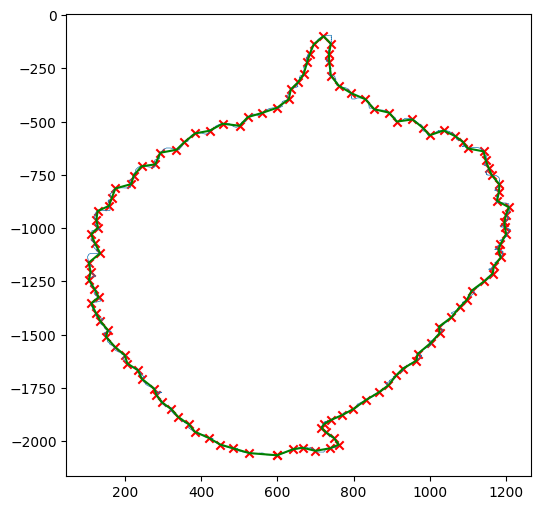

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1870.jpg
Contour shape: (6537, 2)


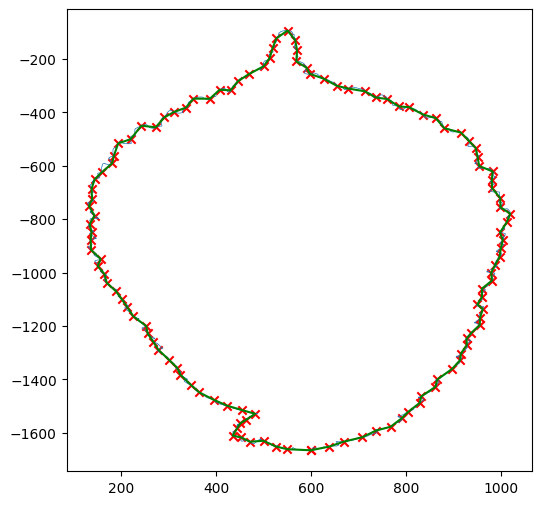

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1869.jpg
Contour shape: (7541, 2)


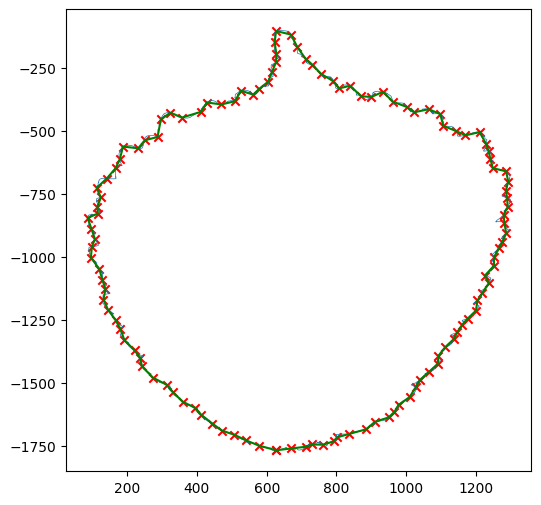

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1873.jpg
Contour shape: (7341, 2)


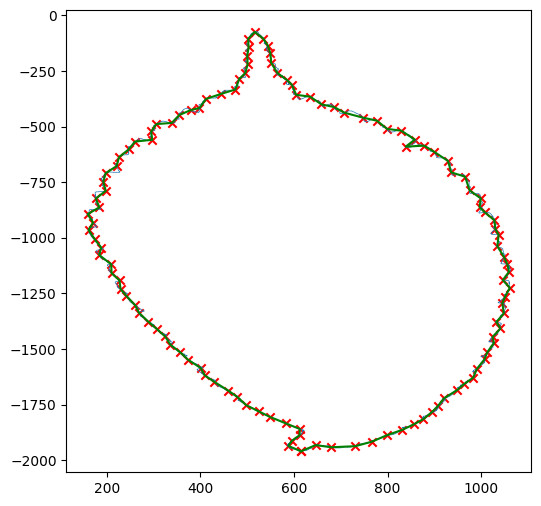

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1864.jpg
Contour shape: (8285, 2)


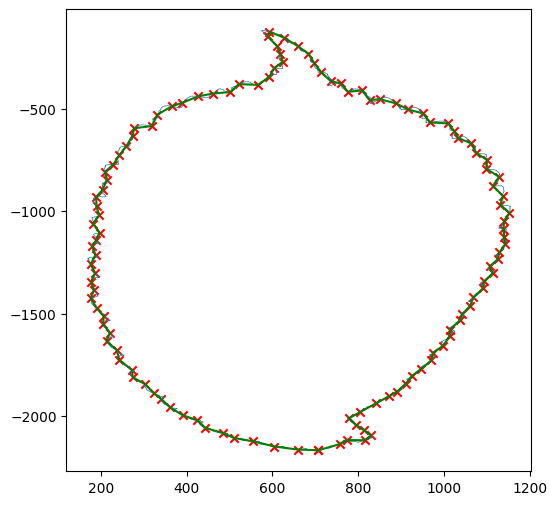

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1863.jpg
Contour shape: (8099, 2)


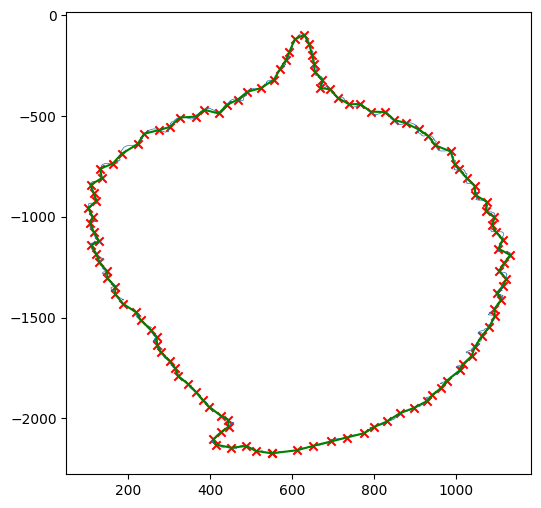

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1874.jpg
Contour shape: (6985, 2)


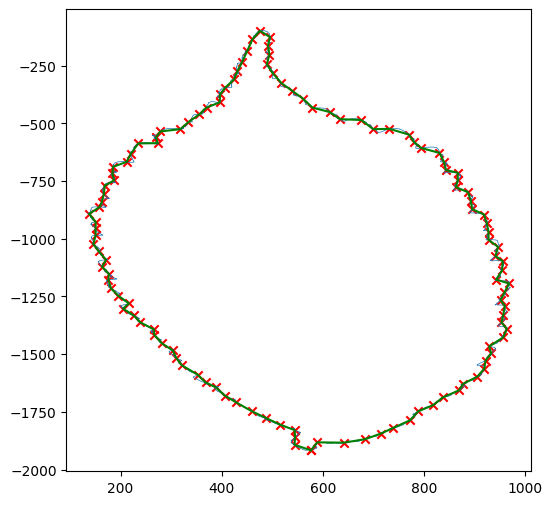

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1857.jpg
Contour shape: (5609, 2)


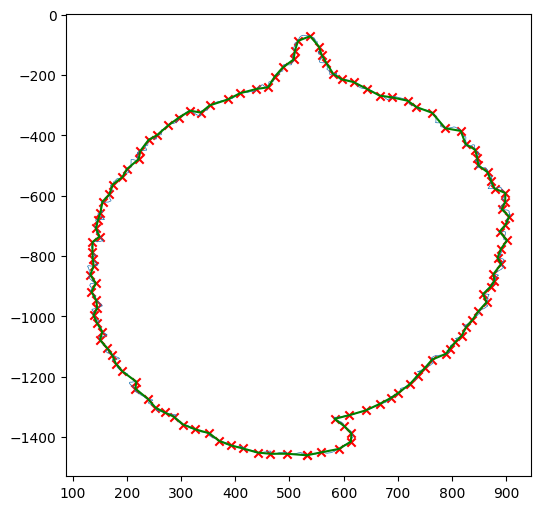

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1861.jpg
Contour shape: (8197, 2)


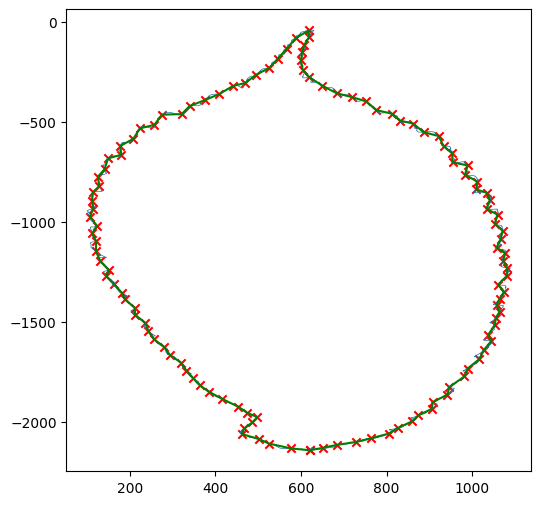

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1860.jpg
Contour shape: (7429, 2)


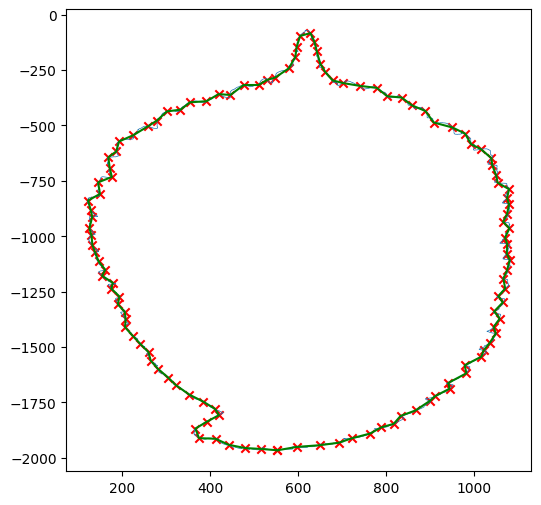

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1859.jpg
Contour shape: (7061, 2)


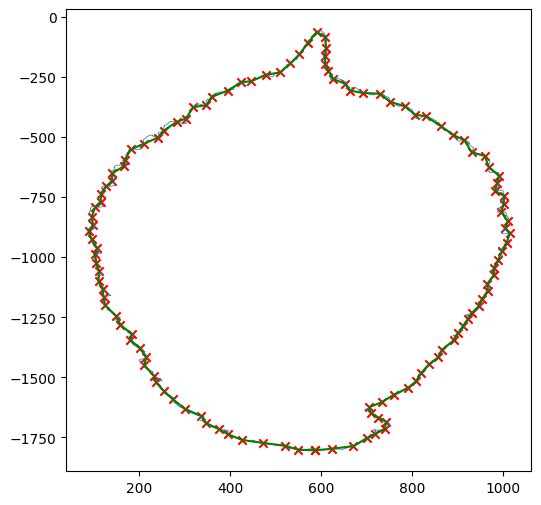

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1871.jpg
Contour shape: (8117, 2)


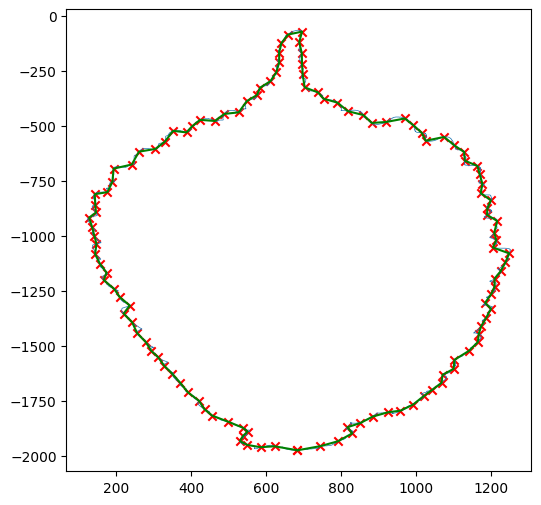

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 8/1858.jpg
Contour shape: (7351, 2)


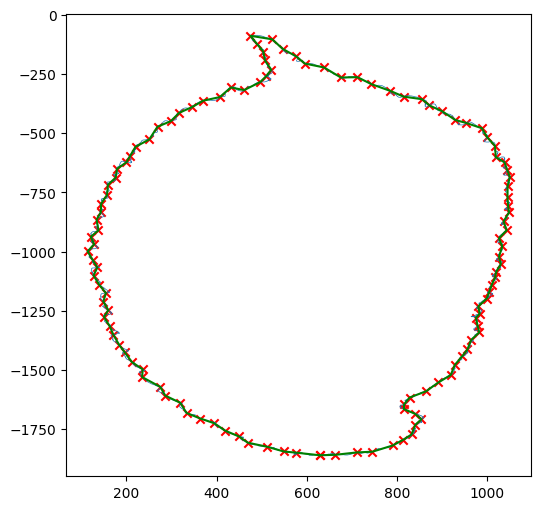

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1368.jpg
Contour shape: (4431, 2)


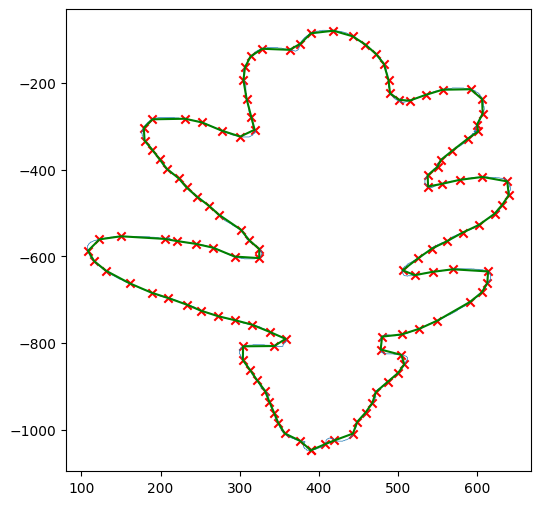

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1360.jpg
Contour shape: (5257, 2)


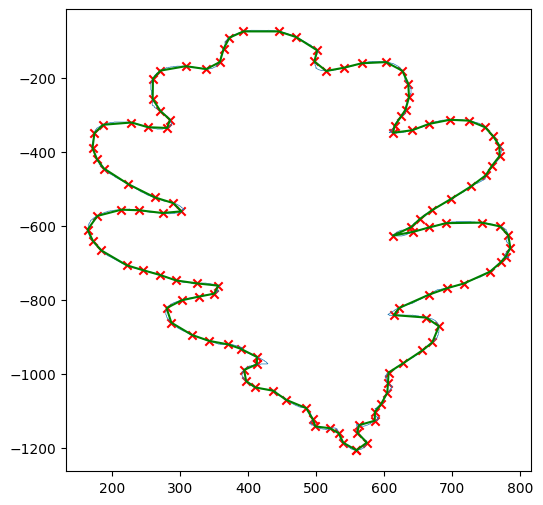

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1365.jpg
Contour shape: (5015, 2)


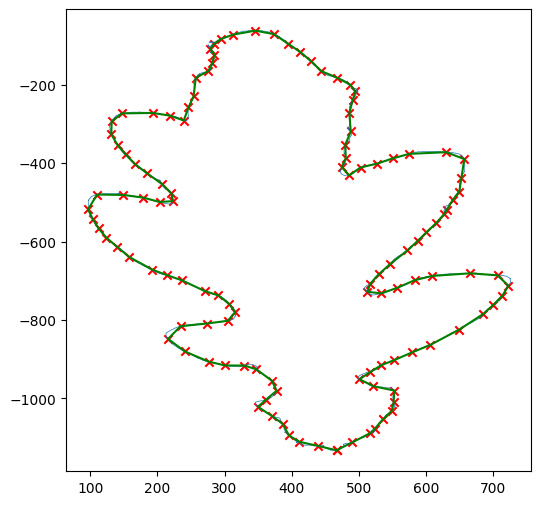

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1356.jpg
Contour shape: (4167, 2)


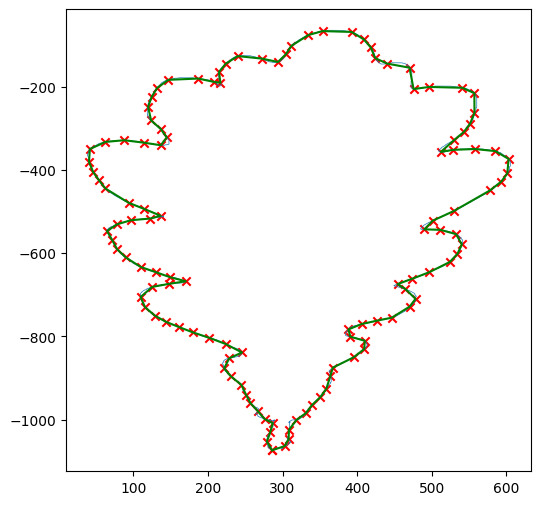

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1373.jpg
Contour shape: (4941, 2)


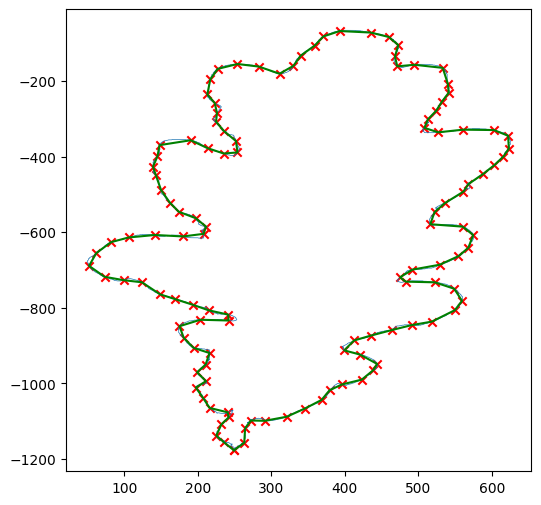

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1358.jpg
Contour shape: (5807, 2)


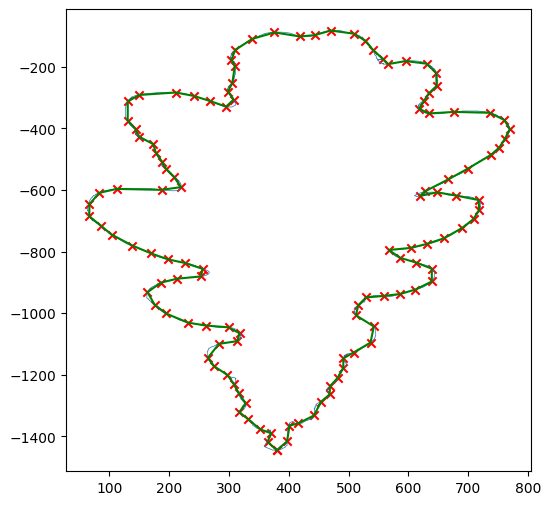

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1372.jpg
Contour shape: (5265, 2)


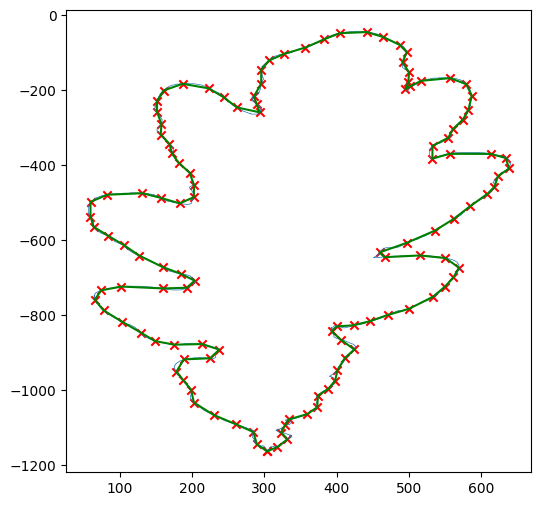

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1367.jpg
Contour shape: (4681, 2)


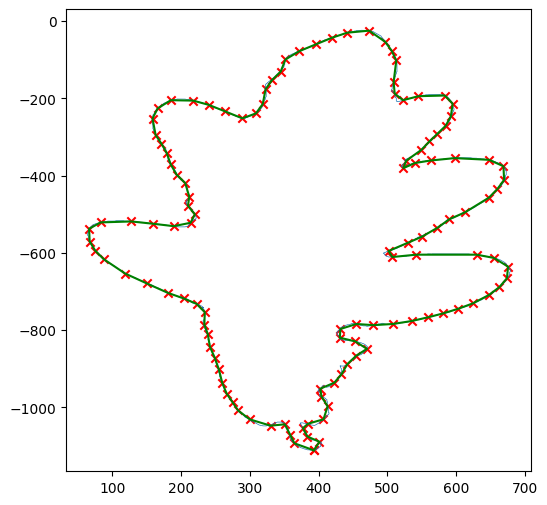

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1357.jpg
Contour shape: (5191, 2)


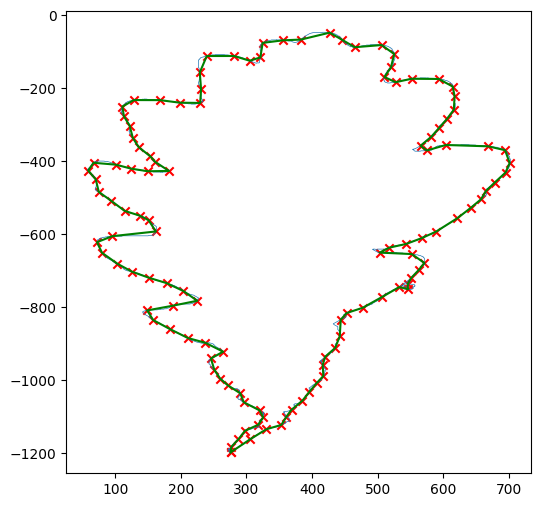

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1361.jpg
Contour shape: (5371, 2)


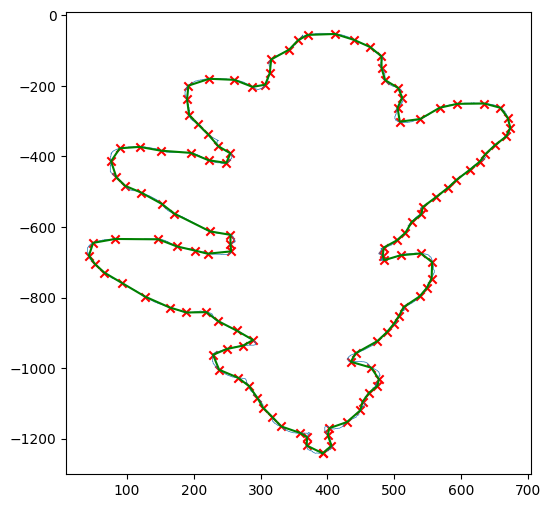

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1362.jpg
Contour shape: (7409, 2)


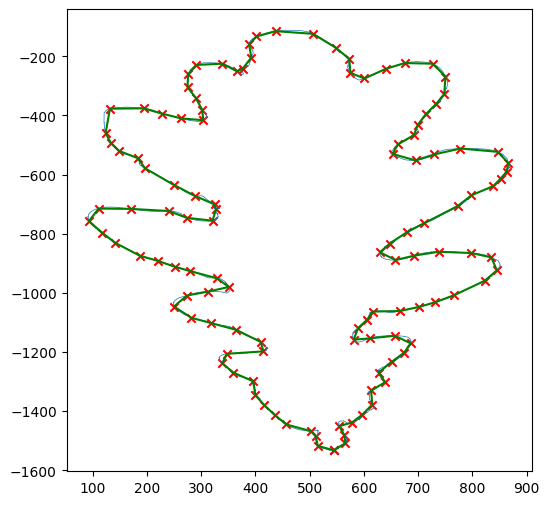

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1374.jpg
Contour shape: (6093, 2)


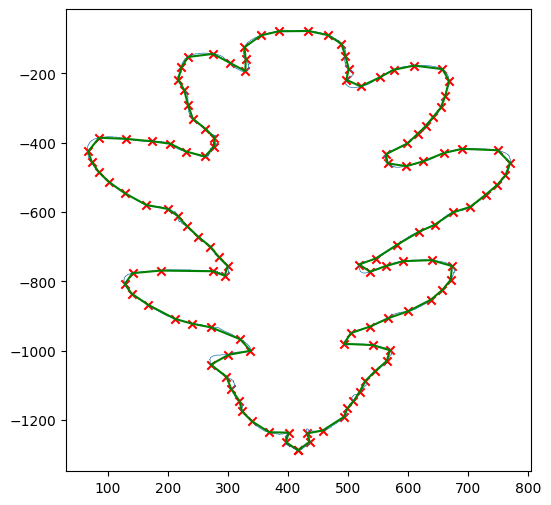

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1371.jpg
Contour shape: (6297, 2)


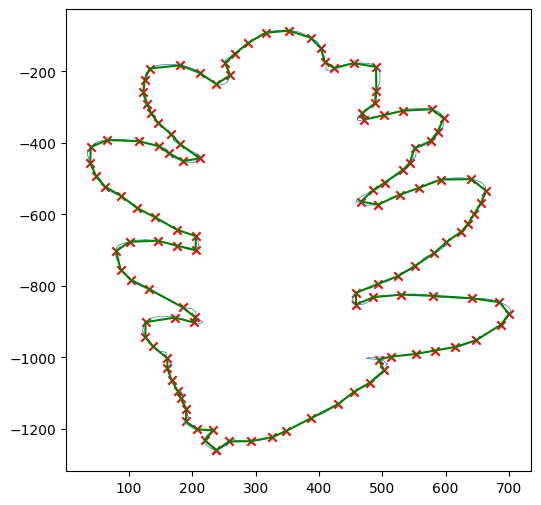

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1359.jpg
Contour shape: (6163, 2)


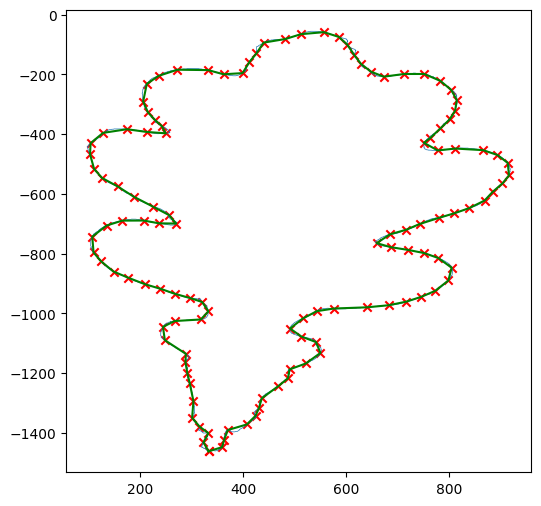

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1366.jpg
Contour shape: (5383, 2)


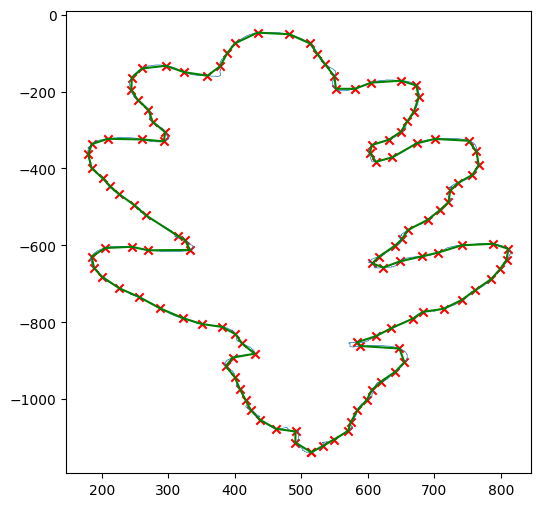

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1369.jpg
Contour shape: (4855, 2)


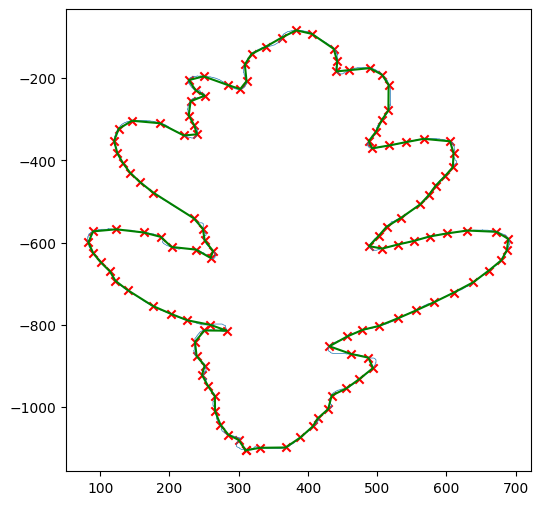

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1364.jpg
Contour shape: (4707, 2)


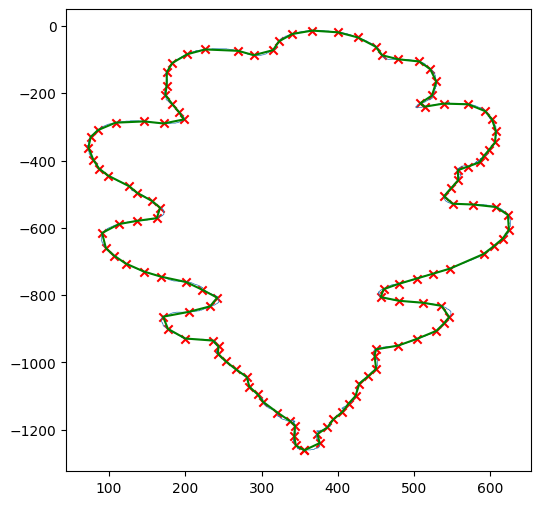

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1370.jpg
Contour shape: (6797, 2)


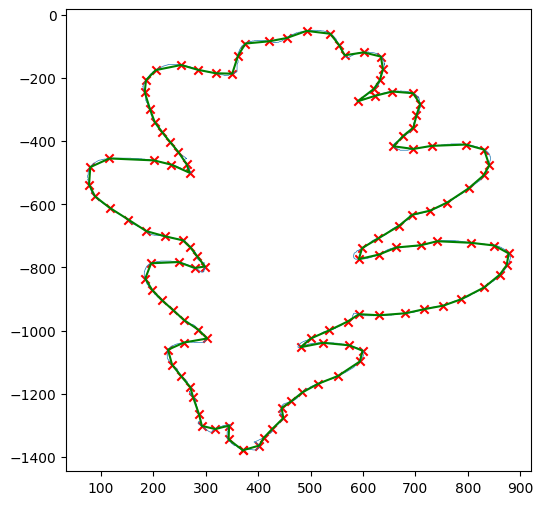

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 3/1363.jpg
Contour shape: (4333, 2)


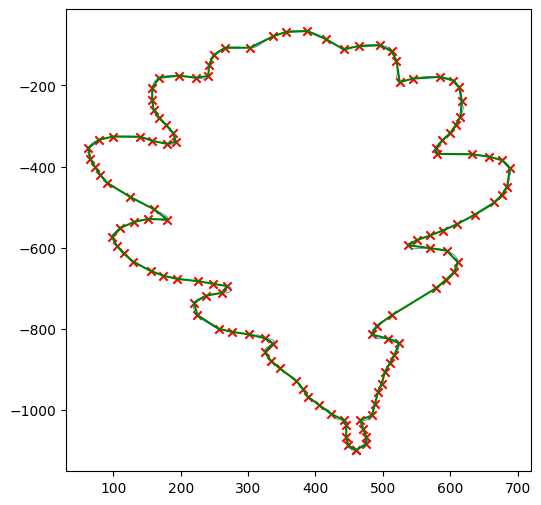

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1065.jpg
Contour shape: (5145, 2)


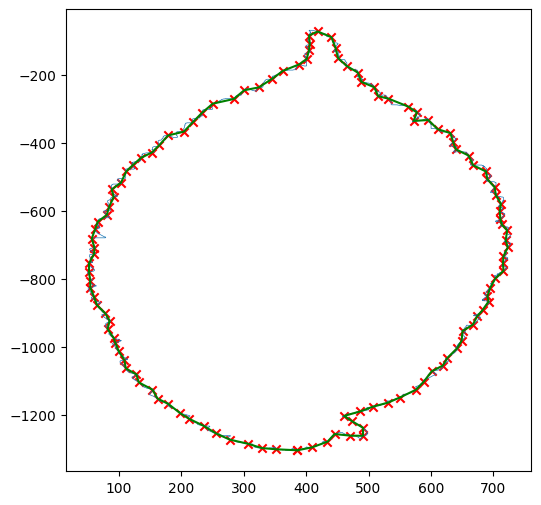

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1072.jpg
Contour shape: (6009, 2)


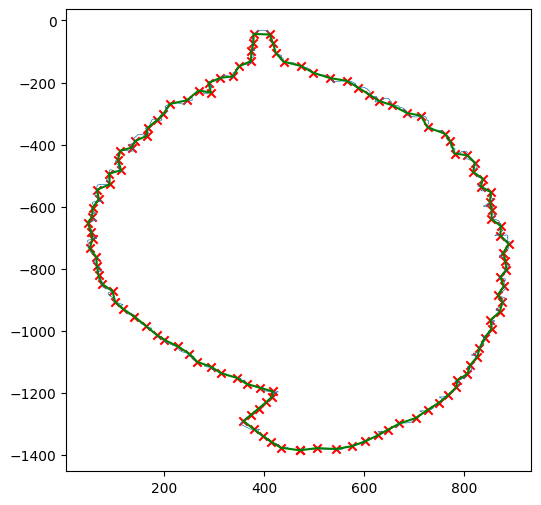

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1066.jpg
Contour shape: (4509, 2)


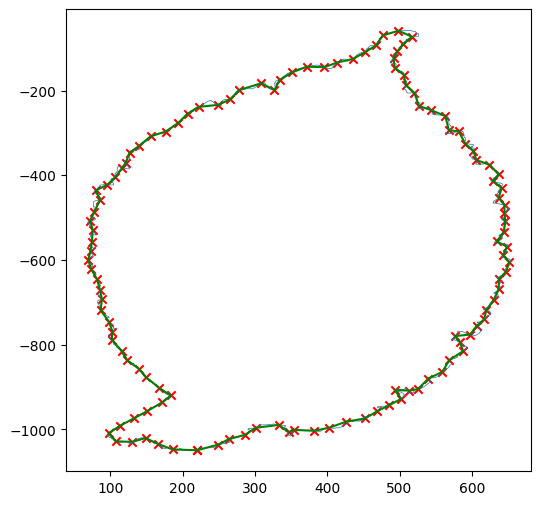

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1070.jpg
Contour shape: (5585, 2)


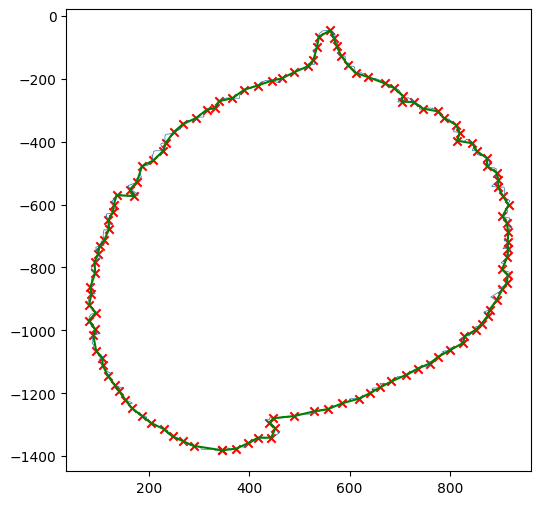

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1073.jpg
Contour shape: (6497, 2)


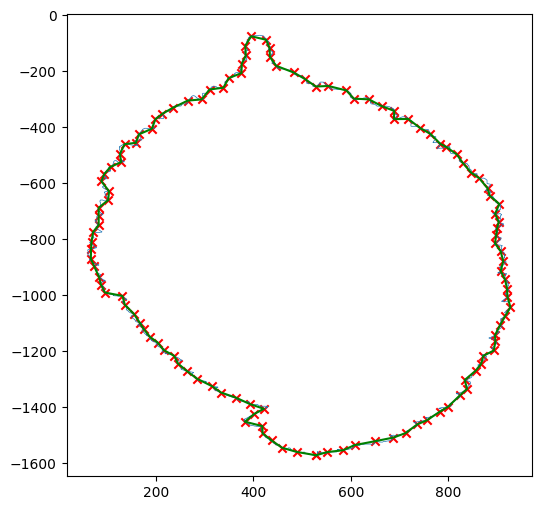

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1068.jpg
Contour shape: (6939, 2)


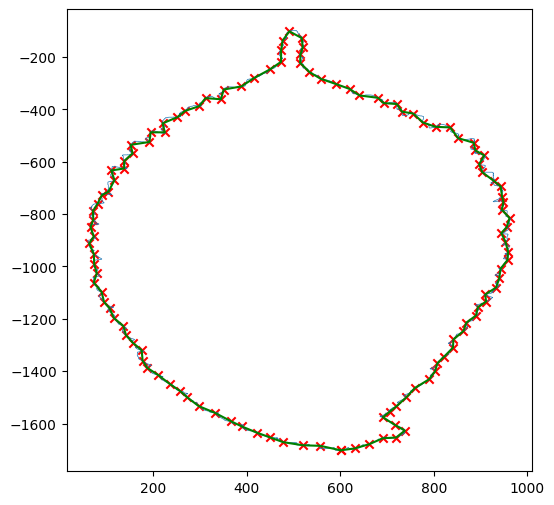

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1057.jpg
Contour shape: (3561, 2)


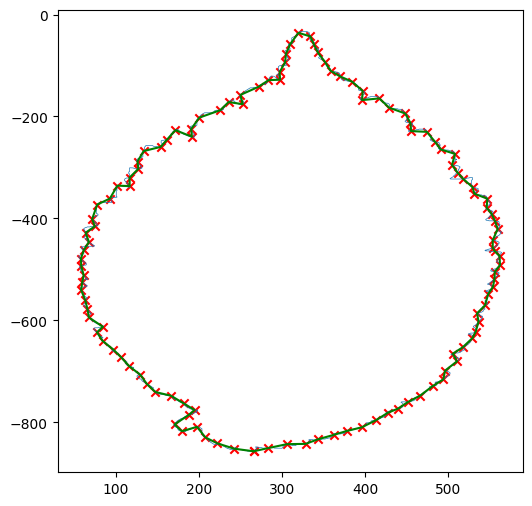

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1058.jpg
Contour shape: (5985, 2)


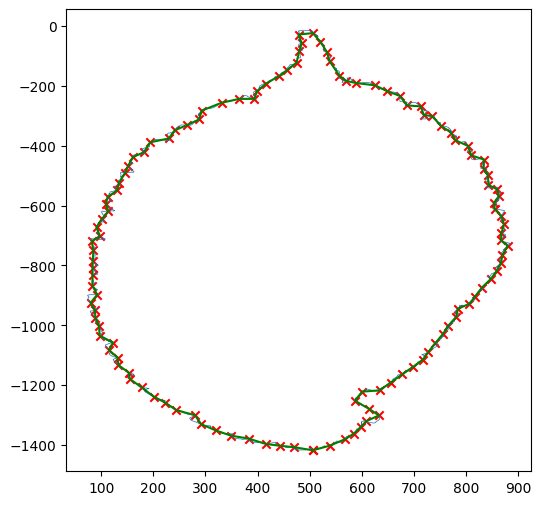

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1060.jpg
Contour shape: (5909, 2)


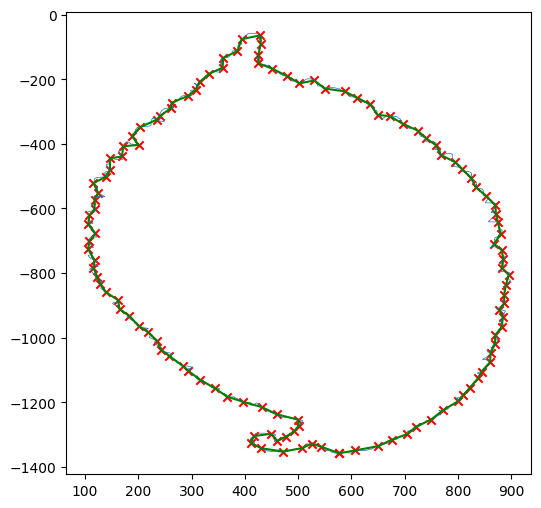

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1061.jpg
Contour shape: (6235, 2)


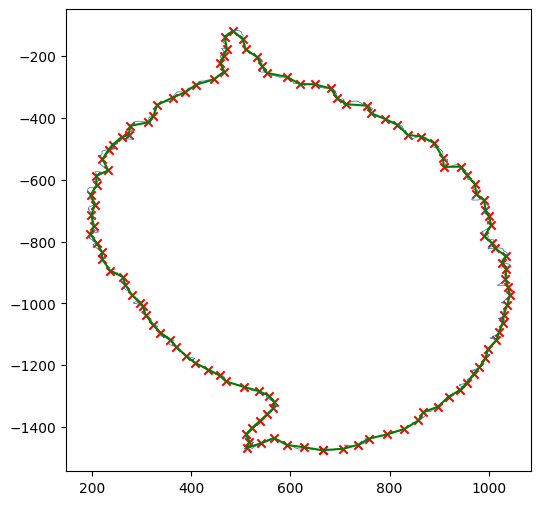

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1062.jpg
Contour shape: (8573, 2)


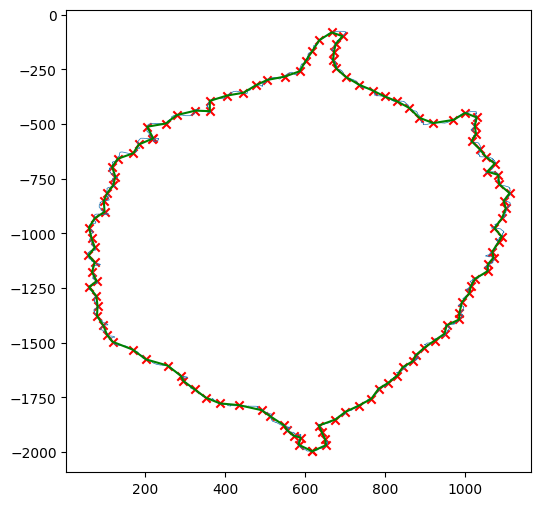

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1071.jpg
Contour shape: (4175, 2)


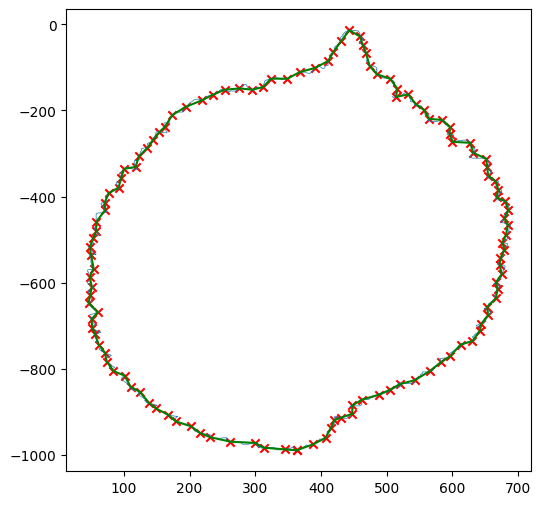

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1069.jpg
Contour shape: (6345, 2)


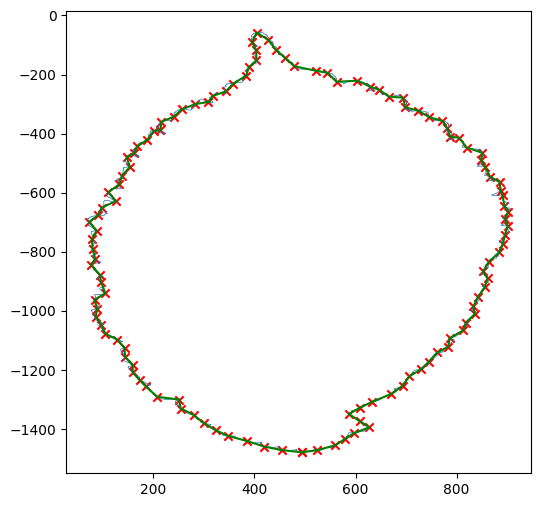

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1056.jpg
Contour shape: (9175, 2)


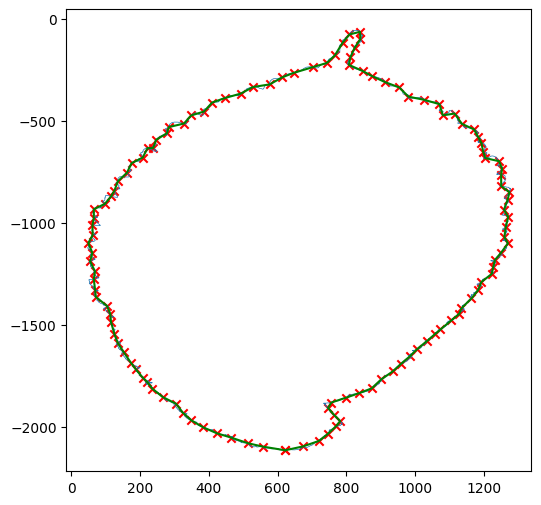

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1059.jpg
Contour shape: (6947, 2)


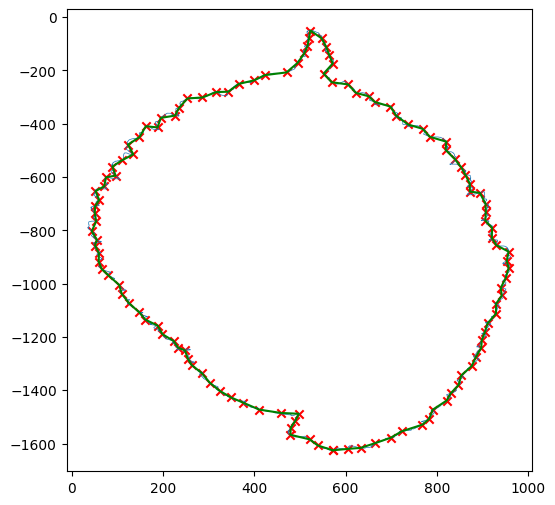

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1074.jpg
Contour shape: (4833, 2)


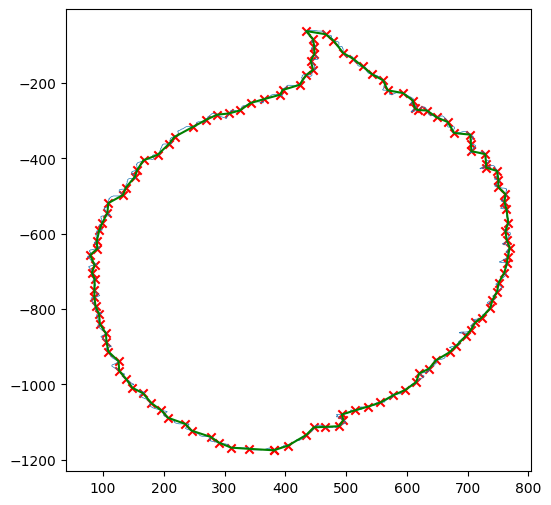

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1064.jpg
Contour shape: (6455, 2)


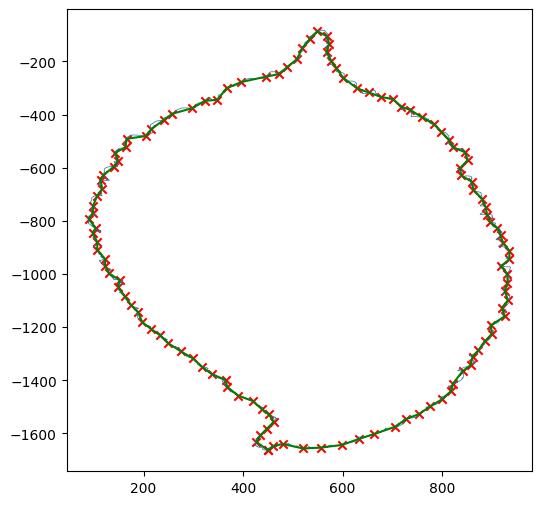

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1067.jpg
Contour shape: (5163, 2)


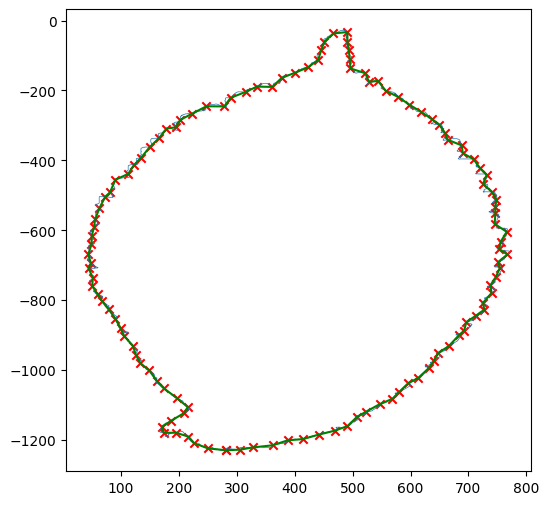

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 0/1063.jpg
Contour shape: (6897, 2)


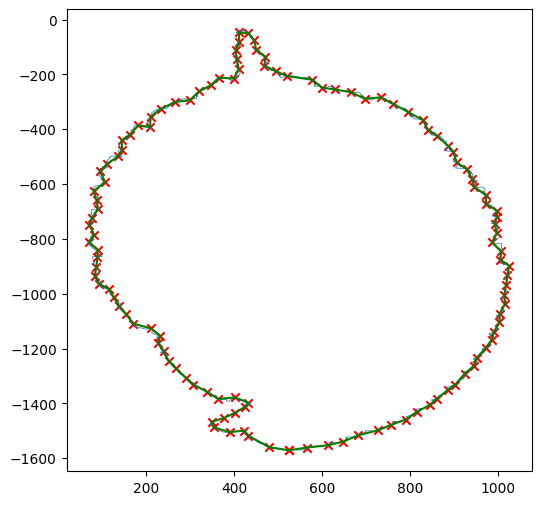

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1173.jpg
Contour shape: (21689, 2)


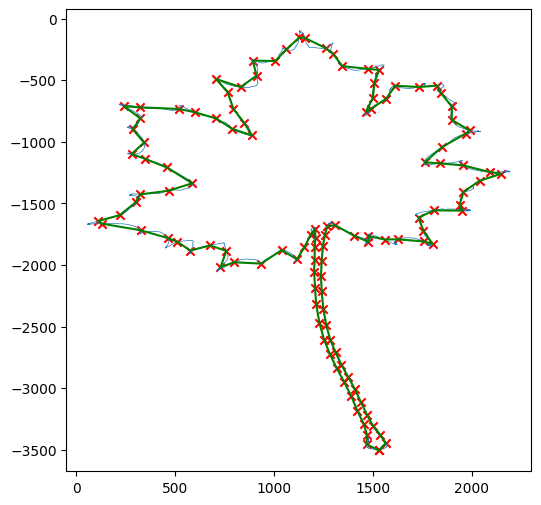

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1159.jpg
Contour shape: (19915, 2)


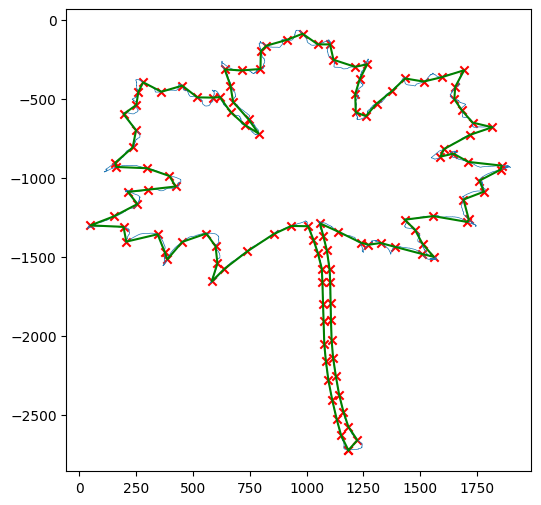

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1170.jpg
Contour shape: (17397, 2)


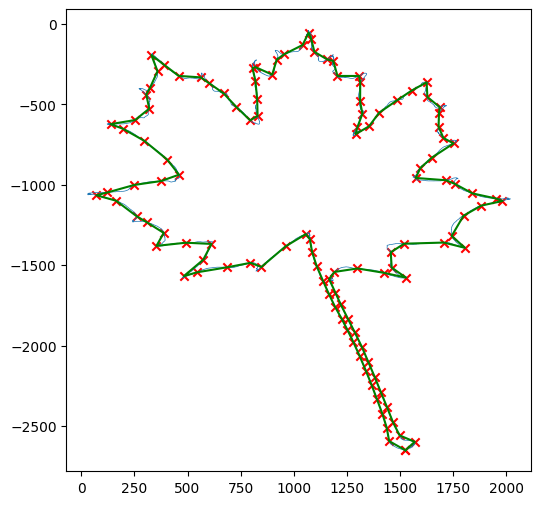

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1164.jpg
Contour shape: (13209, 2)


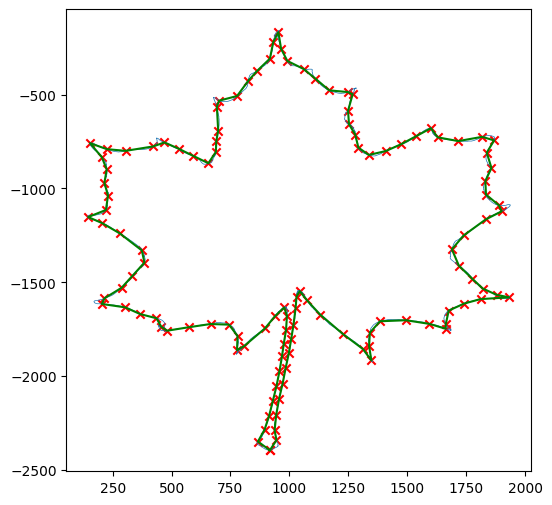

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1160.jpg
Contour shape: (10491, 2)


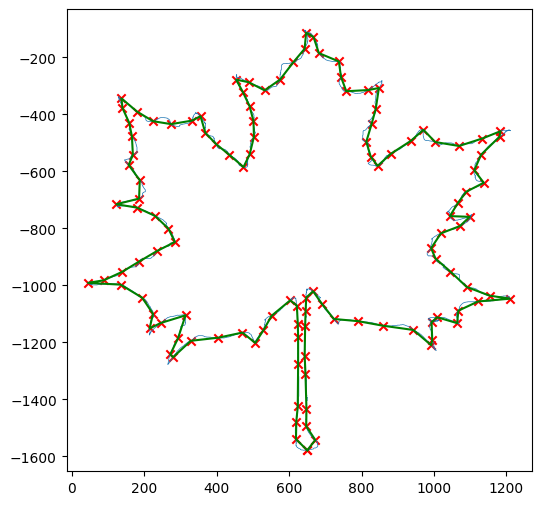

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1166.jpg
Contour shape: (10147, 2)


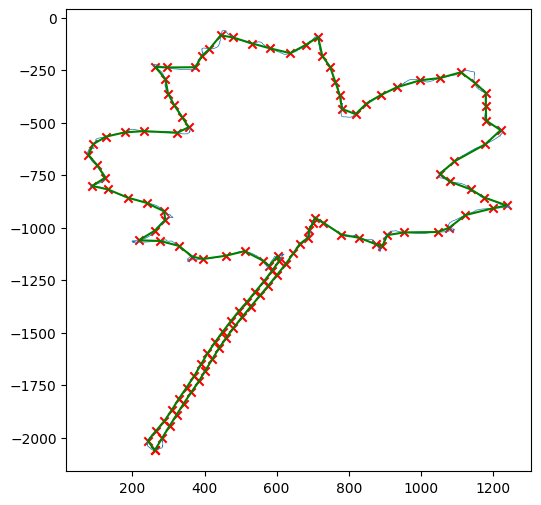

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1172.jpg
Contour shape: (14787, 2)


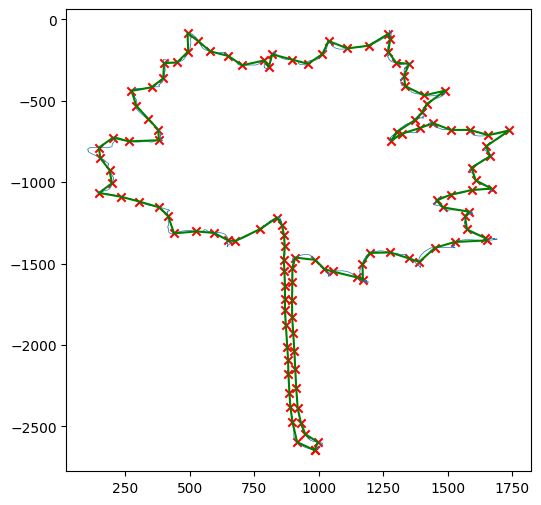

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1168.jpg
Contour shape: (15035, 2)


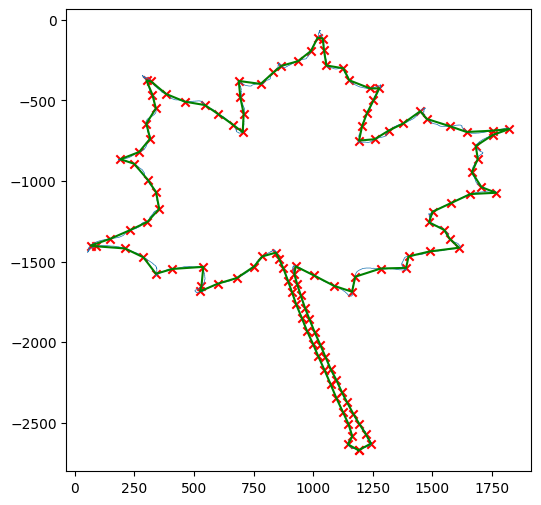

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1169.jpg
Contour shape: (22237, 2)


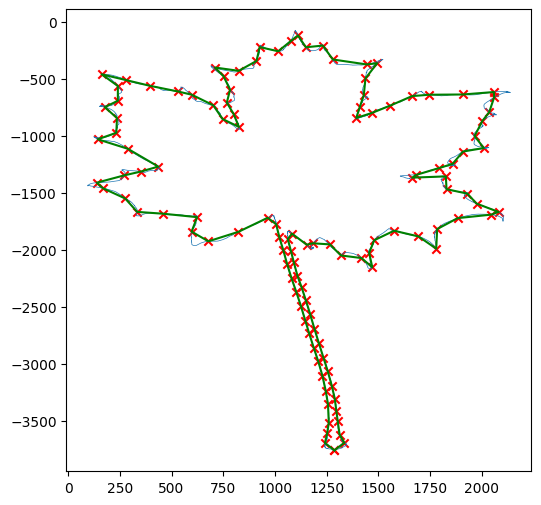

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1158.jpg
Contour shape: (15959, 2)


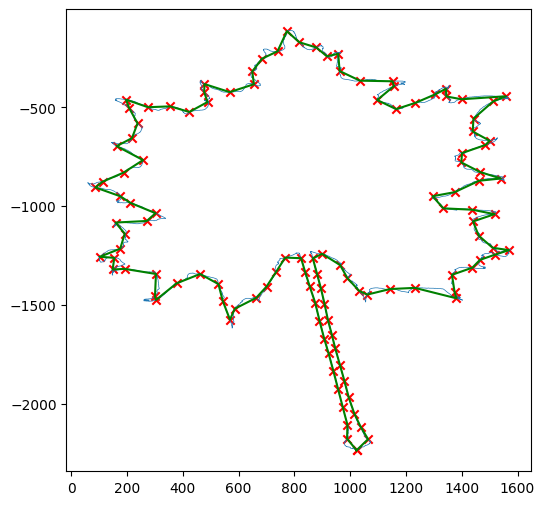

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1163.jpg
Contour shape: (17551, 2)


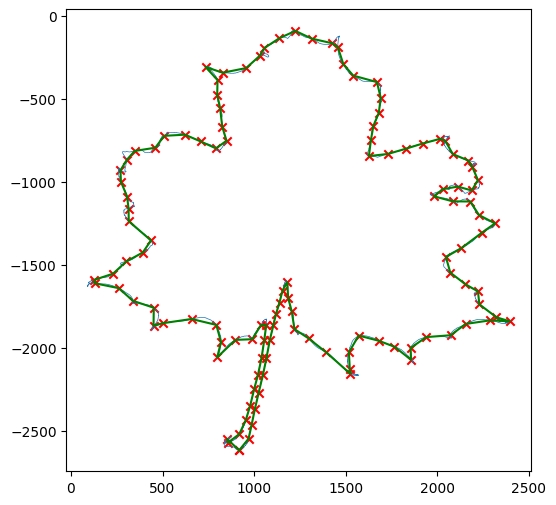

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1162.jpg
Contour shape: (14405, 2)


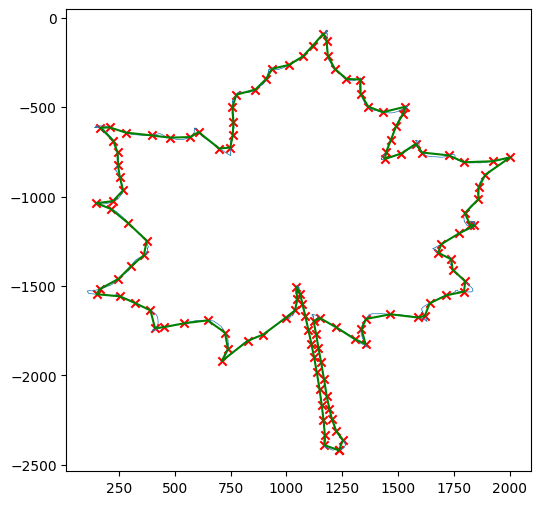

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1165.jpg
Contour shape: (15159, 2)


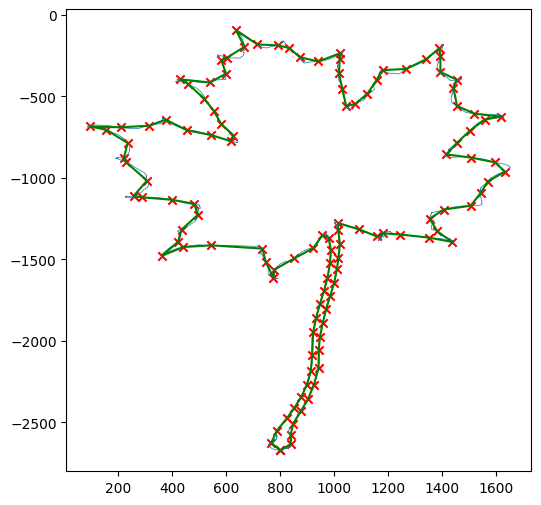

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1174.jpg
Contour shape: (14607, 2)


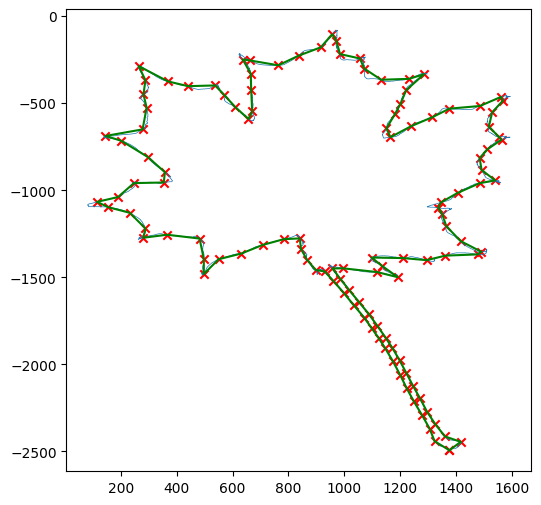

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1171.jpg
Contour shape: (13177, 2)


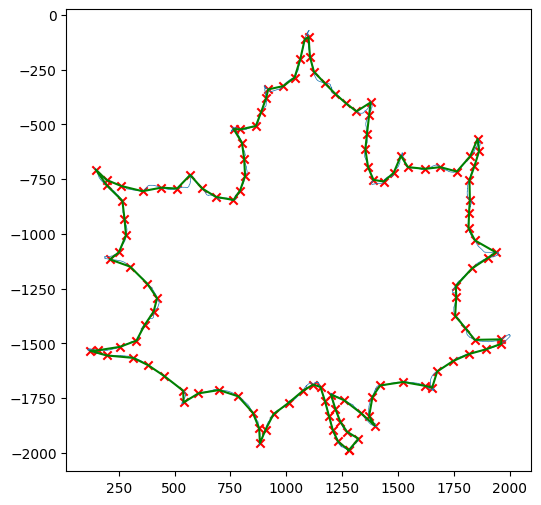

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1161.jpg
Contour shape: (14657, 2)


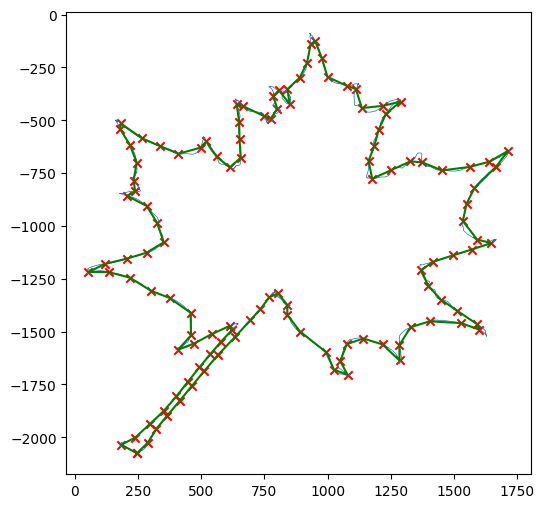

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1167.jpg
Contour shape: (14280, 2)


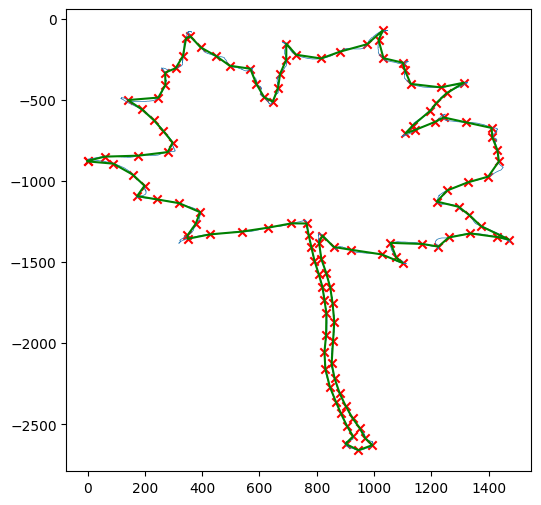

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1157.jpg
Contour shape: (23227, 2)


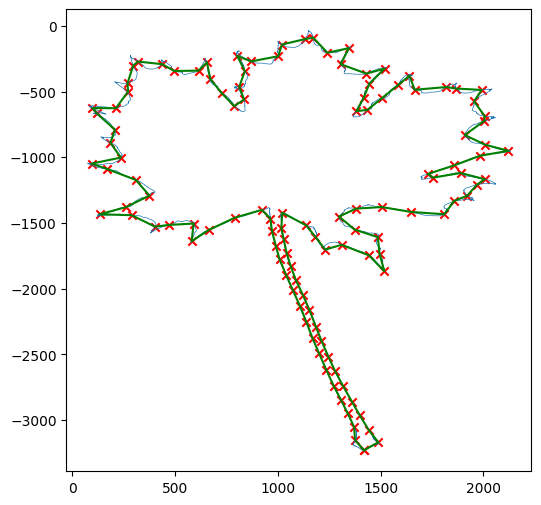

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 1/1156.jpg
Contour shape: (15351, 2)


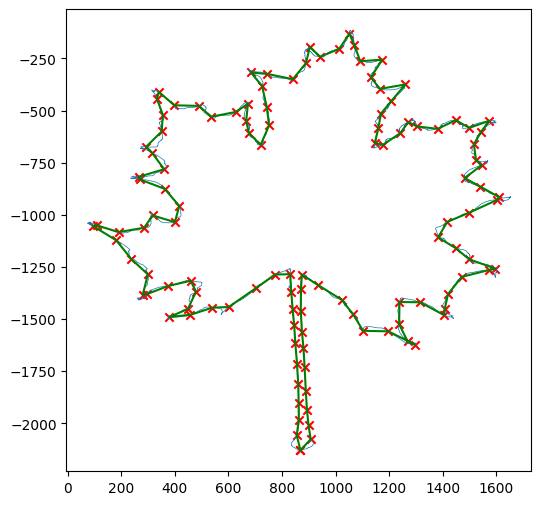

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1659.jpg
Contour shape: (4599, 2)


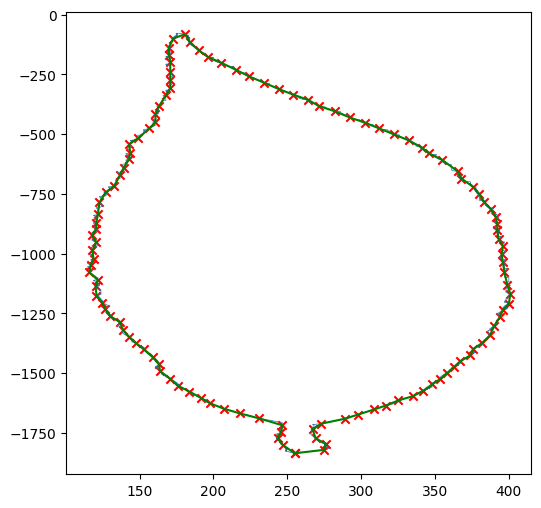

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1669.jpg
Contour shape: (3883, 2)


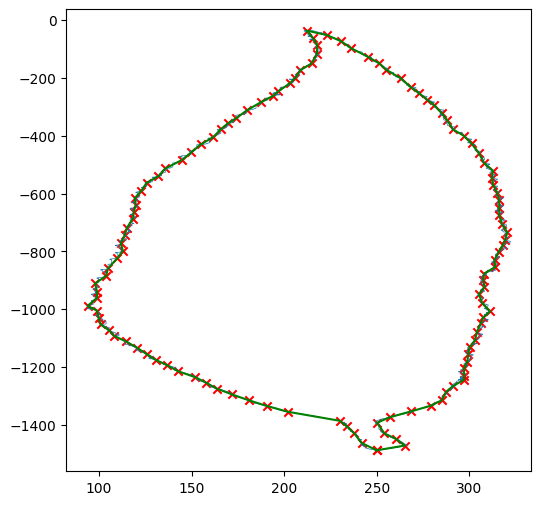

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1657.jpg
Contour shape: (3595, 2)


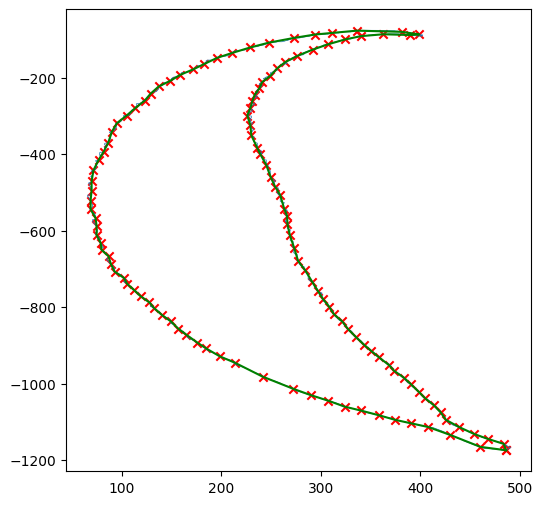

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1671.jpg
Contour shape: (3773, 2)


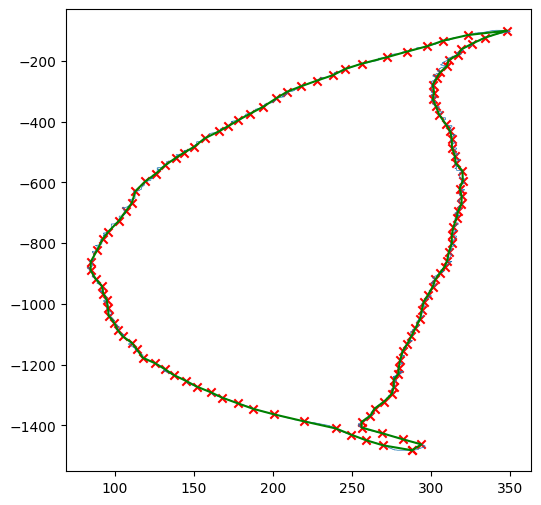

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1674.jpg
Contour shape: (3741, 2)


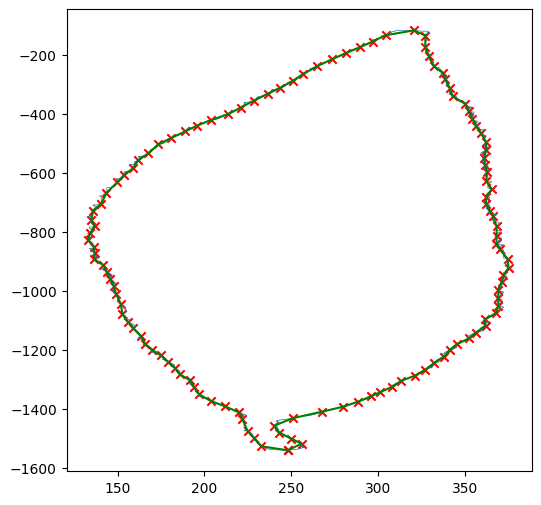

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1664.jpg
Contour shape: (3705, 2)


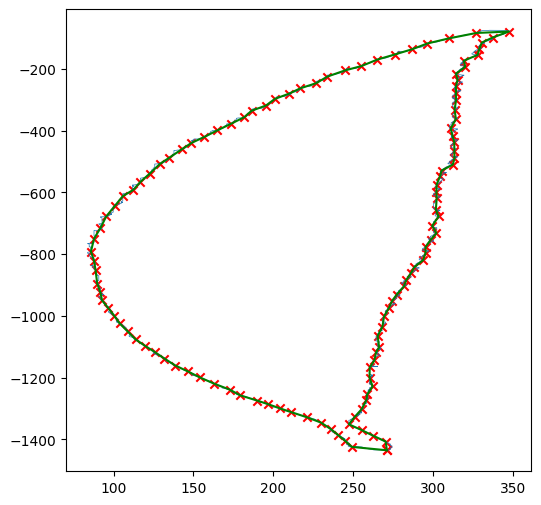

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1658.jpg
Contour shape: (4539, 2)


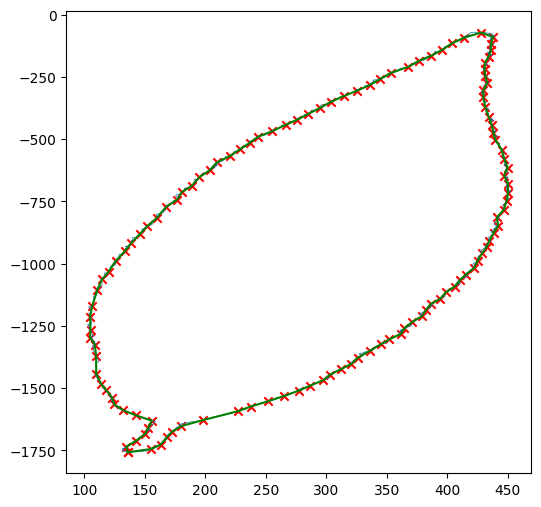

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1661.jpg
Contour shape: (3243, 2)


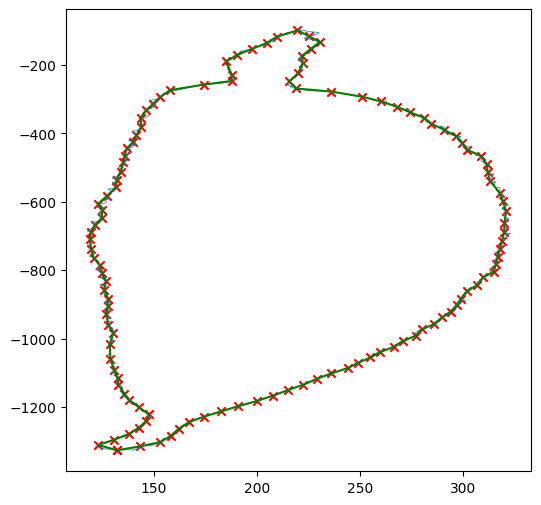

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1660.jpg
Contour shape: (3035, 2)


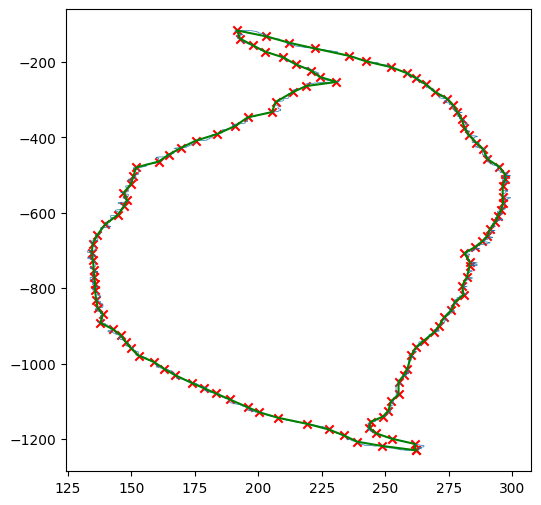

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1670.jpg
Contour shape: (3959, 2)


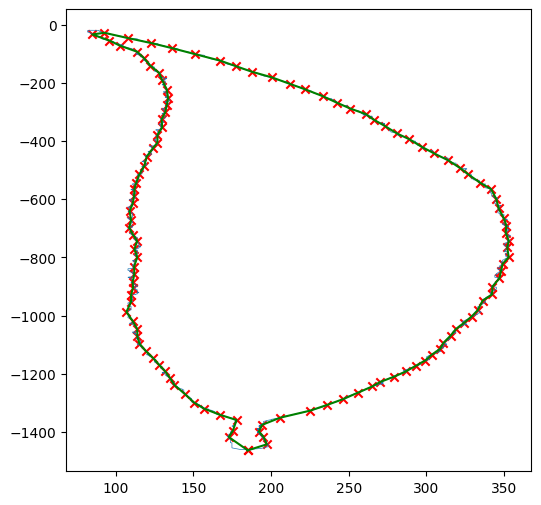

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1656.jpg
Contour shape: (3777, 2)


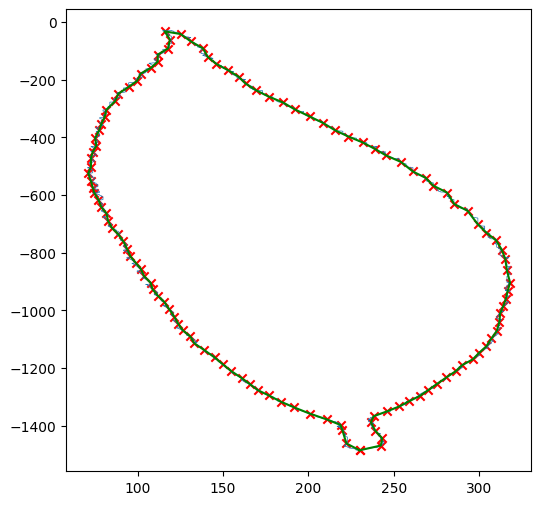

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1666.jpg
Contour shape: (4421, 2)


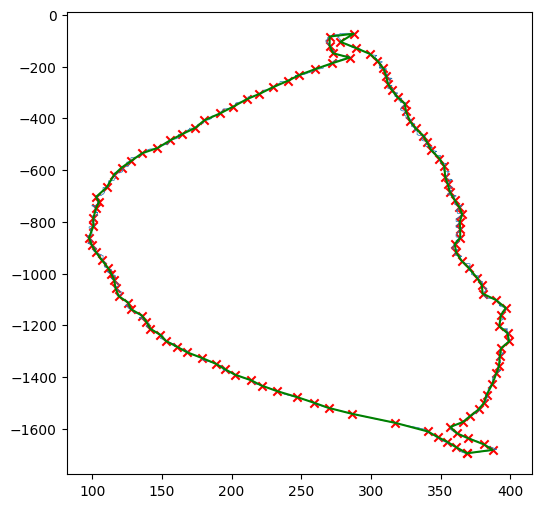

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1665.jpg
Contour shape: (4153, 2)


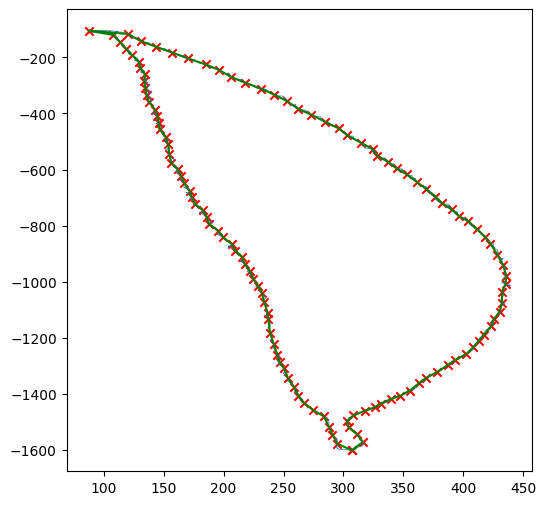

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1663.jpg
Contour shape: (4755, 2)


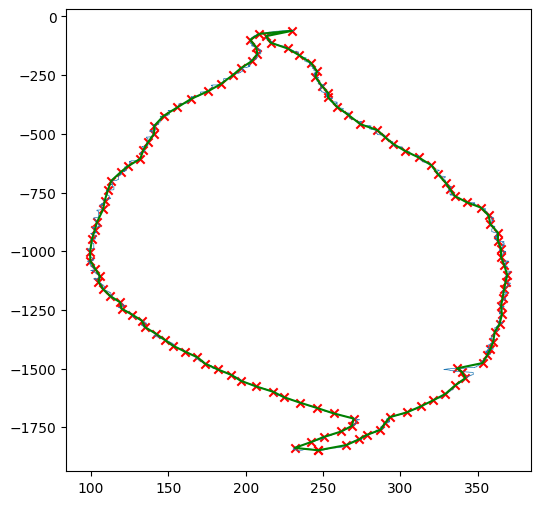

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1662.jpg
Contour shape: (4207, 2)


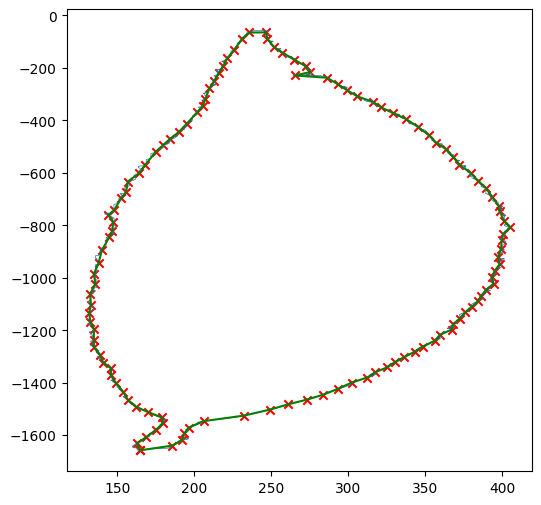

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1672.jpg
Contour shape: (3867, 2)


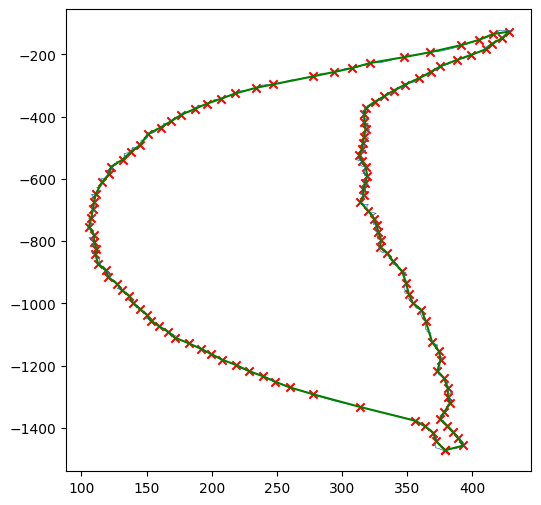

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1668.jpg
Contour shape: (4279, 2)


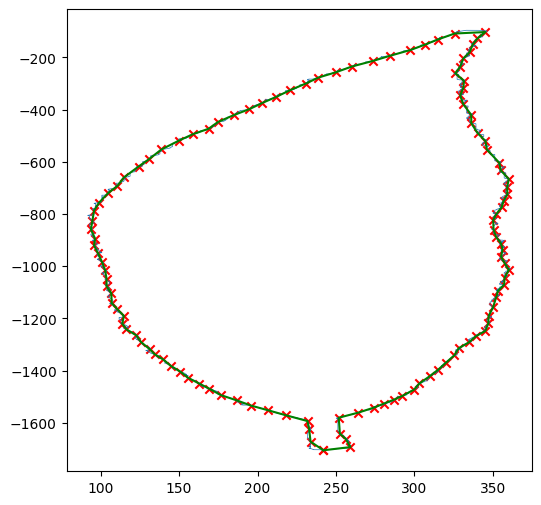

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1673.jpg
Contour shape: (3883, 2)


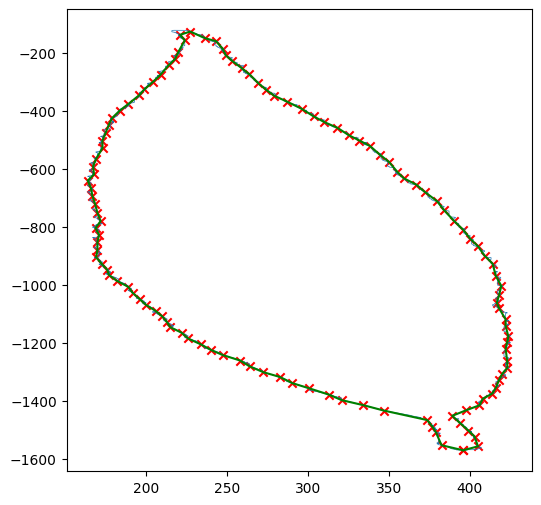

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 6/1667.jpg
Contour shape: (4433, 2)


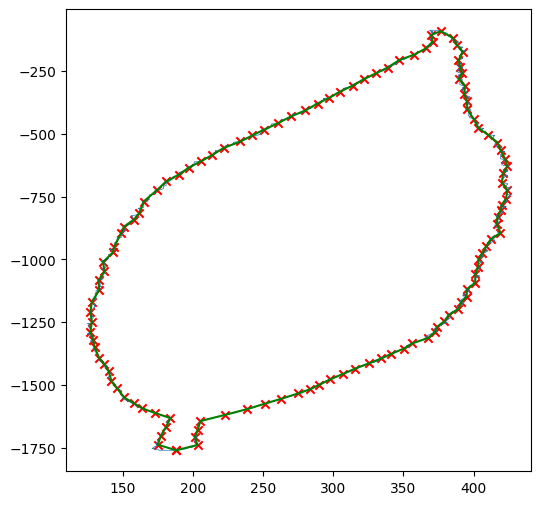

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1274.jpg
Contour shape: (7395, 2)


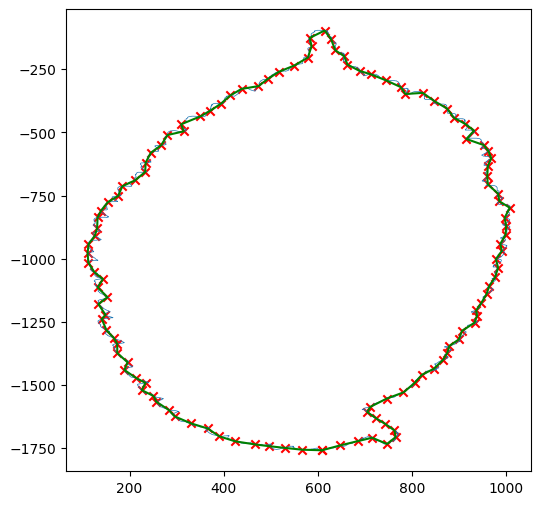

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1269.jpg
Contour shape: (7393, 2)


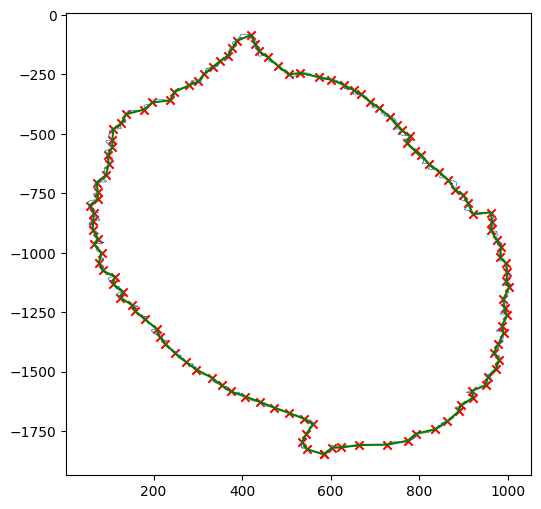

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1273.jpg
Contour shape: (5627, 2)


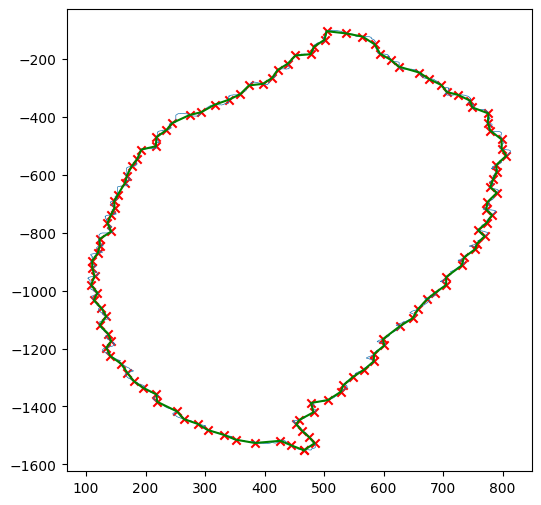

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1268.jpg
Contour shape: (5955, 2)


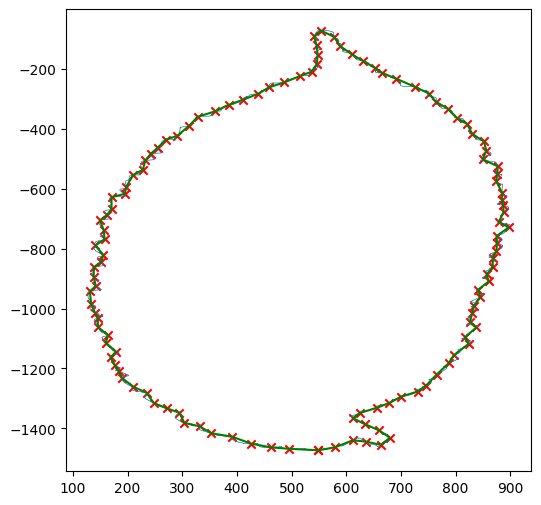

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1271.jpg
Contour shape: (5631, 2)


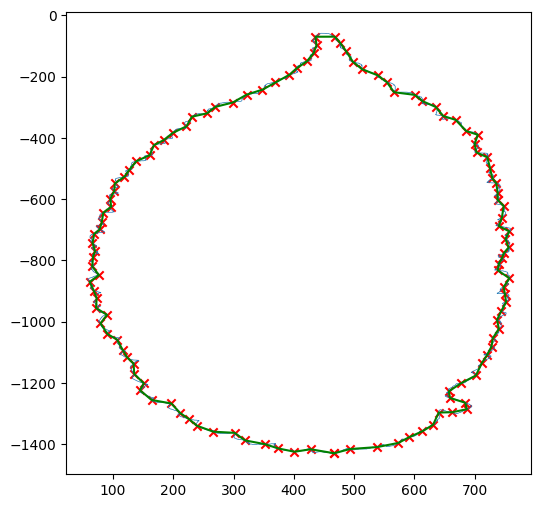

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1262.jpg
Contour shape: (5915, 2)


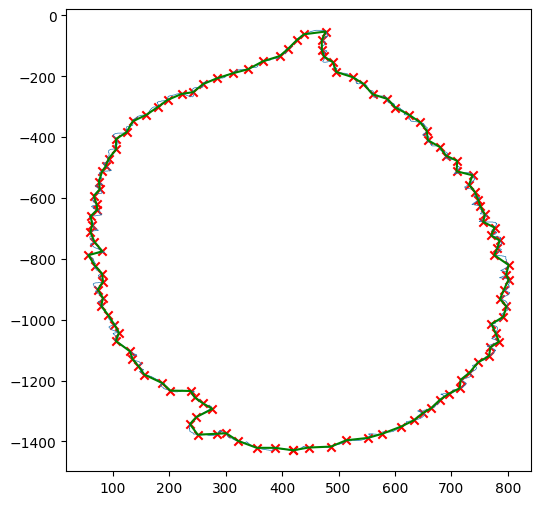

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1260.jpg
Contour shape: (6519, 2)


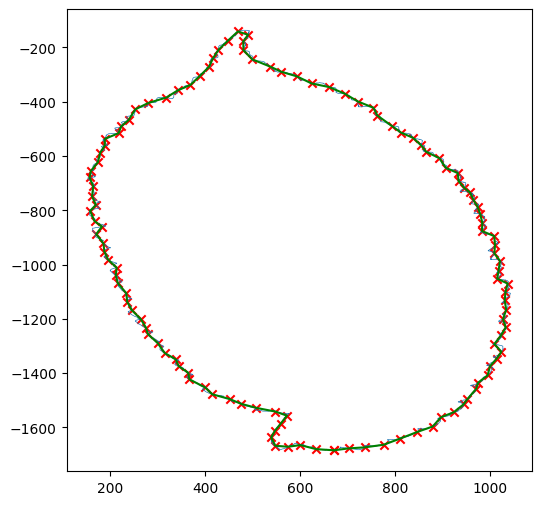

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1258.jpg
Contour shape: (5963, 2)


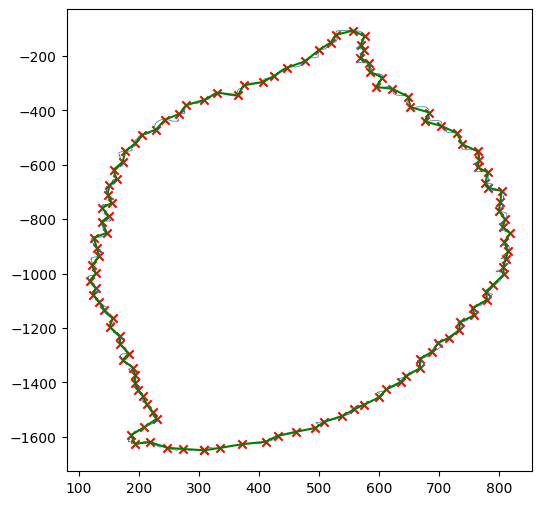

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1257.jpg
Contour shape: (5433, 2)


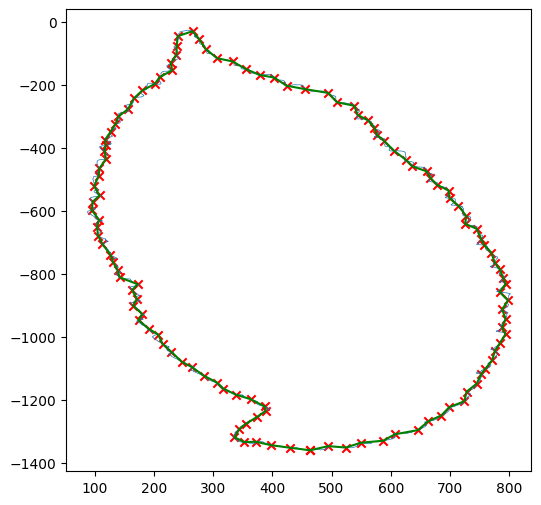

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1266.jpg
Contour shape: (5815, 2)


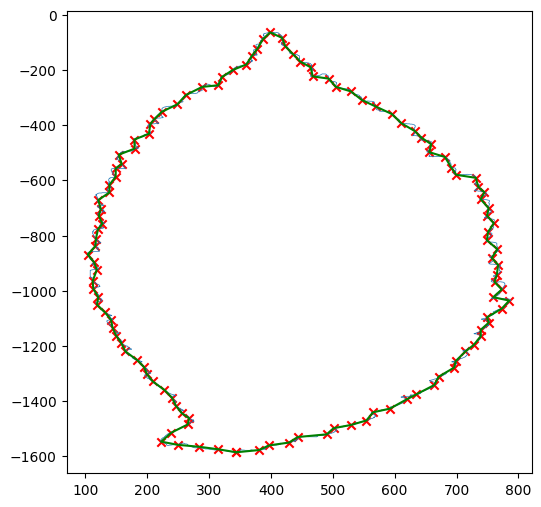

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1267.jpg
Contour shape: (6135, 2)


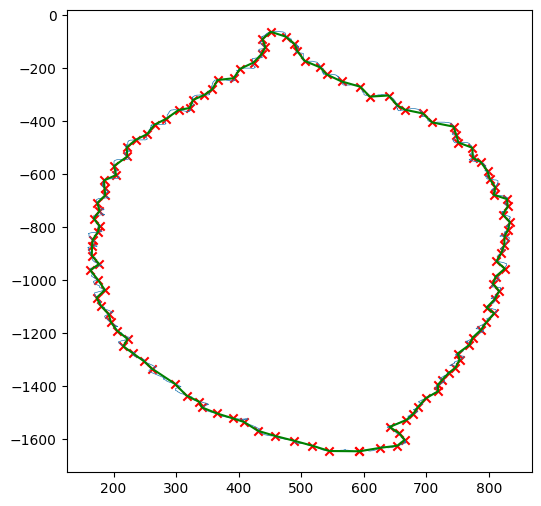

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1272.jpg
Contour shape: (5443, 2)


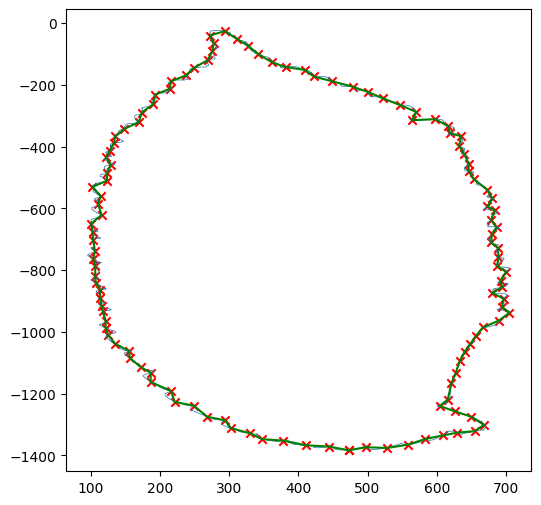

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1261.jpg
Contour shape: (7127, 2)


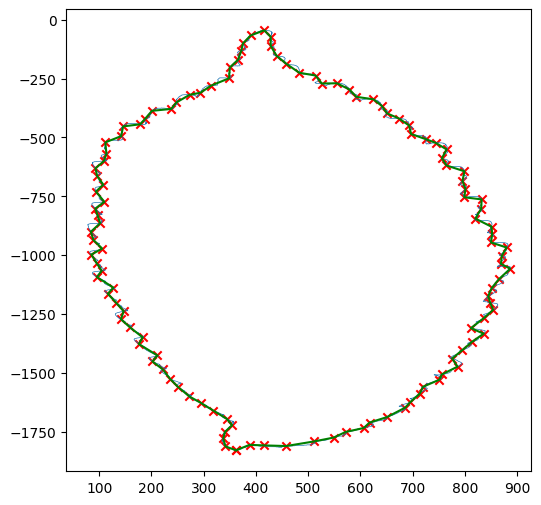

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1263.jpg
Contour shape: (5359, 2)


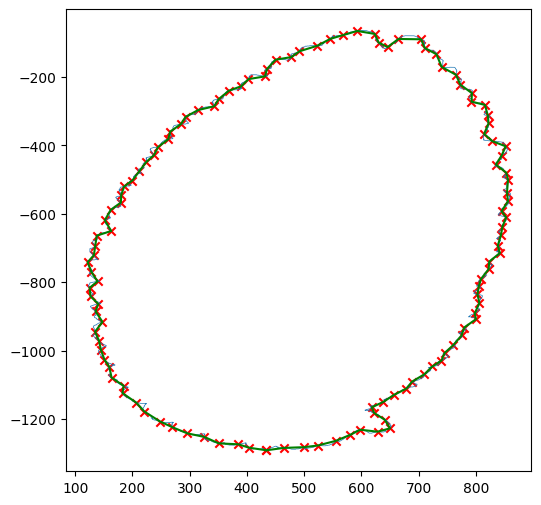

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1259.jpg
Contour shape: (5689, 2)


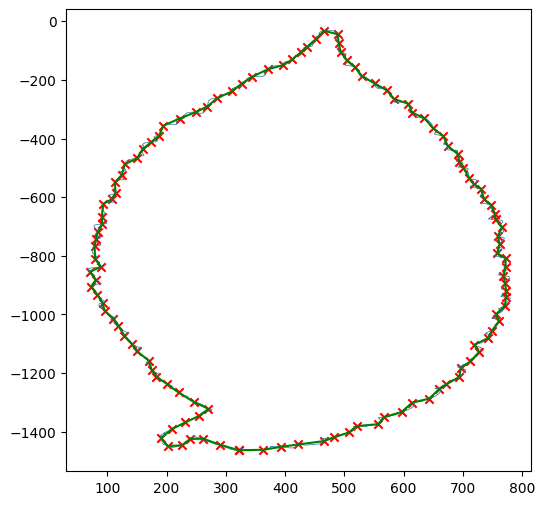

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1264.jpg
Contour shape: (6733, 2)


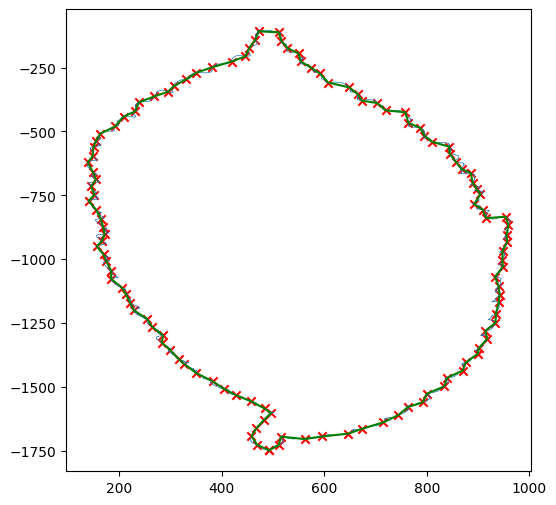

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1256.jpg
Contour shape: (2811, 2)


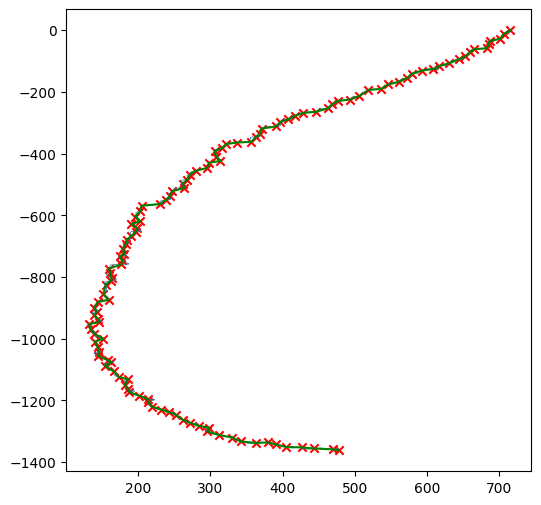

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1265.jpg
Contour shape: (5489, 2)


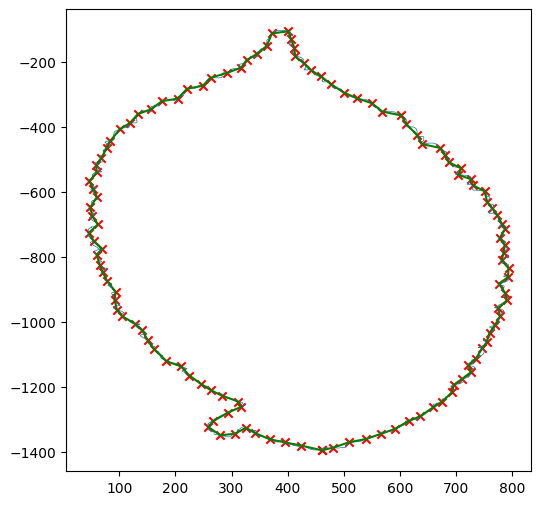

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 2/1270.jpg
Contour shape: (6009, 2)


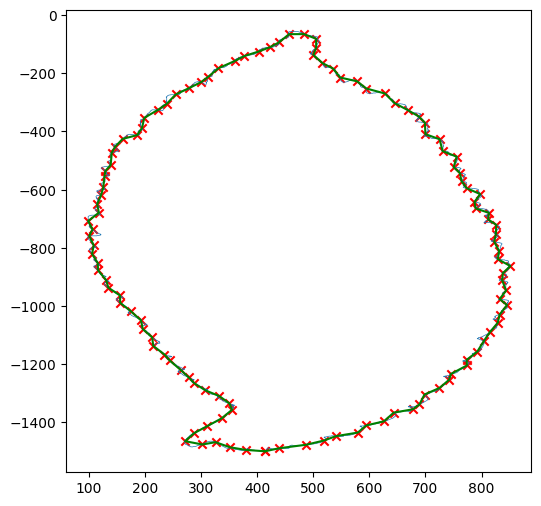

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2372.jpg
Contour shape: (7965, 2)


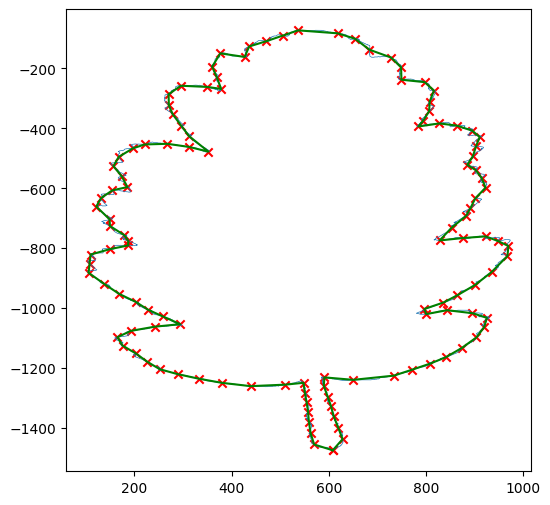

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2360.jpg
Contour shape: (5951, 2)


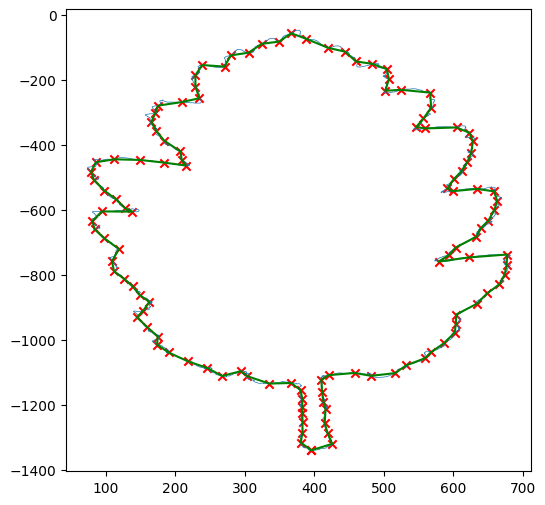

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2361.jpg
Contour shape: (6009, 2)


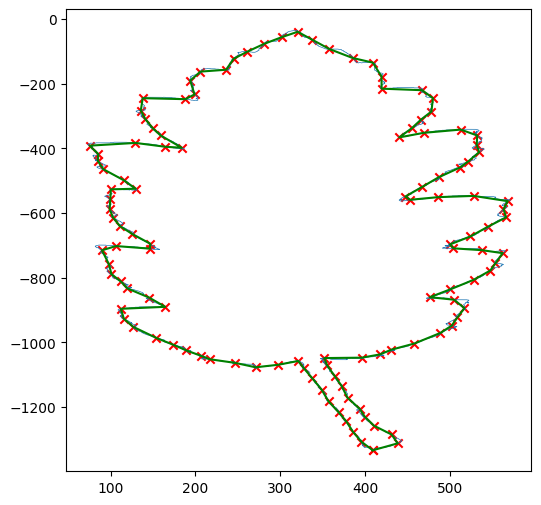

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2368.jpg
Contour shape: (6411, 2)


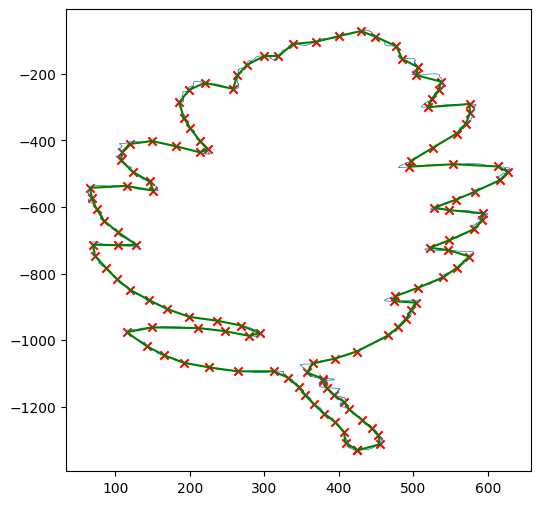

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2369.jpg
Contour shape: (6135, 2)


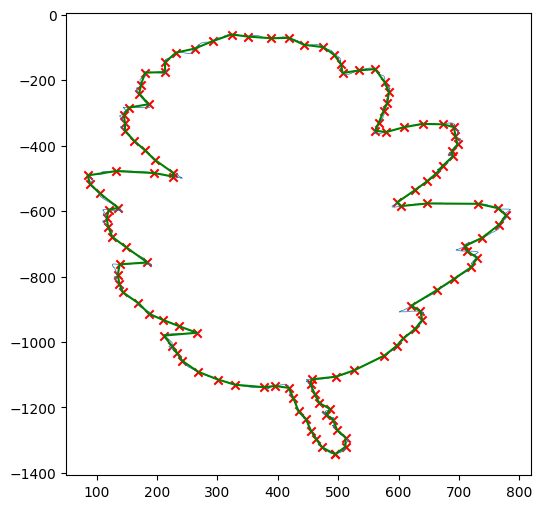

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2371.jpg
Contour shape: (7525, 2)


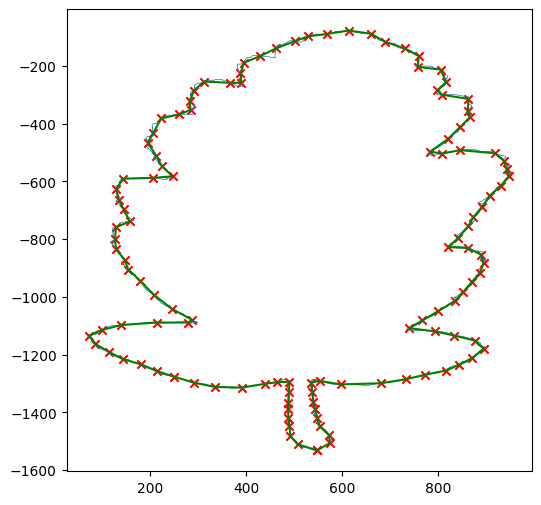

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2365.jpg
Contour shape: (6465, 2)


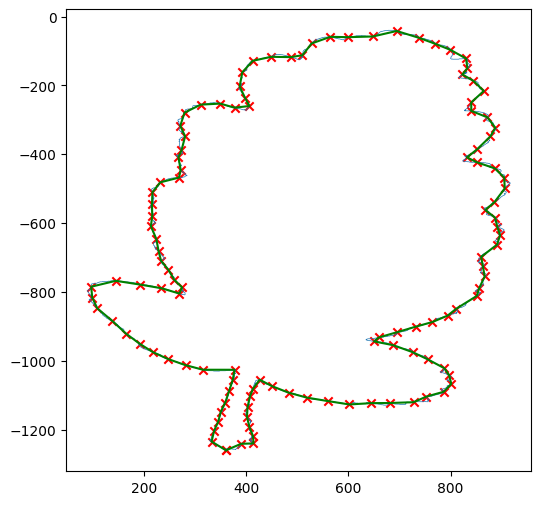

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2366.jpg
Contour shape: (5889, 2)


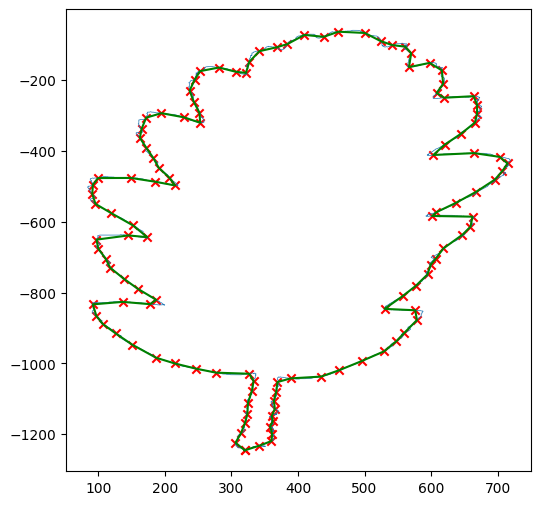

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2358.jpg
Contour shape: (7521, 2)


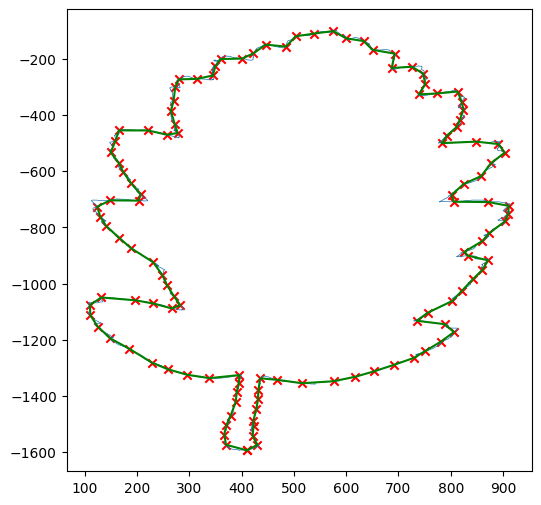

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2359.jpg
Contour shape: (6687, 2)


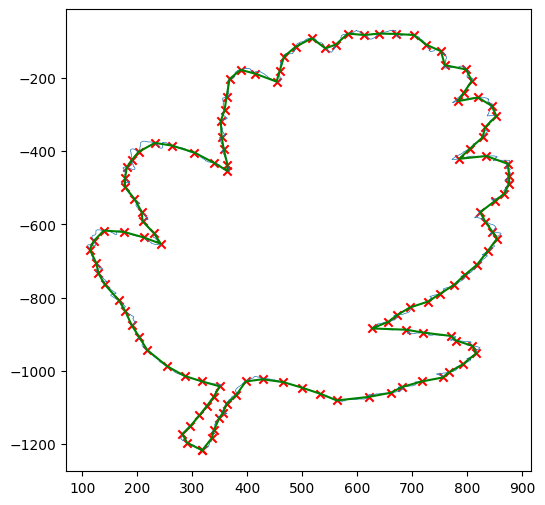

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2364.jpg
Contour shape: (6603, 2)


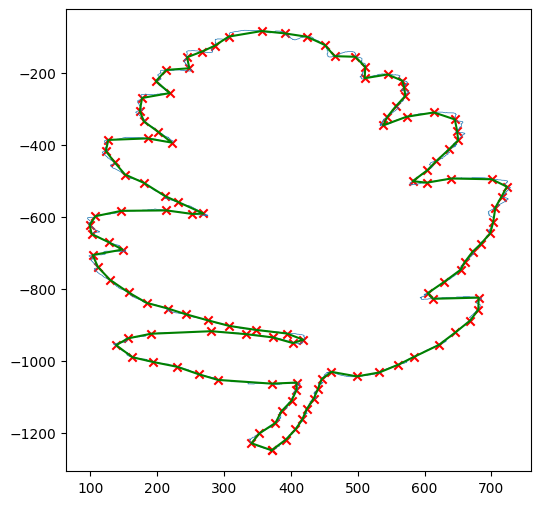

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2362.jpg
Contour shape: (6081, 2)


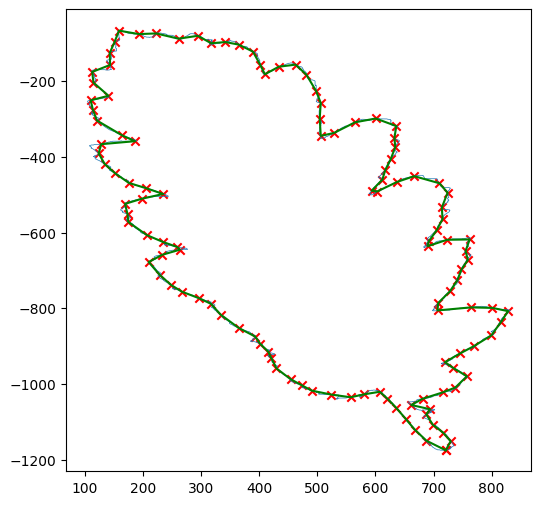

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2356.jpg
Contour shape: (9773, 2)


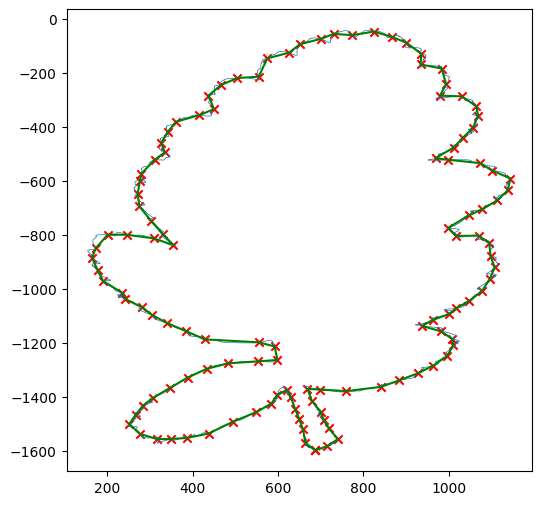

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2357.jpg
Contour shape: (9021, 2)


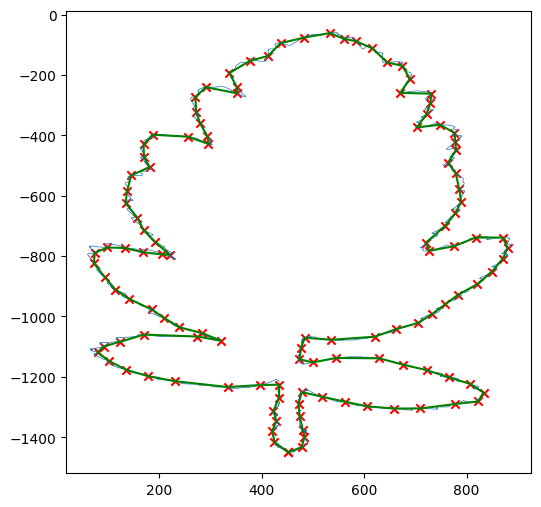

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2374.jpg
Contour shape: (7987, 2)


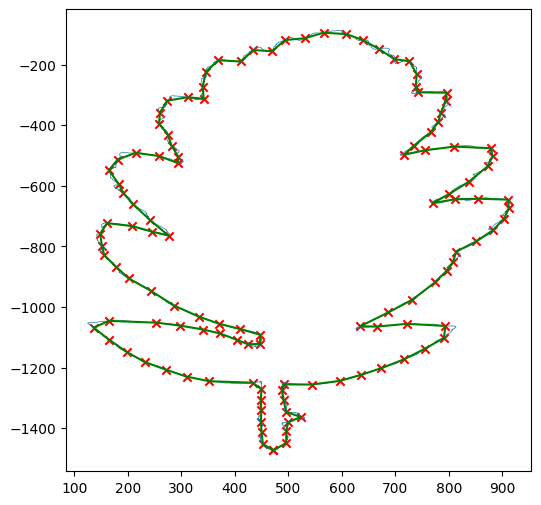

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2373.jpg
Contour shape: (6837, 2)


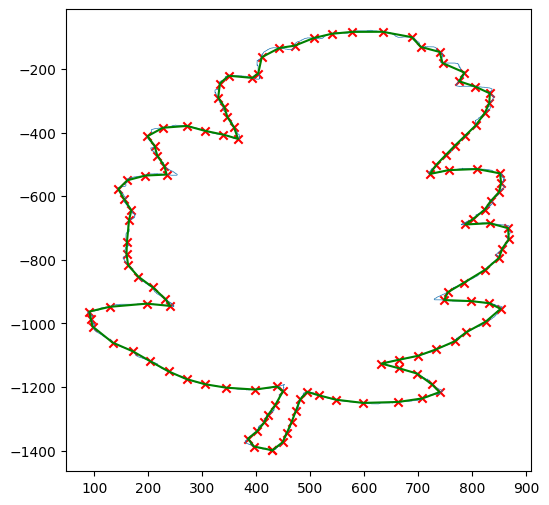

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2367.jpg
Contour shape: (7317, 2)


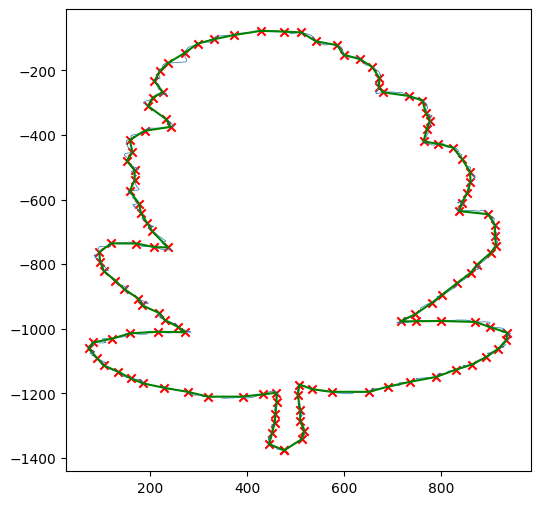

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2370.jpg
Contour shape: (7167, 2)


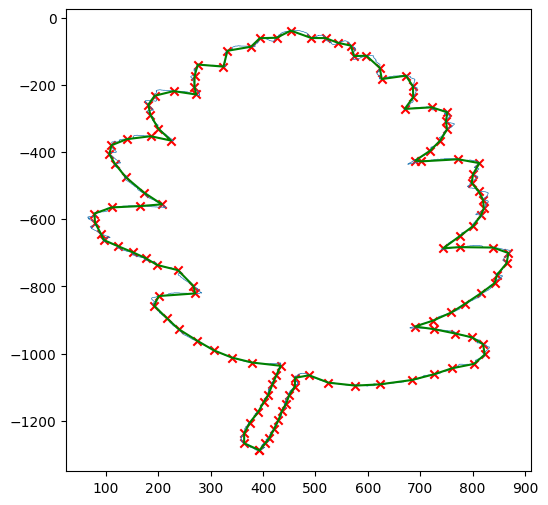

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 13/2363.jpg
Contour shape: (5837, 2)


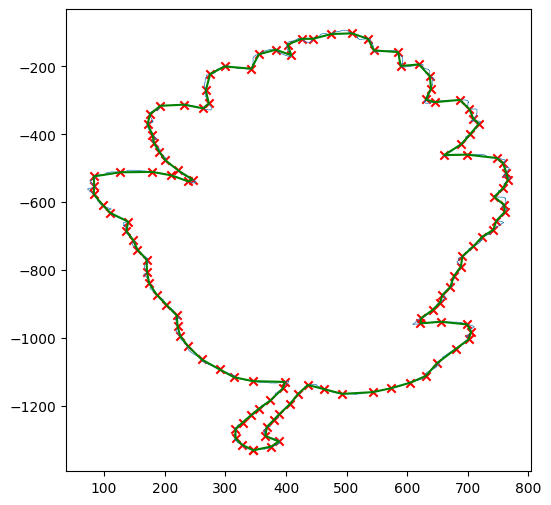

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1958.jpg
Contour shape: (19679, 2)


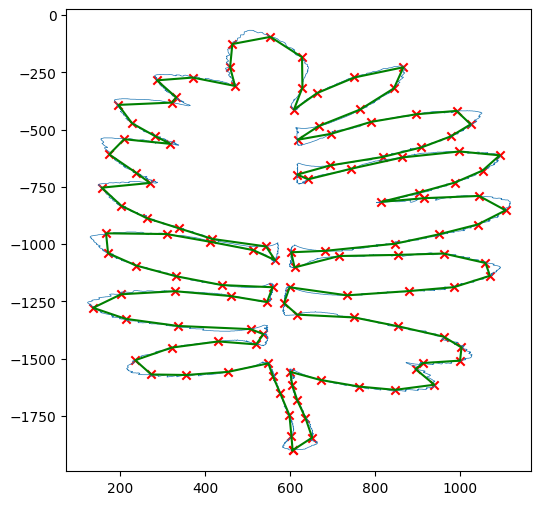

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1969.jpg
Contour shape: (17547, 2)


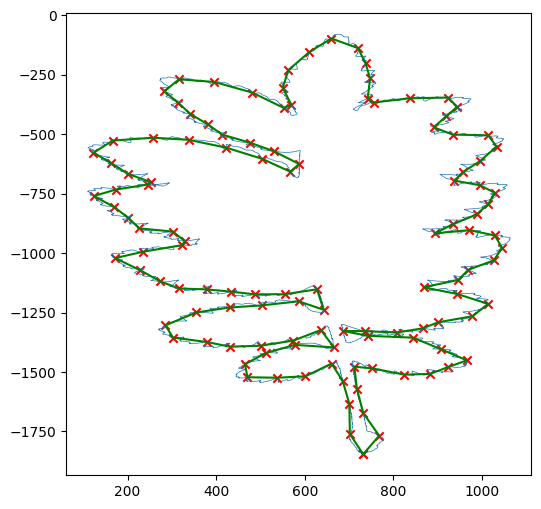

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1970.jpg
Contour shape: (19443, 2)


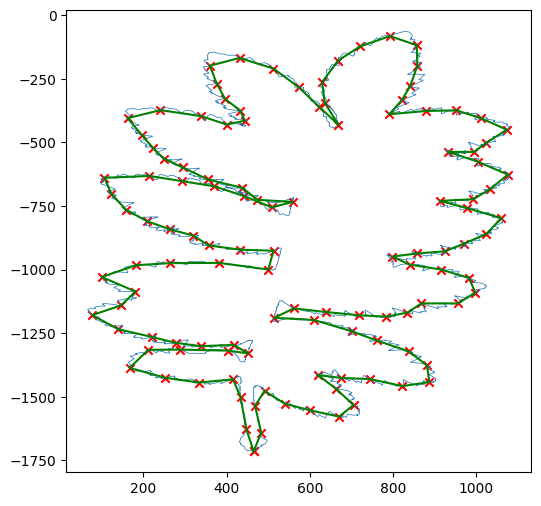

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1964.jpg
Contour shape: (28527, 2)


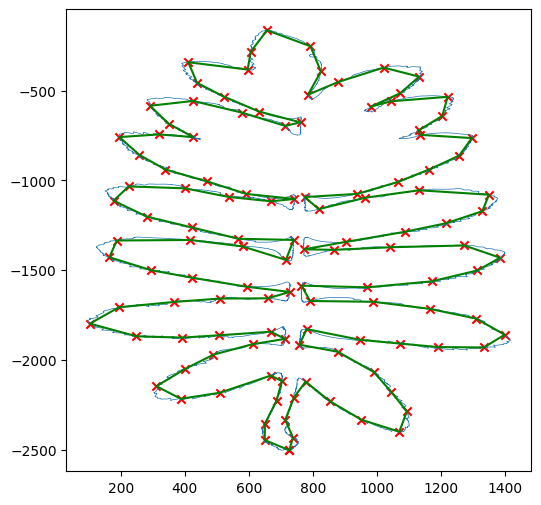

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1961.jpg
Contour shape: (38713, 2)


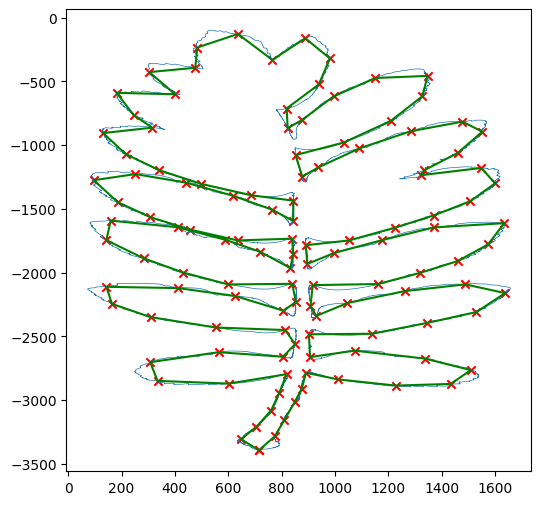

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1971.jpg
Contour shape: (25815, 2)


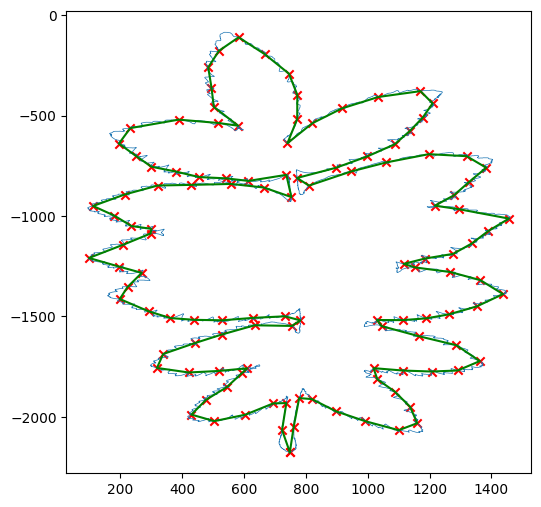

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1957.jpg
Contour shape: (29551, 2)


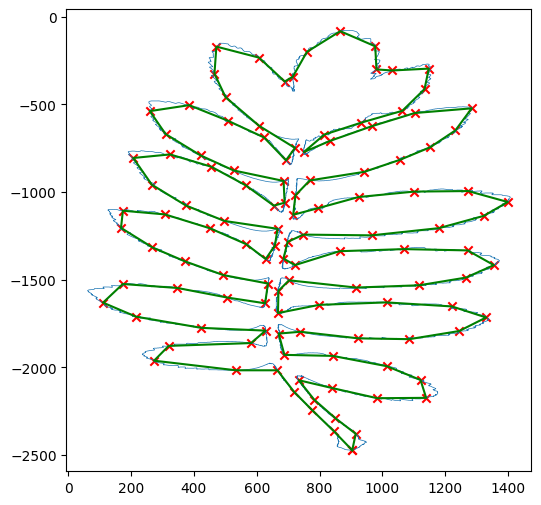

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1973.jpg
Contour shape: (22705, 2)


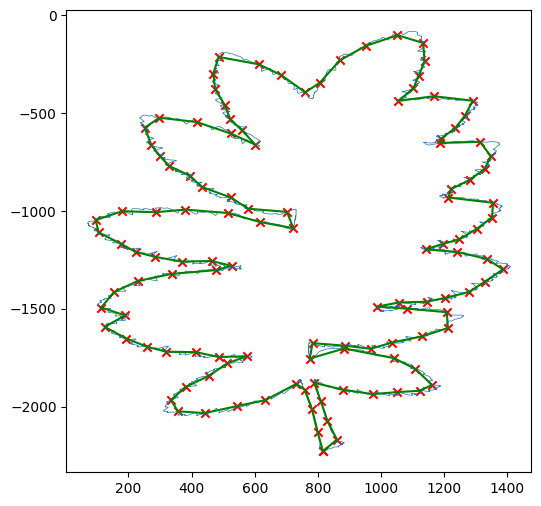

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1963.jpg
Contour shape: (34801, 2)


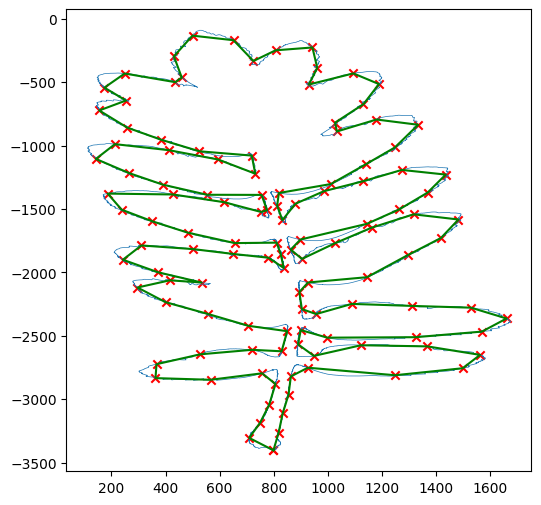

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1972.jpg
Contour shape: (26201, 2)


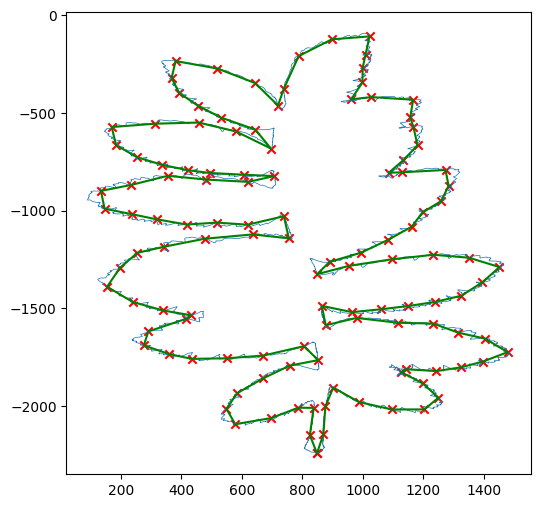

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1965.jpg
Contour shape: (26613, 2)


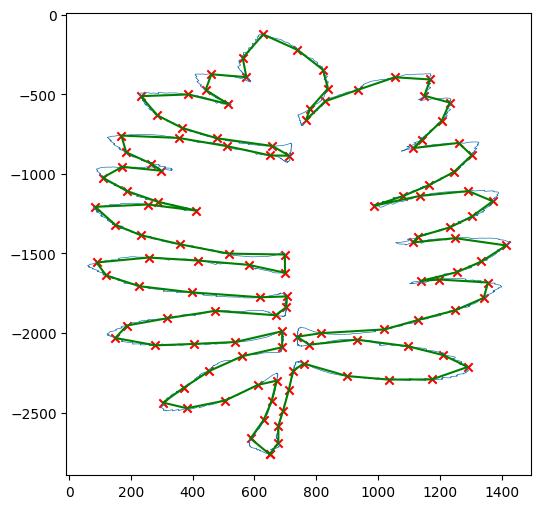

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1968.jpg
Contour shape: (26969, 2)


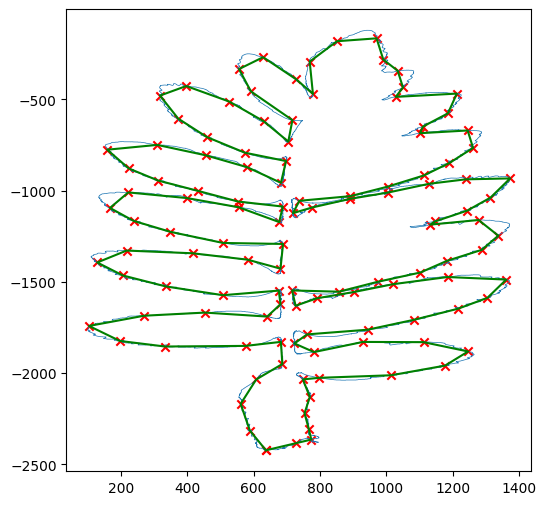

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1960.jpg
Contour shape: (40813, 2)


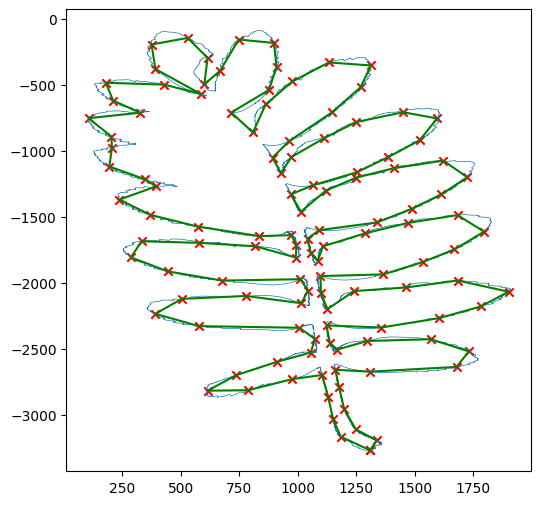

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1966.jpg
Contour shape: (33965, 2)


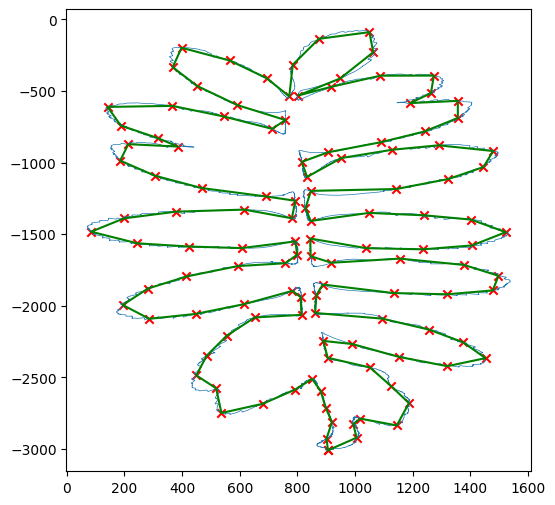

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1959.jpg
Contour shape: (27239, 2)


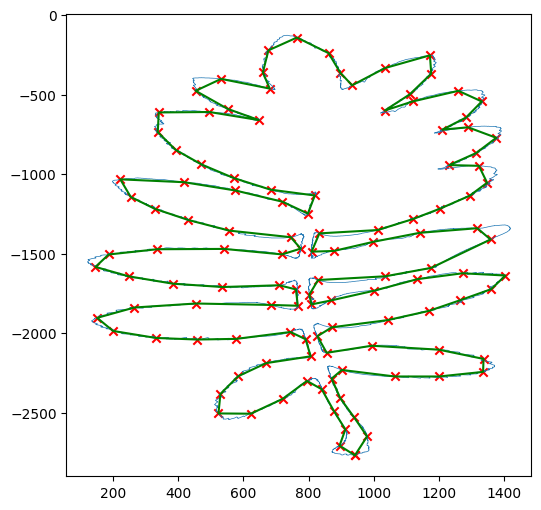

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1967.jpg
Contour shape: (29213, 2)


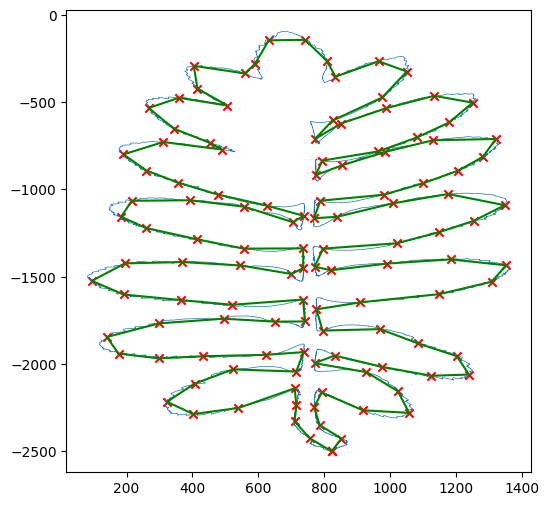

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1962.jpg
Contour shape: (22307, 2)


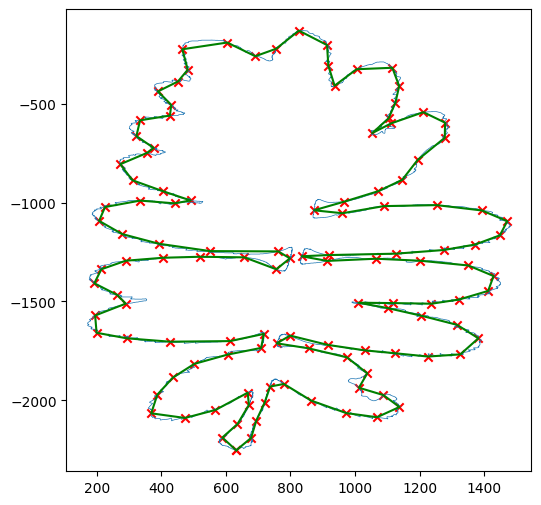

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1956.jpg
Contour shape: (35127, 2)


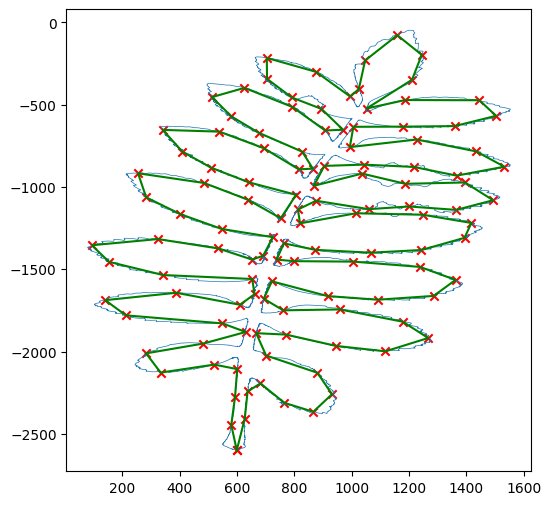

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 9/1974.jpg
Contour shape: (18981, 2)


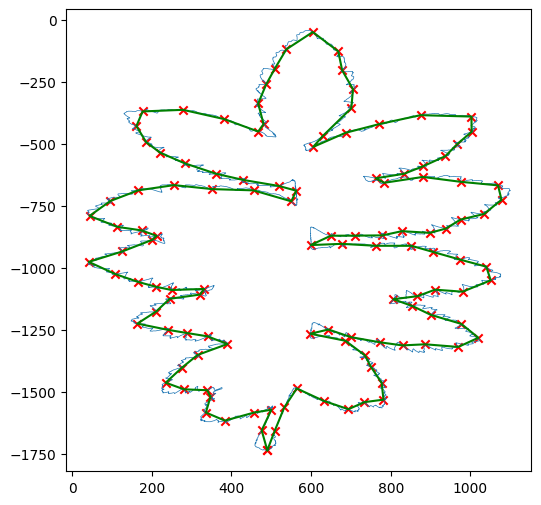

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2261.jpg
Contour shape: (5783, 2)


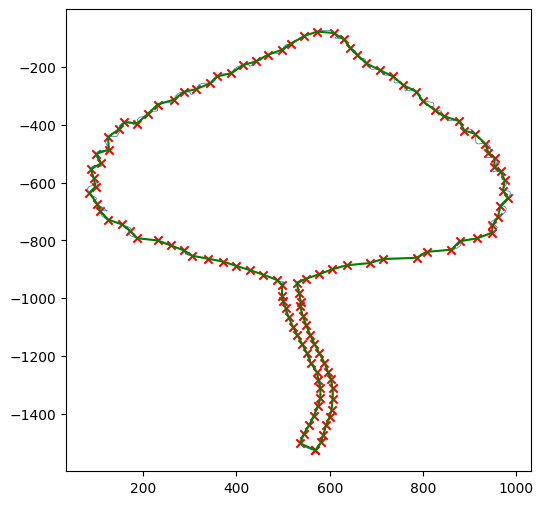

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2264.jpg
Contour shape: (6143, 2)


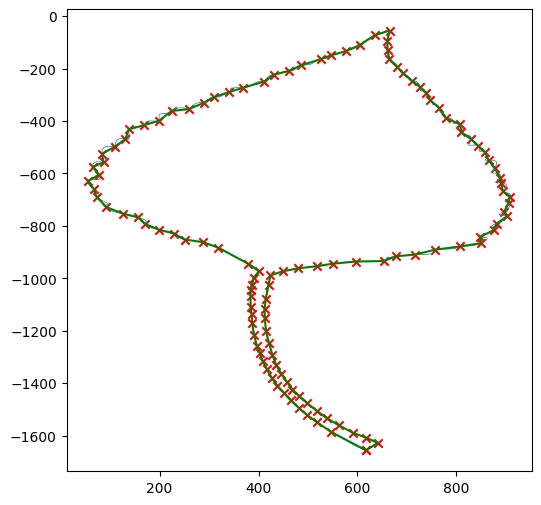

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2273.jpg
Contour shape: (7189, 2)


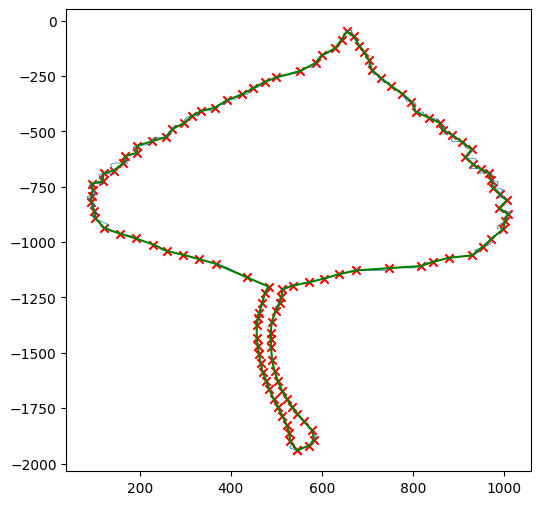

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2270.jpg
Contour shape: (6099, 2)


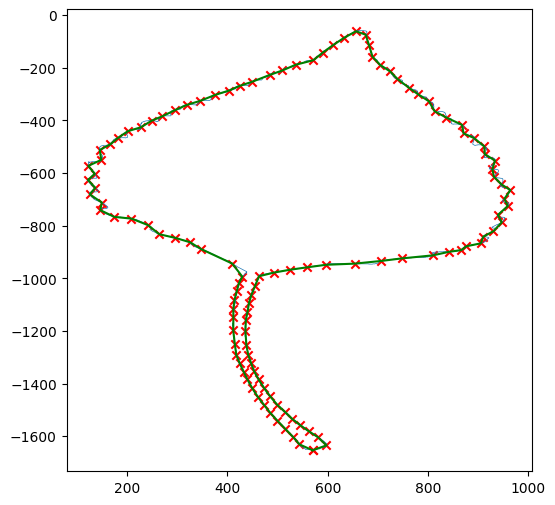

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2260.jpg
Contour shape: (6995, 2)


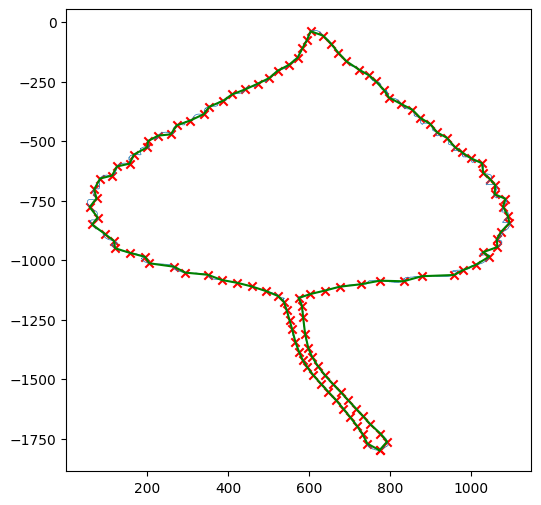

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2271.jpg
Contour shape: (6357, 2)


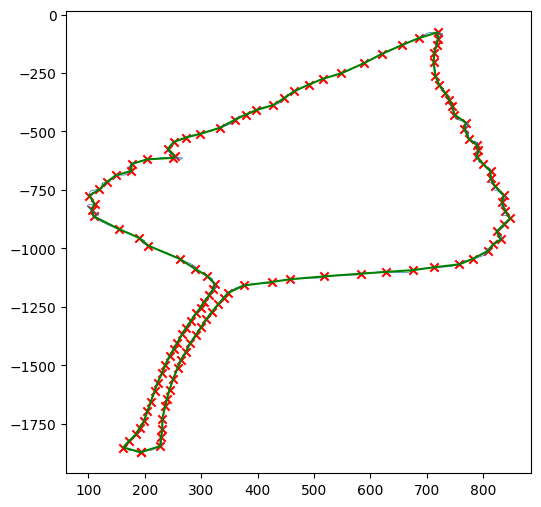

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2268.jpg
Contour shape: (4795, 2)


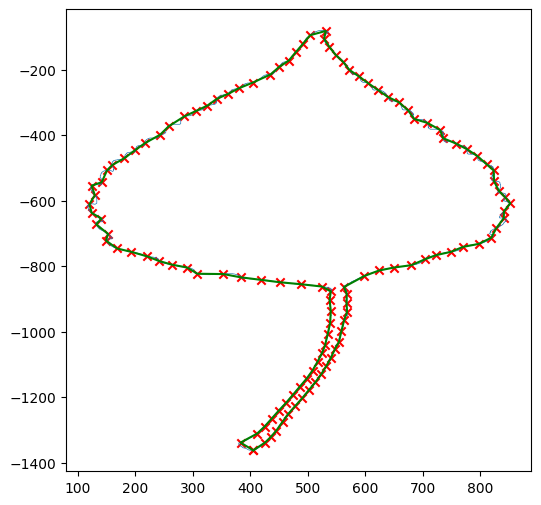

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2269.jpg
Contour shape: (6727, 2)


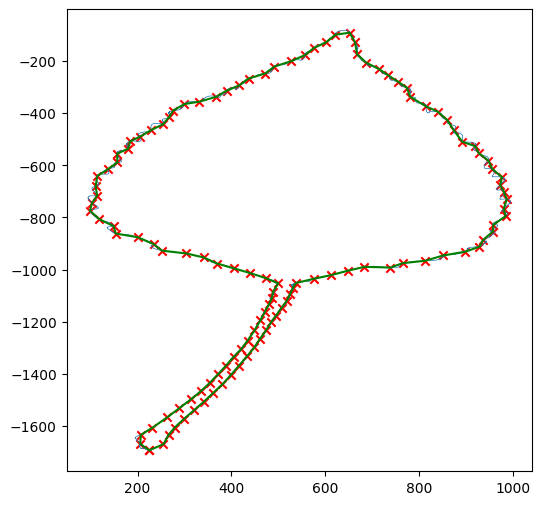

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2257.jpg
Contour shape: (5987, 2)


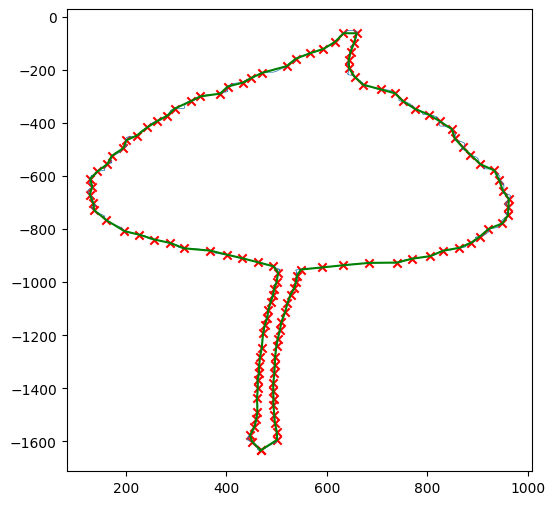

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2256.jpg
Contour shape: (6515, 2)


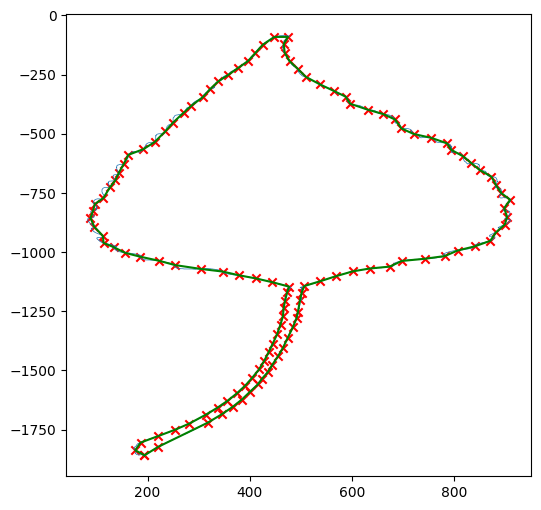

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2274.jpg
Contour shape: (7633, 2)


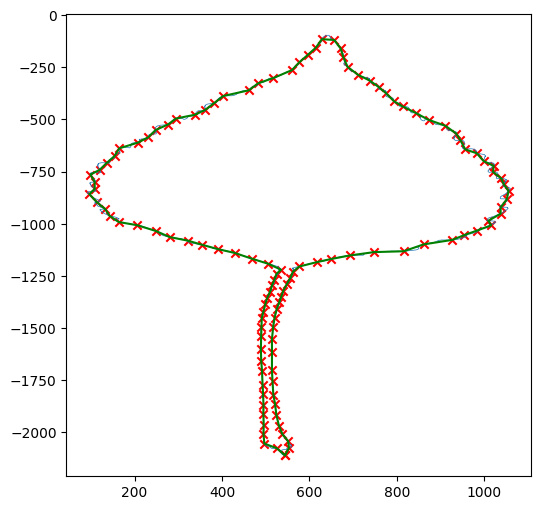

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2258.jpg
Contour shape: (6389, 2)


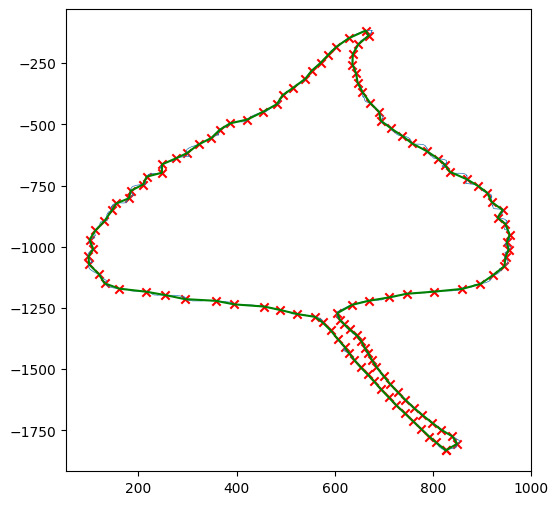

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2272.jpg
Contour shape: (3955, 2)


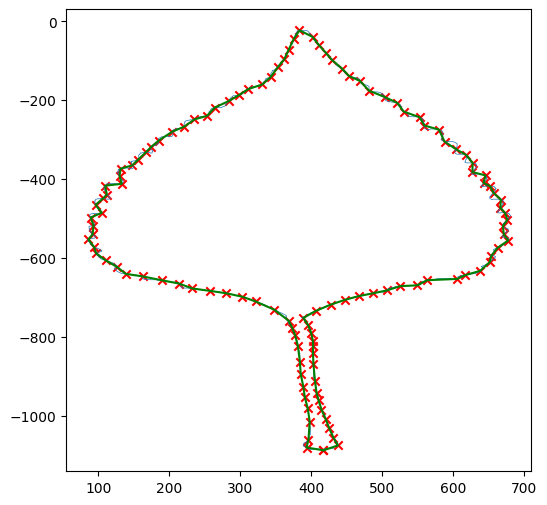

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2265.jpg
Contour shape: (5589, 2)


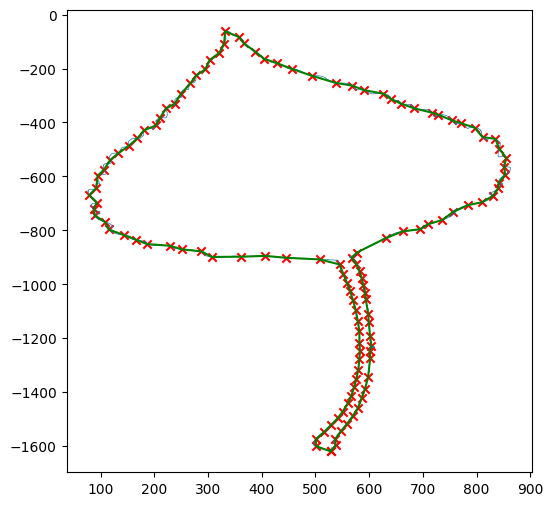

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2263.jpg
Contour shape: (6975, 2)


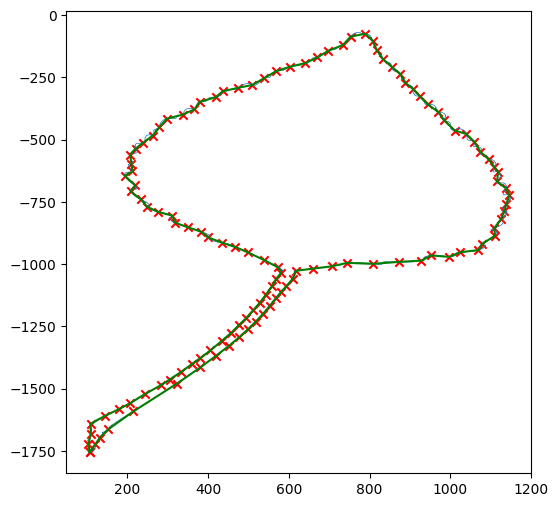

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2262.jpg
Contour shape: (6221, 2)


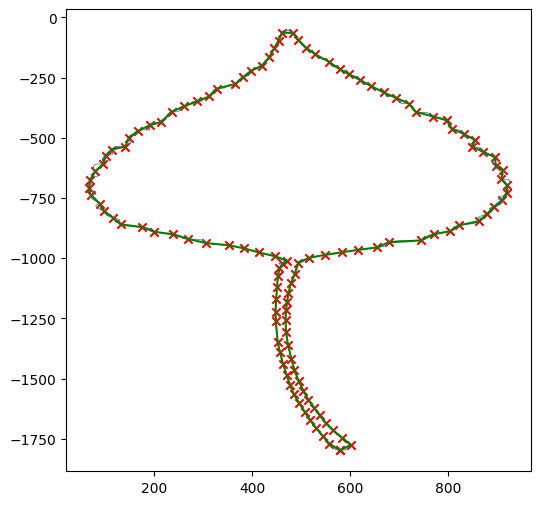

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2259.jpg
Contour shape: (7639, 2)


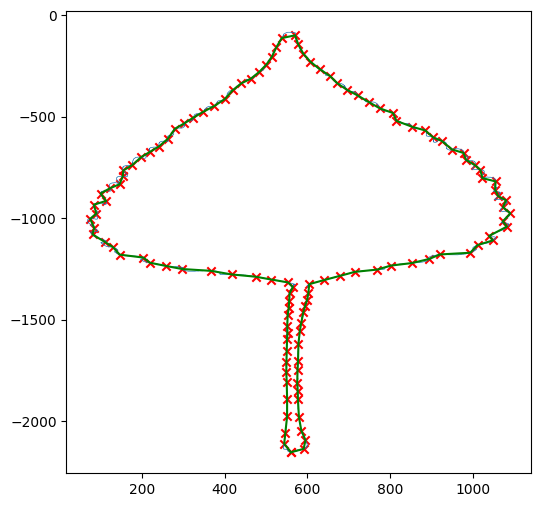

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2266.jpg
Contour shape: (6323, 2)


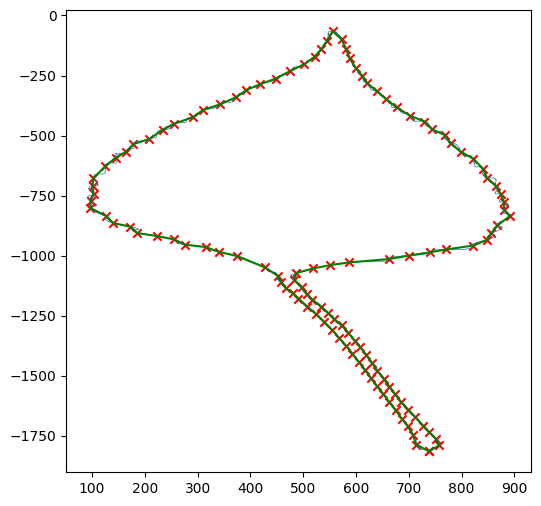

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 12/2267.jpg
Contour shape: (5331, 2)


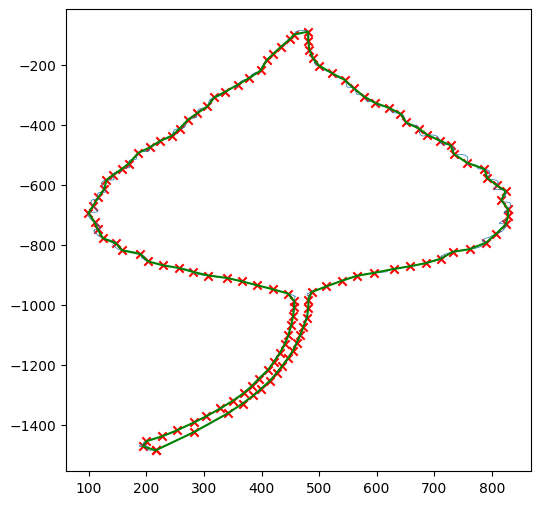

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1769.jpg
Contour shape: (5603, 2)


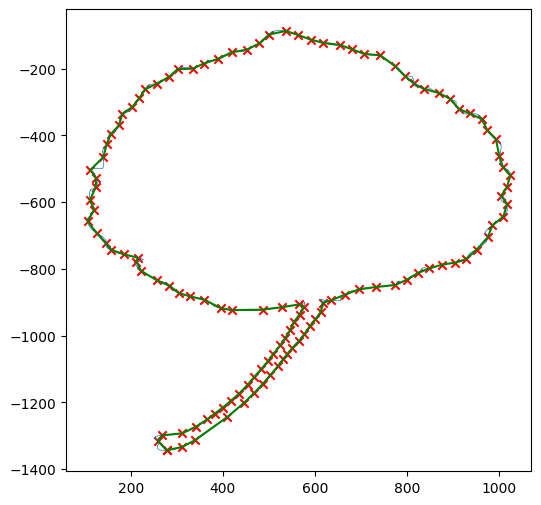

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1760.jpg
Contour shape: (4553, 2)


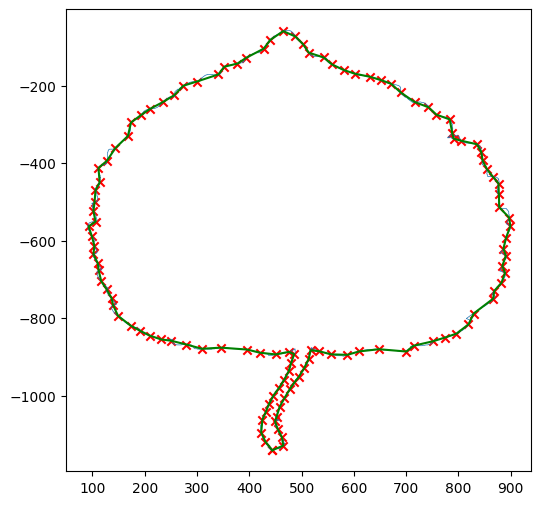

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1765.jpg
Contour shape: (7233, 2)


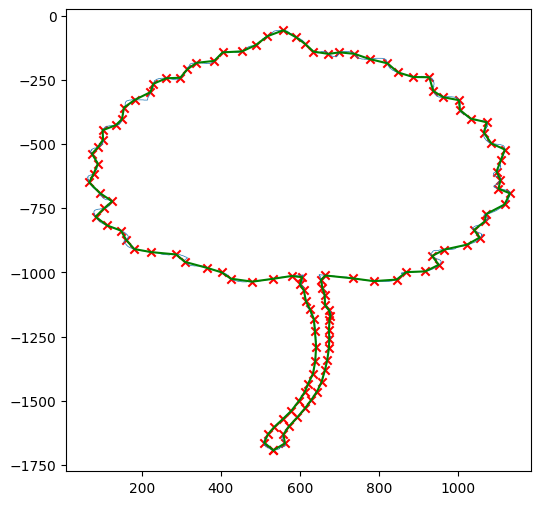

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1761.jpg
Contour shape: (7203, 2)


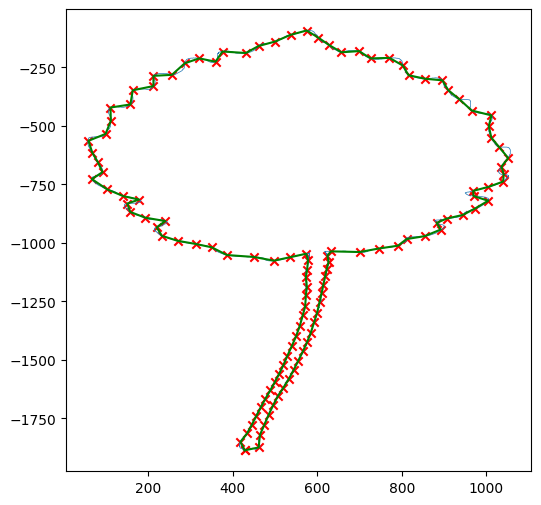

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1763.jpg
Contour shape: (5767, 2)


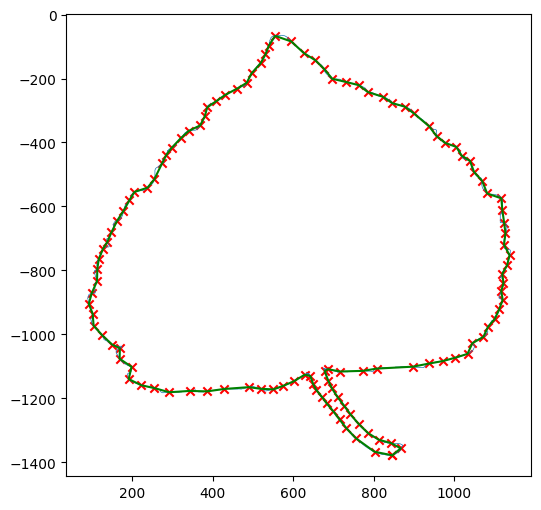

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1764.jpg
Contour shape: (4701, 2)


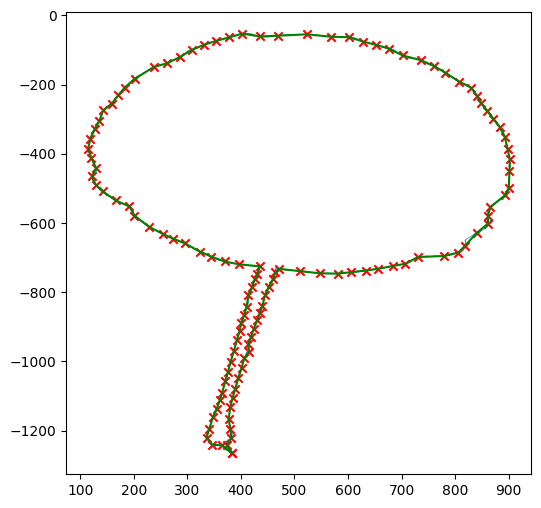

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1762.jpg
Contour shape: (4817, 2)


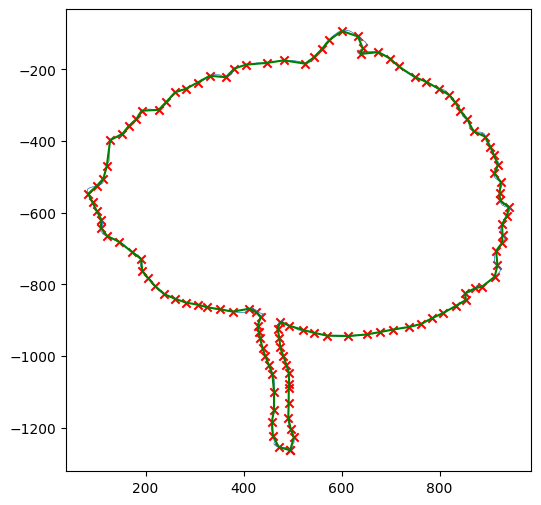

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1756.jpg
Contour shape: (6211, 2)


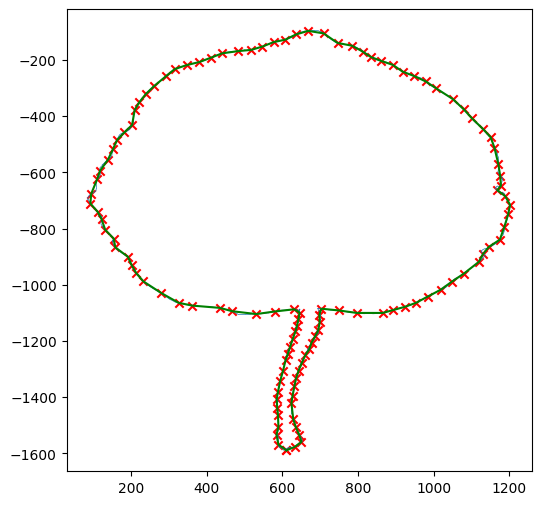

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1758.jpg
Contour shape: (4495, 2)


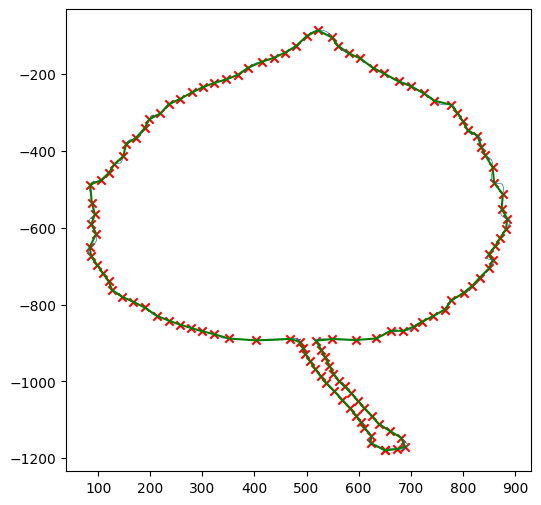

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1770.jpg
Contour shape: (5603, 2)


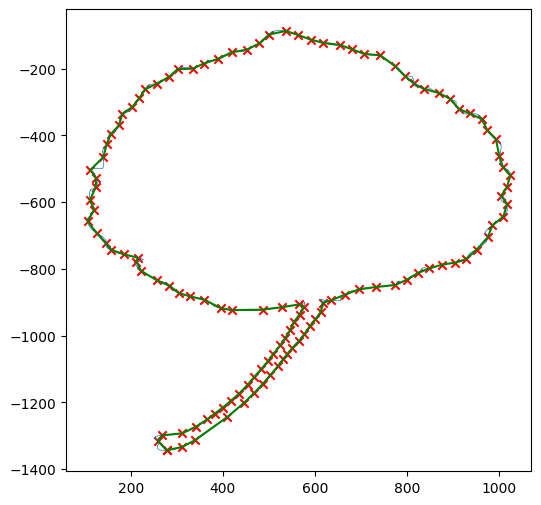

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1774.jpg
Contour shape: (4753, 2)


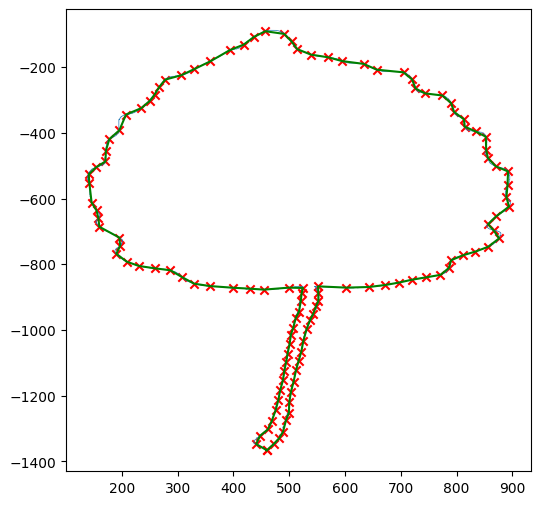

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1771.jpg
Contour shape: (5231, 2)


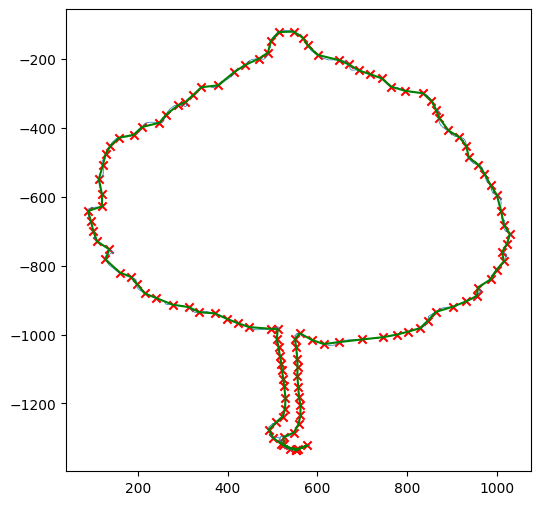

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1759.jpg
Contour shape: (5671, 2)


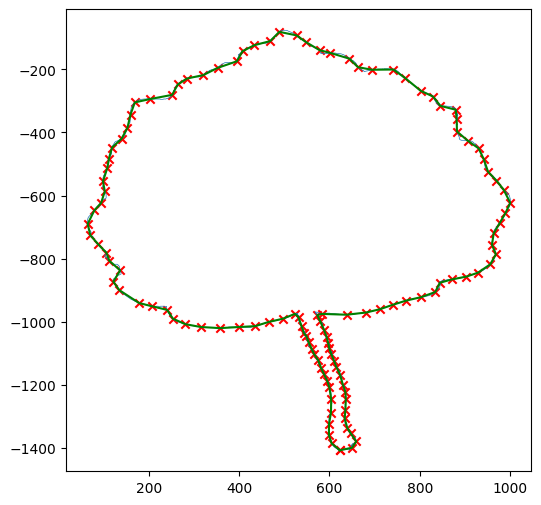

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1772.jpg
Contour shape: (3745, 2)


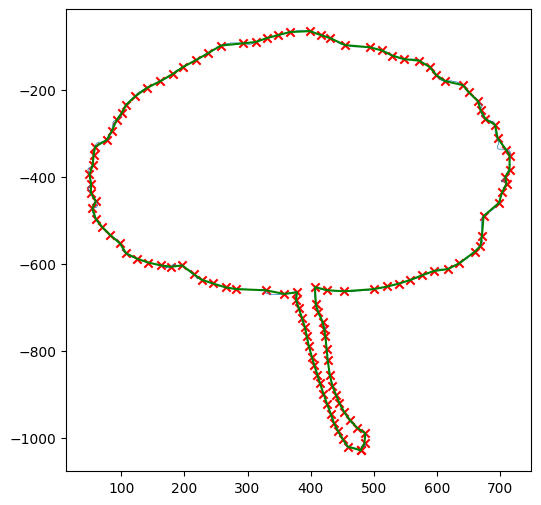

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1768.jpg
Contour shape: (5485, 2)


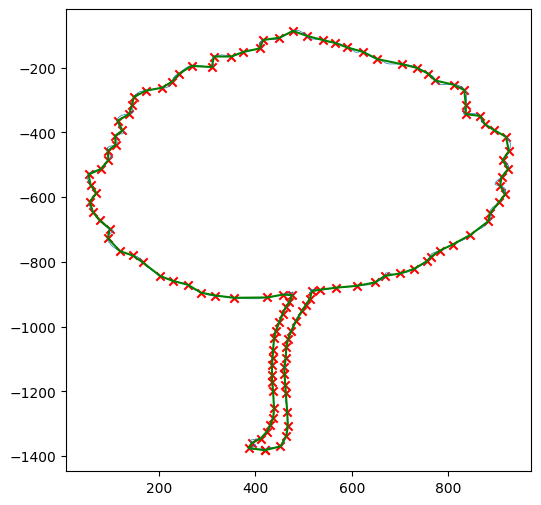

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1773.jpg
Contour shape: (7593, 2)


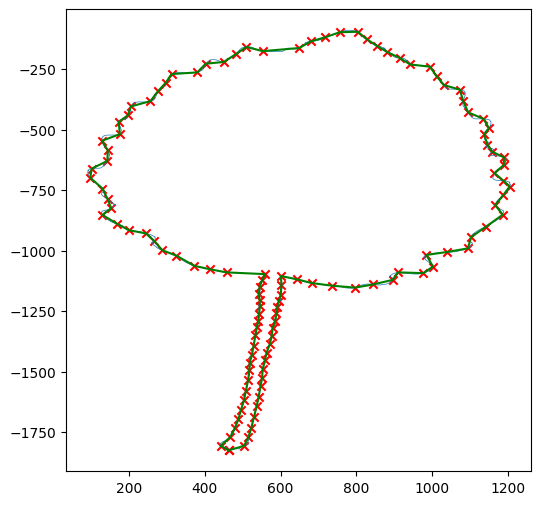

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1757.jpg
Contour shape: (5829, 2)


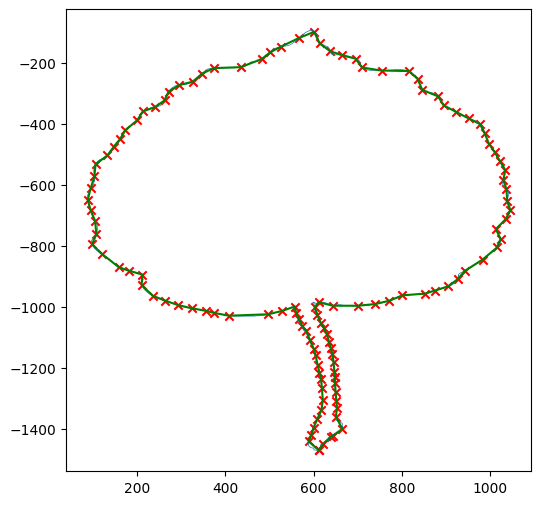

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1766.jpg
Contour shape: (6519, 2)


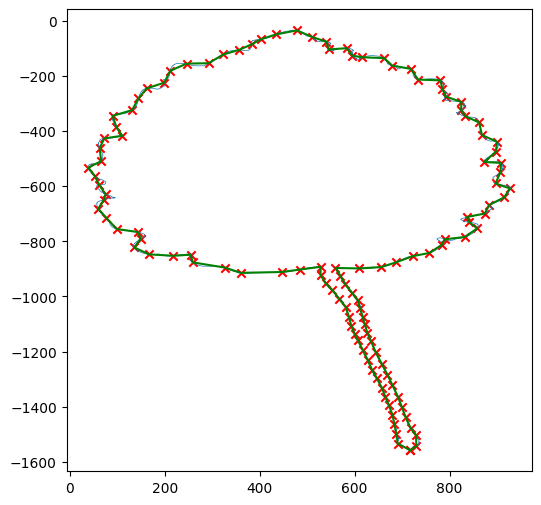

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 7/1767.jpg
Contour shape: (5207, 2)


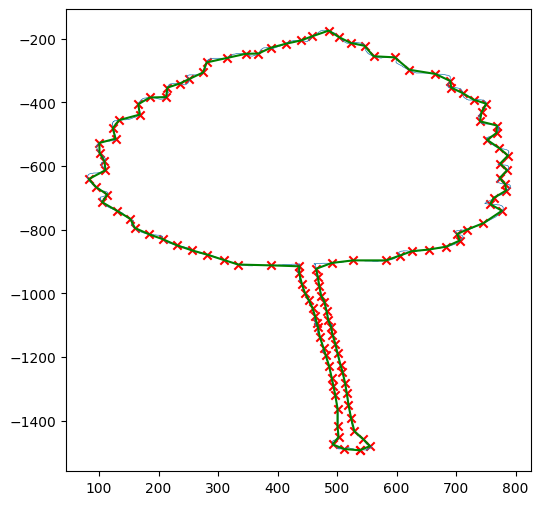

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2067.jpg
Contour shape: (4591, 2)


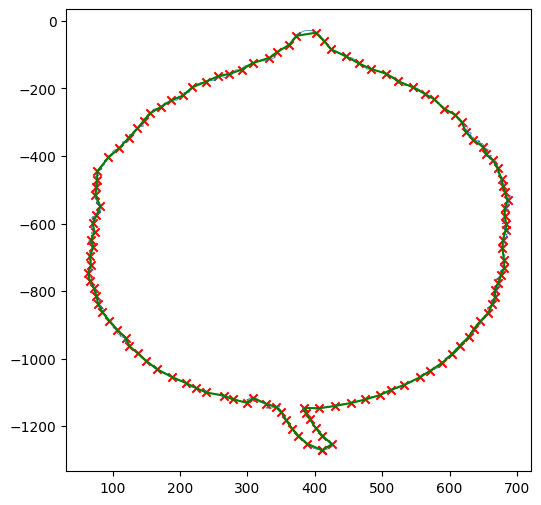

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2060.jpg
Contour shape: (5127, 2)


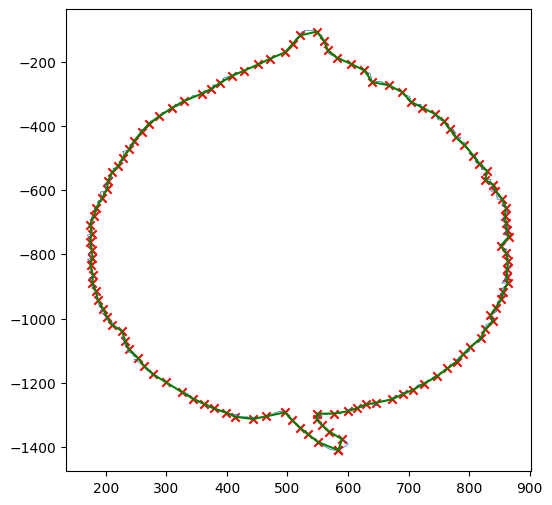

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2057.jpg
Contour shape: (3775, 2)


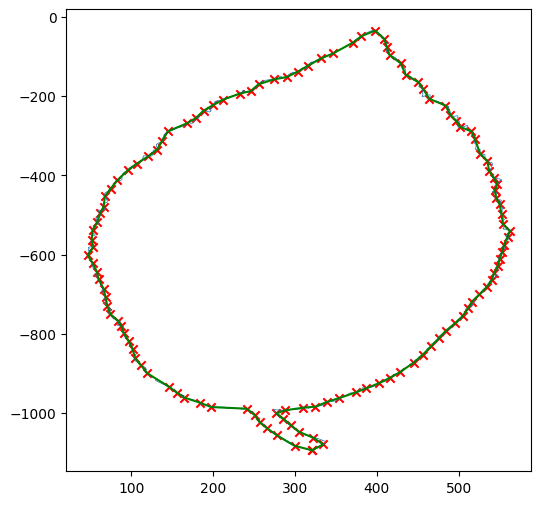

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2058.jpg
Contour shape: (4451, 2)


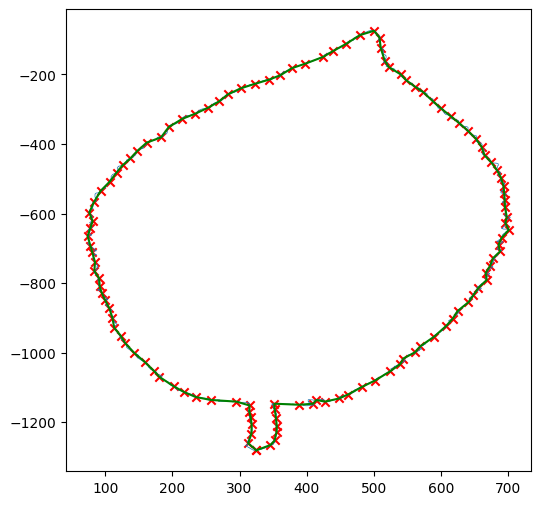

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2062.jpg
Contour shape: (4525, 2)


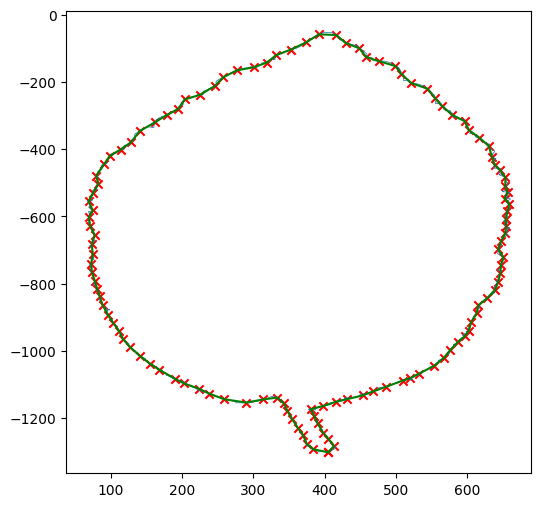

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2066.jpg
Contour shape: (4035, 2)


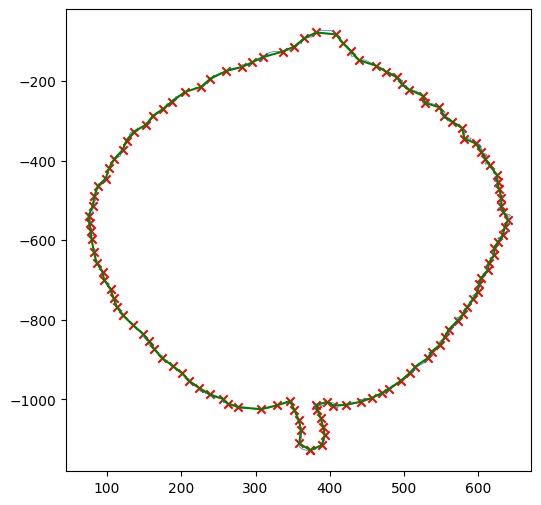

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2063.jpg
Contour shape: (5011, 2)


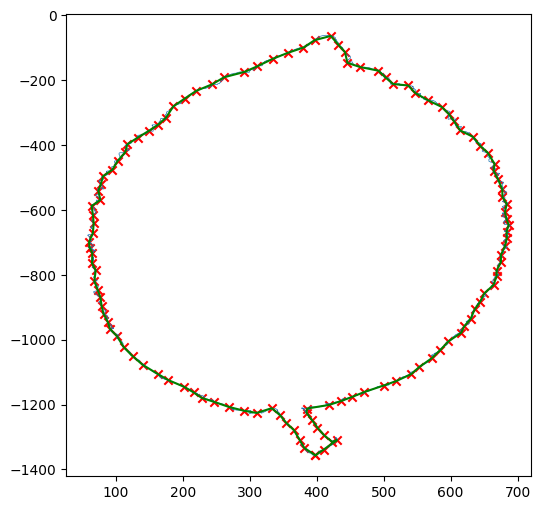

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2070.jpg
Contour shape: (3621, 2)


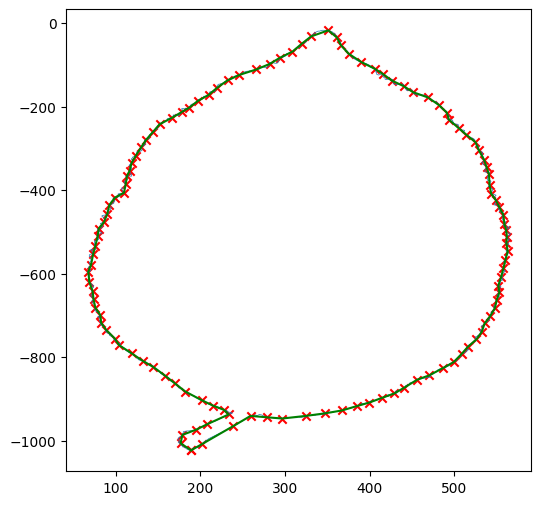

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2065.jpg
Contour shape: (3189, 2)


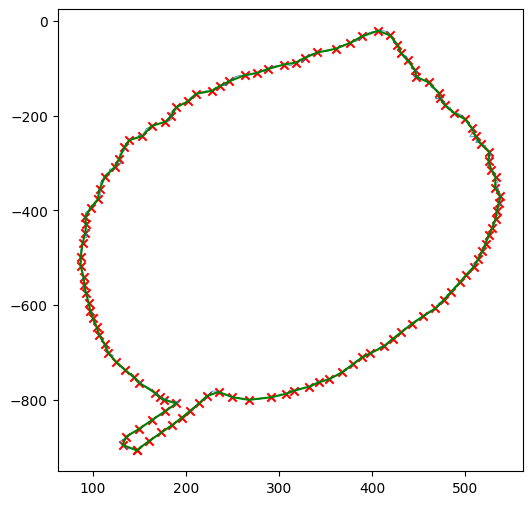

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2072.jpg
Contour shape: (4053, 2)


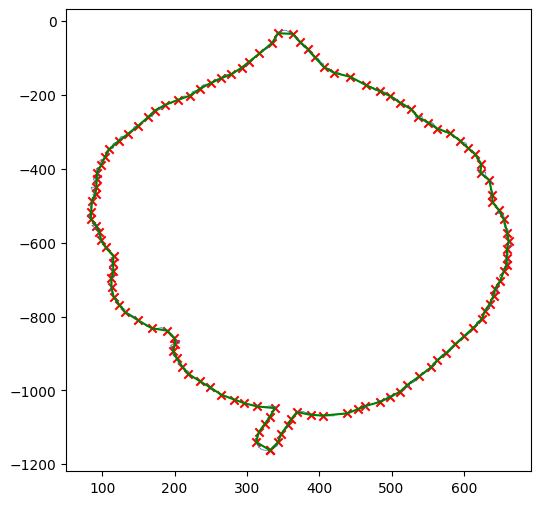

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2074.jpg
Contour shape: (3051, 2)


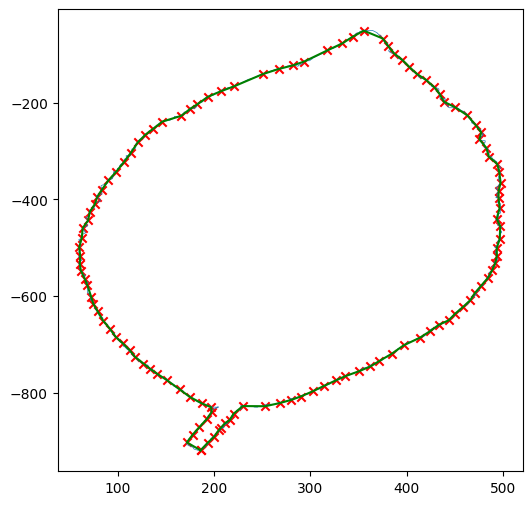

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2068.jpg
Contour shape: (5121, 2)


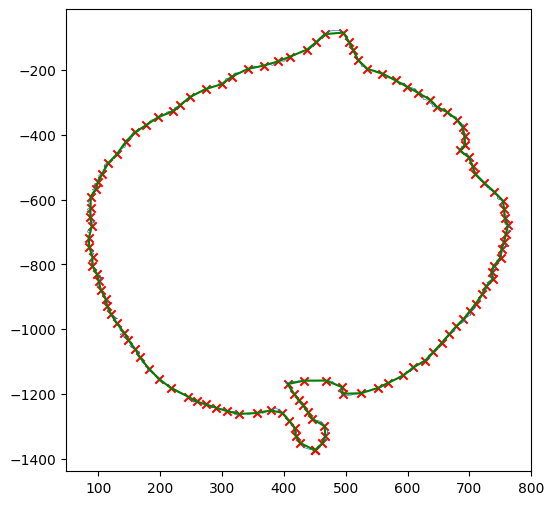

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2064.jpg
Contour shape: (3873, 2)


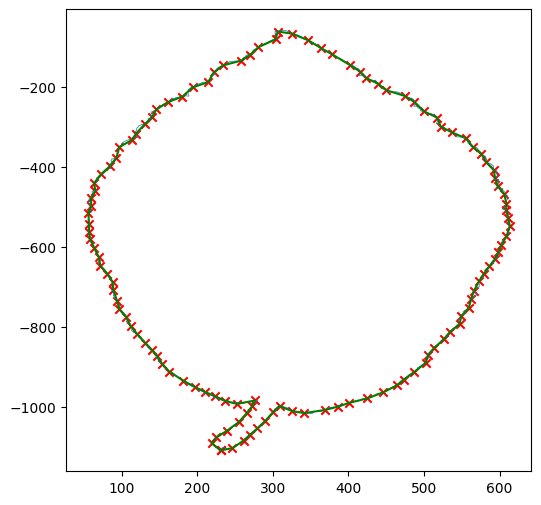

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2071.jpg
Contour shape: (4631, 2)


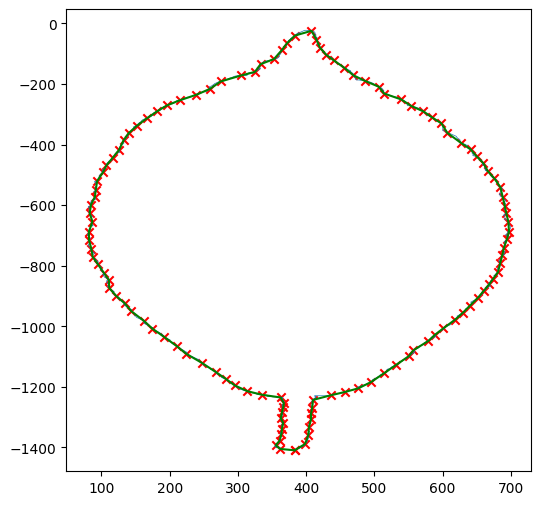

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2073.jpg
Contour shape: (4865, 2)


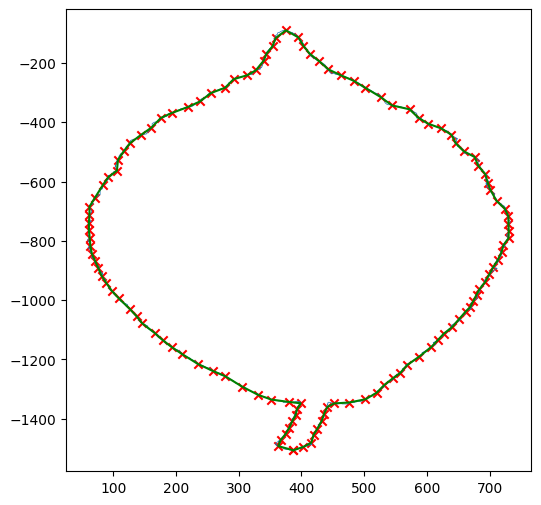

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2061.jpg
Contour shape: (4827, 2)


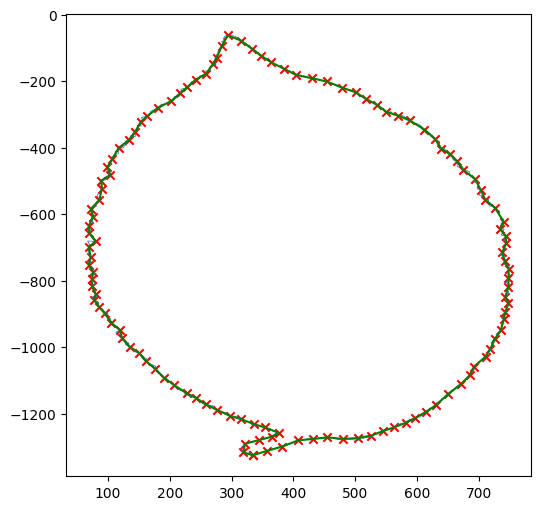

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2059.jpg
Contour shape: (4411, 2)


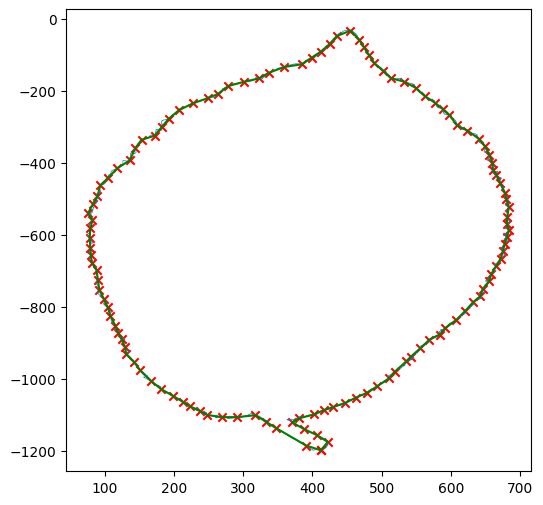

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2069.jpg
Contour shape: (3237, 2)


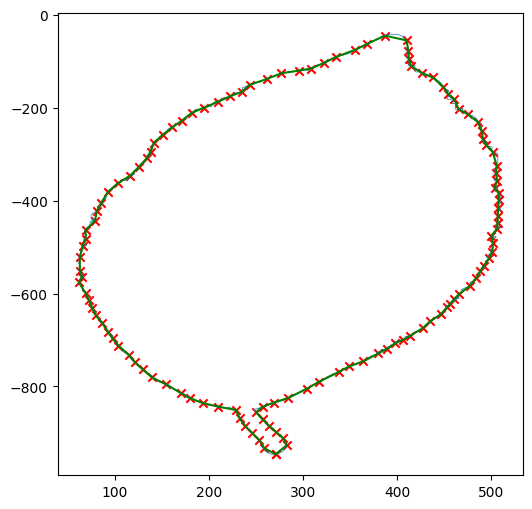

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 10/2056.jpg
Contour shape: (4815, 2)


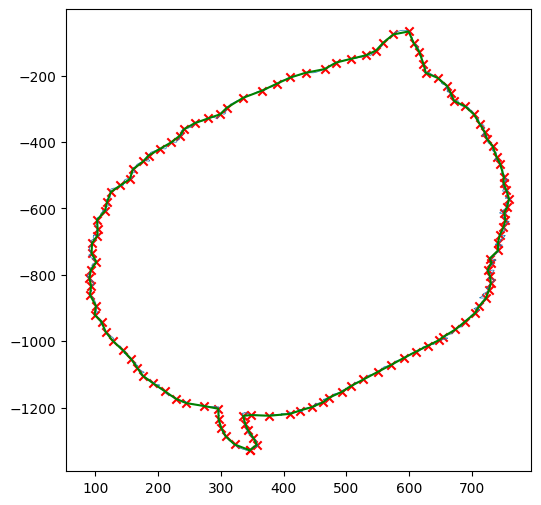

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1467.jpg
Contour shape: (2373, 2)


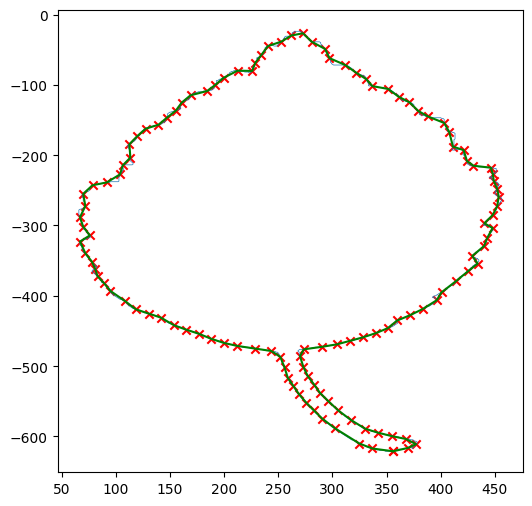

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1458.jpg
Contour shape: (3027, 2)


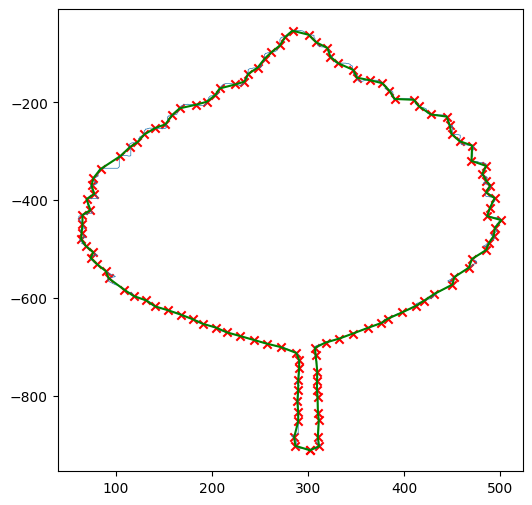

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1474.jpg
Contour shape: (2365, 2)


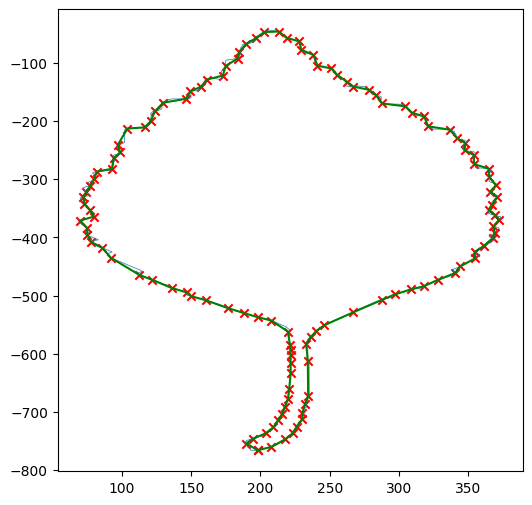

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1461.jpg
Contour shape: (3499, 2)


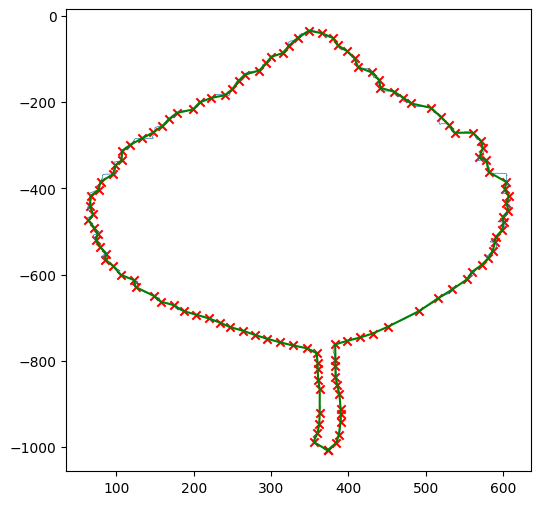

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1470.jpg
Contour shape: (2917, 2)


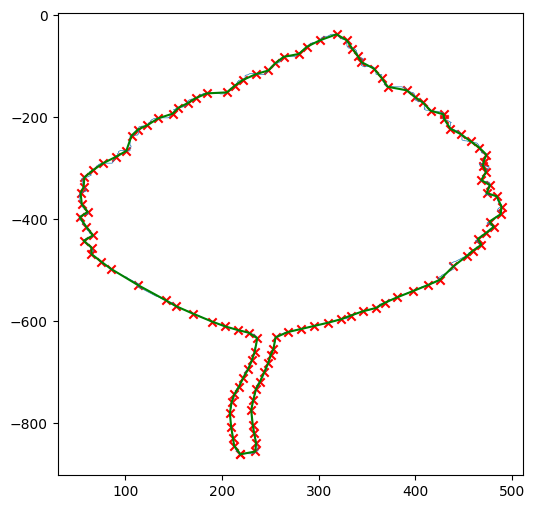

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1473.jpg
Contour shape: (2641, 2)


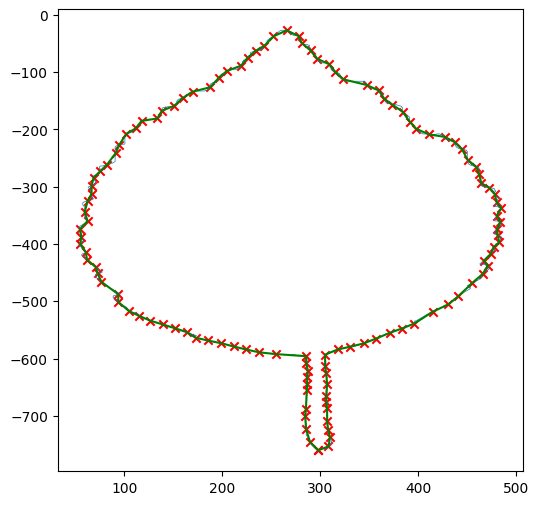

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1465.jpg
Contour shape: (2975, 2)


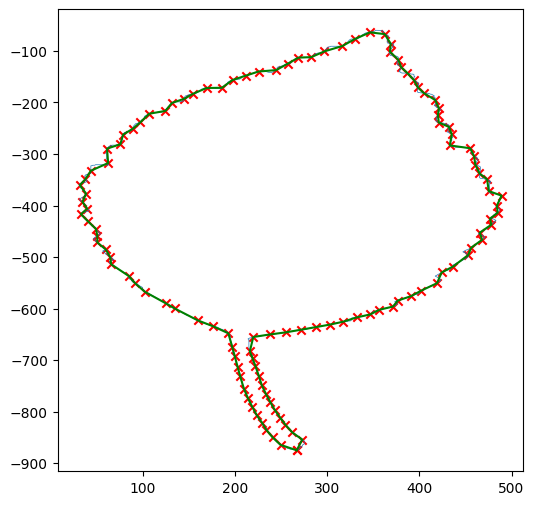

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1468.jpg
Contour shape: (3341, 2)


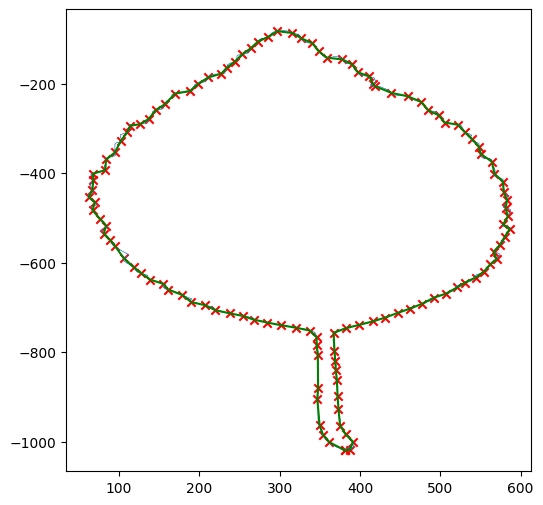

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1469.jpg
Contour shape: (2683, 2)


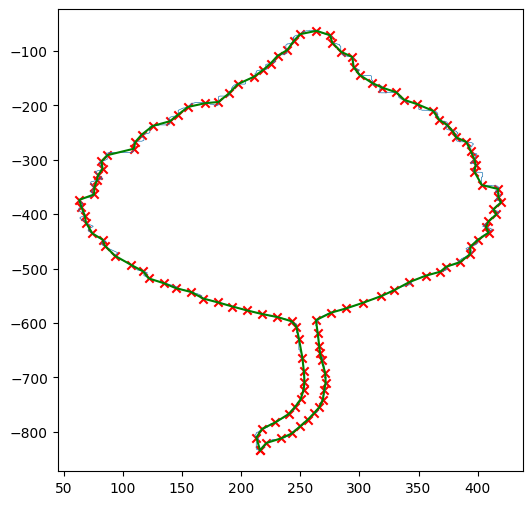

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1456.jpg
Contour shape: (3365, 2)


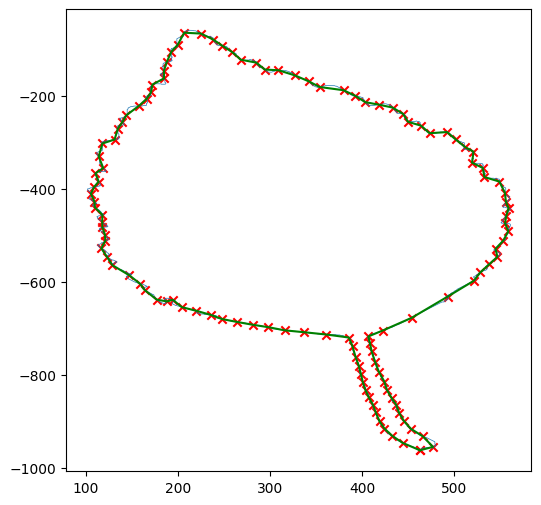

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1471.jpg
Contour shape: (3645, 2)


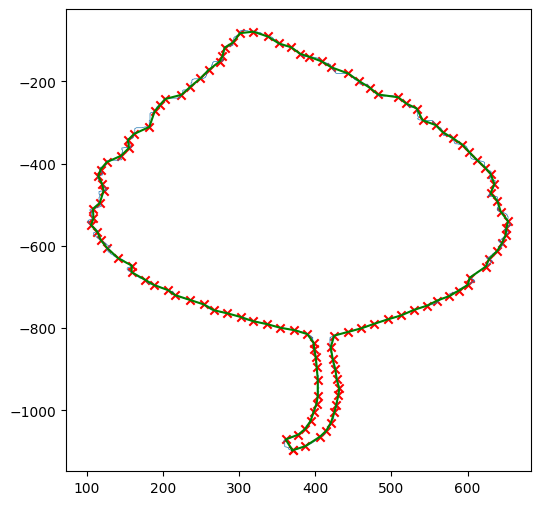

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1472.jpg
Contour shape: (3065, 2)


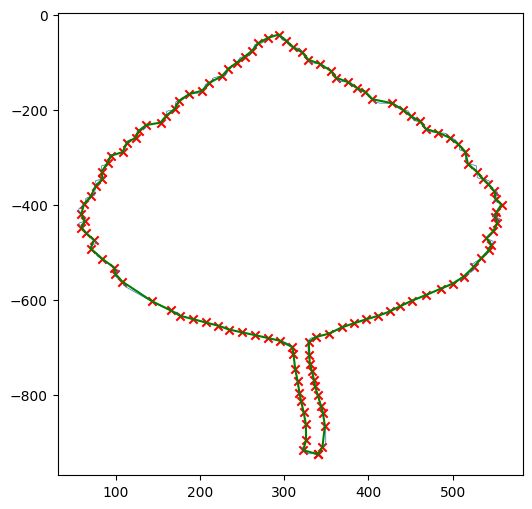

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1457.jpg
Contour shape: (3395, 2)


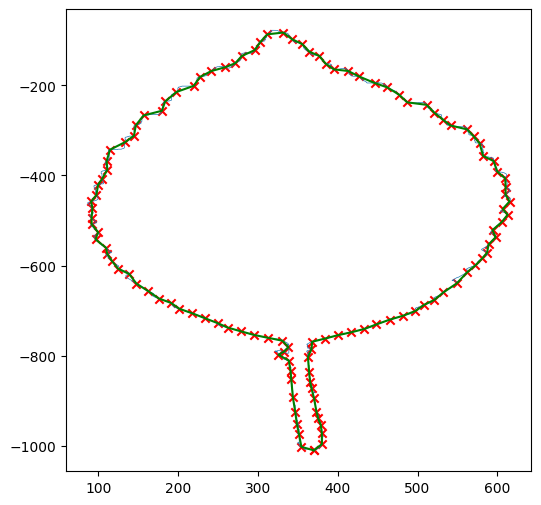

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1466.jpg
Contour shape: (3123, 2)


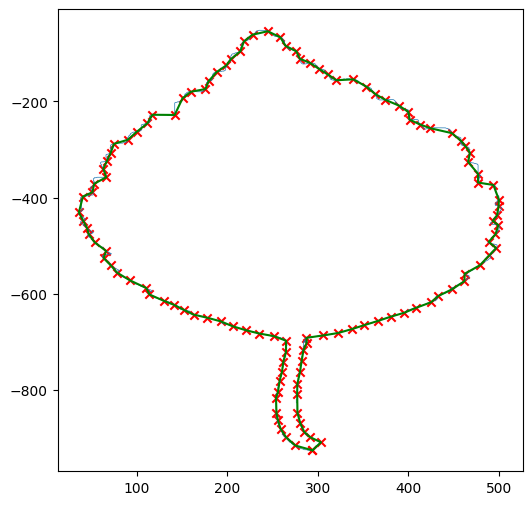

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1462.jpg
Contour shape: (3211, 2)


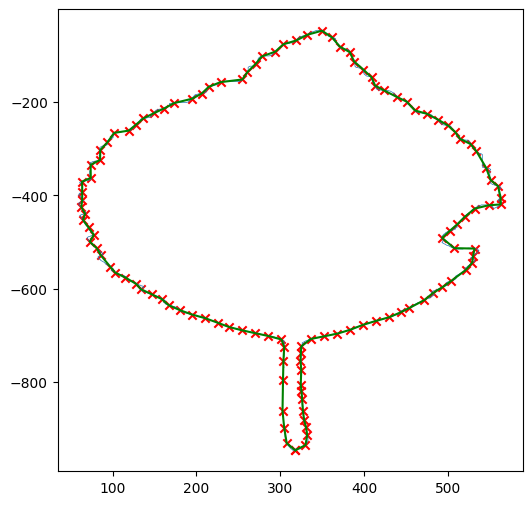

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1464.jpg
Contour shape: (2415, 2)


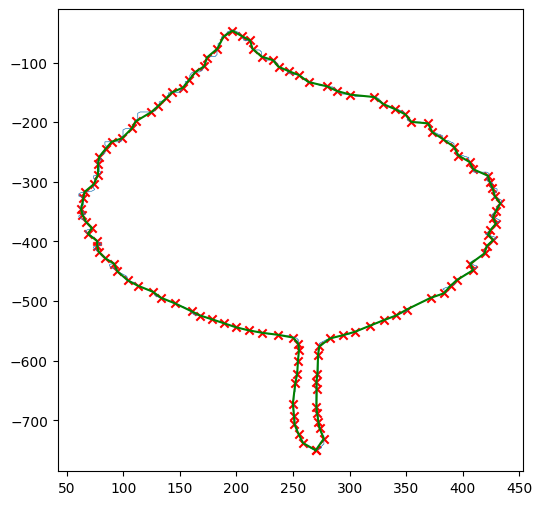

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1459.jpg
Contour shape: (3517, 2)


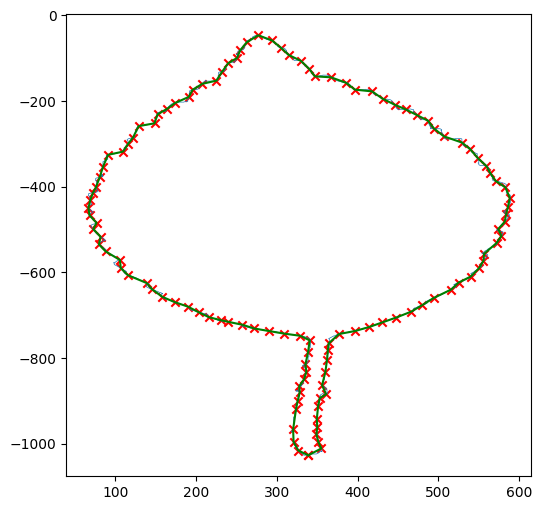

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1463.jpg
Contour shape: (2791, 2)


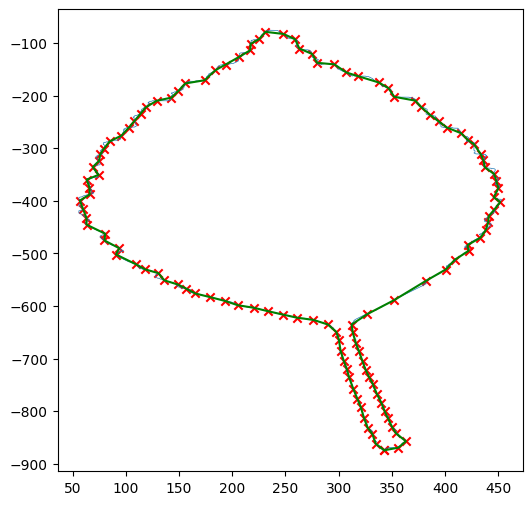

Final contour shape: (240,)
Processing image: /content/dataset/Swedish/Test/Leaf 4/1460.jpg
Contour shape: (3151, 2)


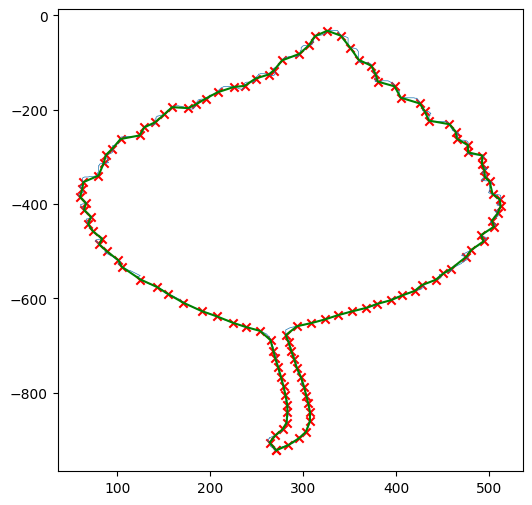

Final contour shape: (240,)


In [ ]:
# Set the paths for the training and testing datasets
#train_dir = '/content/dataset/Swedish/Train'
test_dir = '/content/dataset/Swedish/Test'

# List to hold the contour information
contour_data_test = []
# Loop through all images in the Test directory
for folder_name in os.listdir(test_dir):
    folder_path = os.path.join(test_dir, folder_name)
    if os.path.isdir(folder_path):
        for image_name in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_name)
            if image_name.endswith(".jpg"):
                print(f"Processing image: {image_path}")
                label, contour_points = process_image(image_path, folder_name)
                contour_data_test.append([label] + contour_points.tolist())


In [ ]:
max_contour_points = 240  # Set the expected number of contour points
columns = ['Label'] + [f'ContourPoint{i}' for i in range(1, max_contour_points + 1)]

contour_data_test = pd.DataFrame(contour_data_test, columns=columns)

# Save the DataFrame to a CSV file
#df_contours_test.to_csv('/content/swedish_leaf_contours.csv', index=False)

# Display the first few rows of the DataFrame
print(contour_data_test.head())

     Label  ContourPoint1  ContourPoint2  ContourPoint3  ContourPoint4  \
0  Leaf 11          591.0     575.774736     574.778542     569.646593   
1  Leaf 11          525.0     507.544548     512.895537     504.694464   
2  Leaf 11          678.0     653.885688     671.387049     679.914428   
3  Leaf 11          548.0     524.875875     516.788802     522.605341   
4  Leaf 11          689.0     668.759353     684.022826     685.128160   

   ContourPoint5  ContourPoint6  ContourPoint7  ContourPoint8  ContourPoint9  \
0     564.800207     559.773393     552.873903     544.893424     538.868662   
1     496.647460     488.791078     481.787008     474.589470     469.583396   
2     680.805888     681.112153     682.818150     683.807746     688.762702   
3     530.134166     536.395363     541.777268     542.498661     529.604785   
4     666.881999     648.627850     625.801894     605.292293     586.284376   

   ...  ContourPoint231  ContourPoint232  ContourPoint233  ContourPoint234

In [ ]:
contour_data_test

,Label,ContourPoint1,ContourPoint2,ContourPoint3,ContourPoint4,ContourPoint5,ContourPoint6,ContourPoint7,ContourPoint8,ContourPoint9,...,ContourPoint231,ContourPoint232,ContourPoint233,ContourPoint234,ContourPoint235,ContourPoint236,ContourPoint237,ContourPoint238,ContourPoint239,ContourPoint240
0,Leaf 11,591.0,575.774736,574.778542,569.646593,564.800207,559.773393,552.873903,544.893424,538.868662,...,-896.065703,-928.121609,-963.481144,-998.662027,-1032.194573,-1072.486136,-1106.465292,-1138.515854,-1177.070119,-1204.2
1,Leaf 11,525.0,507.544548,512.895537,504.694464,496.647460,488.791078,481.787008,474.589470,469.583396,...,-702.221102,-699.068049,-722.932713,-756.182235,-783.766497,-807.232908,-829.181440,-853.587266,-875.529695,-904.2
2,Leaf 11,678.0,653.885688,671.387049,679.914428,680.805888,681.112153,682.818150,683.807746,688.762702,...,-1482.831890,-1518.379406,-1561.860082,-1619.040723,-1673.010673,-1743.185305,-1791.788850,-1935.833328,-2009.673519,-2057.2
3,Leaf 11,548.0,524.875875,516.788802,522.605341,530.134166,536.395363,541.777268,542.498661,529.604785,...,-1027.397327,-1072.918758,-1099.106792,-1136.596656,-1171.122231,-1199.298811,-1235.886910,-1265.977230,-1294.767594,-1319.2
4,Leaf 11,689.0,668.759353,684.022826,685.128160,666.881999,648.627850,625.801894,605.292293,586.284376,...,-1031.933224,-1051.007619,-1076.909763,-1105.775487,-1138.500459,-1162.773409,-1190.083112,-1219.120988,-1243.858012,-1255.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,Leaf 4,318.0,307.798188,304.799698,302.798039,303.411696,303.886809,304.805707,301.485240,285.913861,...,-773.078116,-805.421744,-819.356818,-836.322869,-862.869546,-881.464483,-896.750455,-913.925529,-935.161702,-946.2
281,Leaf 4,270.0,258.799825,254.818537,251.227759,250.791897,249.800257,252.063926,253.675187,254.323643,...,-589.578627,-622.473284,-635.596049,-647.242548,-677.440819,-686.989311,-703.560770,-713.428018,-730.697870,-750.2
282,Leaf 4,339.0,326.781491,320.800014,320.279231,323.809427,325.792437,328.509932,327.845946,333.794491,...,-863.759940,-884.758579,-893.795873,-912.047580,-942.571135,-961.022427,-977.679375,-995.171444,-1011.240339,-1027.2
283,Leaf 4,343.0,334.801876,331.781130,327.295828,323.874096,320.870152,317.699716,313.845065,309.847342,...,-747.844782,-766.676714,-783.682852,-799.832932,-812.256936,-829.809447,-841.655166,-857.045610,-869.202306,-874.2
